In [10]:
# Dependencies (Needs songephys environment)
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle as pk
import umap
from scipy.stats.mstats import zscore

from IPython.display import display
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering

from sklearn.metrics import adjusted_rand_score
#from soundsig.sound import BioSound, WavFile, spectrogram
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from scipy.spatial.distance import pdist

import seaborn
seaborn.set(style="white")

# import helper functions
#from cluster_functions import cluster_analysis, plot_groupings, callColor, fine_to_coarse

%matplotlib inline
#summary = pk.load(open("/auto/zdrive/lthomas/summarySel.pkl",'rb'))

callColor = {
        'Be':(0/255.0, 230/255.0, 255/255.0),
        'Tu':(255/255.0, 200/255.0, 65/255.0),
        'Th':(255/255.0, 150/255.0, 40/255.0),
        'Alarm':(255/255.0, 200/255.0, 65/255.0),
        'Di':(255/255.0, 105/255.0, 15/255.0),
        'Ag':(255/255.0, 0/255.0, 0/255.0),
        'Fight':(255/255.0, 105/255.0, 15/255.0),
        'Wh':(255/255.0, 180/255.0, 255/255.0),
        'Ne':(255/255.0, 100/255.0, 255/255.0),
        'Te':(140/255.0, 100/255.0, 185/255.0),
        'Soft':(255/255.0, 180/255.0, 255/255.0),
        'DC':(100/255.0, 50/255.0, 200/255.0),
        'LT':(0/255.0, 95/255.0, 255/255.0),
        'Loud':(100/255.0, 50/255.0, 200/255.0),
        'song':(0, 0, 0),
        'So':(0,0,0), 
        'In': (0.49,0.60,0.55), 
        'Mo':(0.69,0.39,0.39)}

In [1]:
import google_auth_oauthlib.flow
from google.auth.transport.requests import Request
from google_auth_oauthlib.flow import InstalledAppFlow
from googleapiclient.discovery import build
from googleapiclient.http import MediaIoBaseDownload, MediaFileUpload
 
class Auth:
 
    def __init__(self, client_secret_filename, scopes):
        self.client_secret = client_secret_filename
        self.scopes = scopes
        self.flow = google_auth_oauthlib.flow.Flow.from_client_secrets_file(self.client_secret, self.scopes)
        self.flow.redirect_uri = 'http://localhost:8080/'
        self.creds = None
 
    def get_credentials(self):
        flow = InstalledAppFlow.from_client_secrets_file(self.client_secret, self.scopes)
        self.creds = flow.run_local_server(port=8080)
        return self.creds

 
# The scope you app will use. 
# (NEEDS to be among the enabled in your OAuth consent screen)
SCOPES = "https://www.googleapis.com/auth/drive.readonly"
CLIENT_SECRET_FILE = "/auto/zdrive/lthomas/Code/songephys/client_secrets.json"
 
credentials = Auth(client_secret_filename=CLIENT_SECRET_FILE, scopes=SCOPES).get_credentials()
 
drive_service = build('drive', 'v3', credentials=credentials)

def downloadfid(fid,outpath):
    cmd="curl -H \"Authorization: Bearer %s\" https://www.googleapis.com/drive/v3/files/%s?alt=media -o %s"%(credentials.token, fid,outpath)
    os.system(cmd)
def get_name_parent(fid):
    return drive_service.files().get(fileId=fid, fields='name, parents').execute()

def uploadfn(filename):
    media = MediaFileUpload(filename, mimetype="application/x-ustar", resumable=True)
    request = farm.animals().insert(media_body=media, body={'name': filename})
    response = None
    while response is None:
      status, response = request.next_chunk()
      if status:
        print("Uploaded %d%%." % int(status.progress() * 100))
    print( "Upload Complete!")

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=225544822063-j9rve5uf6io3ihiivrbn2rvorb779eo1.apps.googleusercontent.com&redirect_uri=http%3A%2F%2Flocalhost%3A8080%2F&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.readonly&state=gPlOnNjmoTeYyQ8WjjUn7NUvpzrxiC&access_type=offline


In [78]:
results = drive_service.files().list(pageSize=10, q="name='vocCuts.mat'",fields="files(id, name,parents)").execute()
downloadfid(results['files'][0]['id'],'/auto/zdrive/lthomas/vocCuts.mat')

In [9]:
#uploadfn('/auto/zdrive/lthomas/Code/vs265_sparse_zeebees/notebooks/Sparse_Coding/sparse-coding/Spectrograms_149_75.mat')
file_metadata = {'name': 'Spectrogram_149_75.mat'}
media = MediaFileUpload('/auto/zdrive/lthomas/Code/vs265_sparse_zeebees/notebooks/Sparse_Coding/sparse-coding/Spectrograms_149_75.mat')#, mimetype='image/jpeg')
file = drive_service.files().create(body=file_metadata,
                                    media_body=media,
                                    fields='id').execute()

RefreshError: The credentials do not contain the necessary fields need to refresh the access token. You must specify refresh_token, token_uri, client_id, and client_secret.

In [6]:
response = None
while response is None:
    stat, response = file.next_chunk()
    if stat:
        print("Uploaded %d%%." % int(stat.progress() * 100))
    

ResumableUploadError: <HttpError 403 "Insufficient Permission: Request had insufficient authentication scopes.">

In [109]:
import h5py
vocCutsContent = h5py.File('/auto/zdrive/lthomas/vocCuts.mat','r')
vocCutsContent[vocCutsContent['birdNameCuts'][0][0]][:]

array([[ 66],
       [108],
       [ 97],
       [ 66],
       [108],
       [ 97],
       [ 48],
       [ 53],
       [ 48],
       [ 54]], dtype=uint16)

In [97]:
results = drive_service.files().list(pageSize=10, q="name='summarySel.pkl'",fields="files(id, name,parents)").execute()
downloadfid(results['files'][0]['id'],'/auto/zdrive/lthomas/summarySel.pkl')

RefreshError: The credentials do not contain the necessary fields need to refresh the access token. You must specify refresh_token, token_uri, client_id, and client_secret.

In [ ]:
summary = pk.load(open("/auto/zdrive/lthomas/summarySel.pkl",'rb'))
summary[(summary['zAud'] > .5)&(summary['selInd'] > .1)].shape

In [55]:
for ind,row in summary[(summary['zAud'] > .5)&(summary['selInd'] > .1)].iterrows():
    print("birds/%s/%s/%s"%(row['bird'],row['site'],row['unit']))

birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl
birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl
birds/ZF7F/ZF7F_8_5t_190809_133540/goodPlayback-e19-c2.pkl
birds/ZF7F/ZF7F_4_5t_190718_091732/goodPlayback-e17-c1.pkl
birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e10-c65.pkl
birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e17-c31.pkl
birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e19-c32.pkl
birds/ZF7F/ZF7F_5_5t_190722_121506/goodPlayback-e19-c58.pkl
birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c31.pkl
birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c86.pkl
birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c85.pkl
birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c84.pkl
birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c34.pkl
birds/ZF5M/ZF5M_8t_190627_132428/goodPlayback-e12-c76.pkl
birds/ZF5M/ZF5M_9t_190630_100846/goodPlayback-e10-c79.pkl
birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c65.pkl
birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c67.pkl
birds/ZF

## Download files if necessary

In [6]:
for ind,row in summary[(summary['zAud'] > .5)&(summary['selInd'] > .1)].iterrows():
    results = drive_service.files().list(pageSize=10, q="name='%s'"%row['unit'],fields="files(id, name,parents)").execute()
    outpath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/"%(row['bird'],row['site'])
    os.makedirs(outpath,exist_ok=True)
    if os.path.exists("%s%s"%(outpath,row['unit'])):
        print("skipping %s%s"%(outpath,row['unit']))
        continue
    if len(results['files']) == 1:
        print("direct dl to %s%s"%(outpath,row['unit']))
        downloadfid(results['files'][0]['id'],"%s%s"%(outpath,row['unit']))
    else:
        for finfo in results['files']:
            if(row['site'] == get_name_parent(get_name_parent(finfo['parents'][0])['parents'][0])['name']):
                print("direct dl to %s%s"%(outpath,row['unit']))
                downloadfid(results['files'][0]['id'],"%s%s"%(outpath,row['unit']))
                continue

skipping /auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl
skipping /auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl
skipping /auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_8_5t_190809_133540/goodPlayback-e19-c2.pkl
skipping /auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_4_5t_190718_091732/goodPlayback-e17-c1.pkl
direct dl to /auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e10-c65.pkl
direct dl to /auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e17-c31.pkl
direct dl to /auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e19-c32.pkl
skipping /auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5_5t_190722_121506/goodPlayback-e19-c58.pkl
direct dl to /auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c31.pkl
direct dl to /auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c86.pkl
direct

## Go through the good units, and do neural clustering on them

In [44]:
callColor = {
        'Be':(0/255.0, 230/255.0, 255/255.0),
        'Tu':(255/255.0, 200/255.0, 65/255.0),
        'Th':(255/255.0, 150/255.0, 40/255.0),
        'Alarm':(255/255.0, 200/255.0, 65/255.0),
        'Di':(255/255.0, 105/255.0, 15/255.0),
        'Ag':(255/255.0, 0/255.0, 0/255.0),
        'Fight':(255/255.0, 105/255.0, 15/255.0),
        'Wh':(255/255.0, 180/255.0, 255/255.0),
        'Ne':(255/255.0, 100/255.0, 255/255.0),
        'Te':(140/255.0, 100/255.0, 185/255.0),
        'Soft':(255/255.0, 180/255.0, 255/255.0),
        'DC':(100/255.0, 50/255.0, 200/255.0),
        'LT':(0/255.0, 95/255.0, 255/255.0),
        'Loud':(100/255.0, 50/255.0, 200/255.0),
        'song':(0, 0, 0),
        'So':(0,0,0), 
        'In': (0.49,0.60,0.55), 
        'Mo':(0.69,0.39,0.39),

        'Ri': ()}
fine_to_coarse = {
    'Ag': 'Fight',
    'Di': 'Fight',
    'Ne': 'Soft',
    'Wh': 'Soft',
    'Te': 'Soft',
    'LT': 'Loud',
    'DC': 'Loud',
    'Th': 'Alarm',
    'Tu': 'Alarm',
    'Be': 'Be',
    'In': 'song',
    'Mo': 'song'
}

def cluster_analysis(representation, labels, and_plot=False, use_umap=False, method='ward',criterion='distance',save=None):
    numcomps = min(20, representation.shape[1])
    nfiles = 5
    MesPCS = dict()
    if use_umap:
        MesPCS = umap.UMAP(
            ).fit_transform(representation[:,:])
    else:
        # first run PCA with a large amount of components
        pca = PCA(n_components=numcomps)
        pca.fit_transform(representation[:,:])
        #Find the number of components that represent 95% of variance
        nc = np.where(np.cumsum(pca.explained_variance_ratio_)>.95)[0][0]
        pca = PCA(n_components=nc)
        MesPCS=pca.fit_transform(representation[:,:])

    PCs4Linkage=MesPCS
    clustered=linkage(PCs4Linkage,method =method)# this works now
    cophen_dist = cophenet(clustered)
    call_types = np.unique(labels)
    ctlist = call_types.tolist()

    max_ari = 0
    max_cl = 0

    delta = (clustered.max()-clustered.min())/500 #.1
    start_thresh = clustered.min()#100 #.25
    for cl in range(1,500):
        F = fcluster(clustered, start_thresh + cl*delta, criterion=criterion)
        # check ari
        compares = [[],[]]
        for gid in range(max(F)):
            for j in np.where(F==gid)[0]:
                    vt = labels[j]
                    compares[0].append(ctlist.index(vt))
                    compares[1].append(gid)
        ari = adjusted_rand_score(compares[0],compares[1])
        #print("%s %s"%(ari,start_thresh + cl*delta))
        # previously just go until 10 groups
        #if max(F) < 10:
        #    break
        if ari == 1.0:# or ari == 0.0:
            break
        if ari > max_ari:
            max_cl = cl
            max_ari = ari
    F = fcluster(clustered,  start_thresh + max_cl*delta, criterion=criterion)
    print("-------------")
    print("ARI: %s"%max_ari)
    if and_plot:
        plt.figure(figsize= (40,20))
        D = dendrogram(Z=clustered, leaf_rotation=90.,
             leaf_font_size=20., # determine number by plotting cluster colors on leaves first
             #labels= listfinesem_calls[0], #finesem_calls[1:7633],
             labels=np.array(labels), #voc_types,#plottinglabels,
             color_threshold= start_thresh+max_cl*delta,
             above_threshold_color='grey')
        #out_PSTH_KDEs['PCA_Group'][i,:] = F
        ax = plt.gca()
        xlbls = ax.get_xmajorticklabels()
        for t in xlbls:
            t.set_color(callColor.get(t.get_text(),(0, 0, 0))
        if save is not None:
            plt.savefig(save)
        plt.show()
    return F,max_ari, MesPCS

def plot_groupings(signal, groups, save = None):
    
    ncs=int(max(groups)/5+.5)
    fig, ax = plt.subplots(min(5,max(groups)), ncs, sharex='col')
    for r in range(min(5,max(groups))):
        for c in range(ncs):
            gid = r*ncs+c%ncs+1
            ax_tmp = ax[r,c] if ncs > 1 else ax[r]
            for j in np.where(groups==gid)[0]:
                ax_tmp.plot(signal[j,:]) 
            ax_tmp.set_ylim(0,round(signal.max()/10 + .5)*10)
    #for x in ax.flatten():
    #    x.set_ylim=(0,50)
    if save is not None:
        plt.savefig(save)
    plt.show()

SyntaxError: invalid syntax (<ipython-input-44-74e11ae6500e>, line 97)

/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl
-------------
ARI: 0.08960843972389562


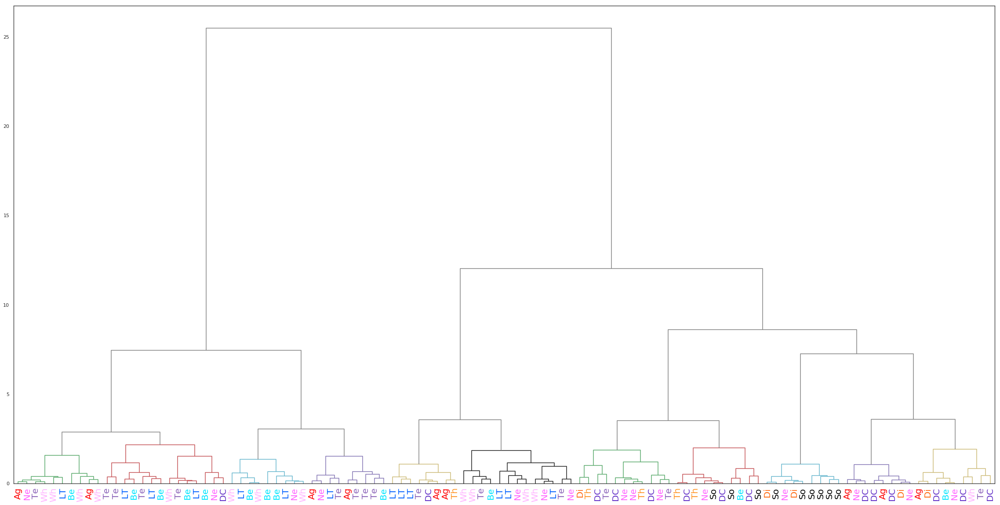

/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl
-------------
ARI: 0.051390784110174566


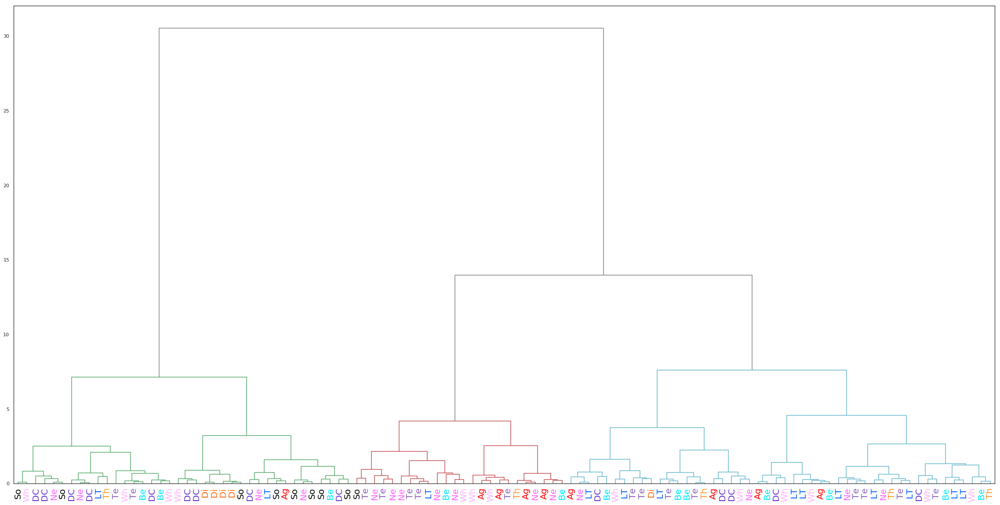

/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_8_5t_190809_133540/goodPlayback-e19-c2.pkl
-------------
ARI: 0.08141741414003616


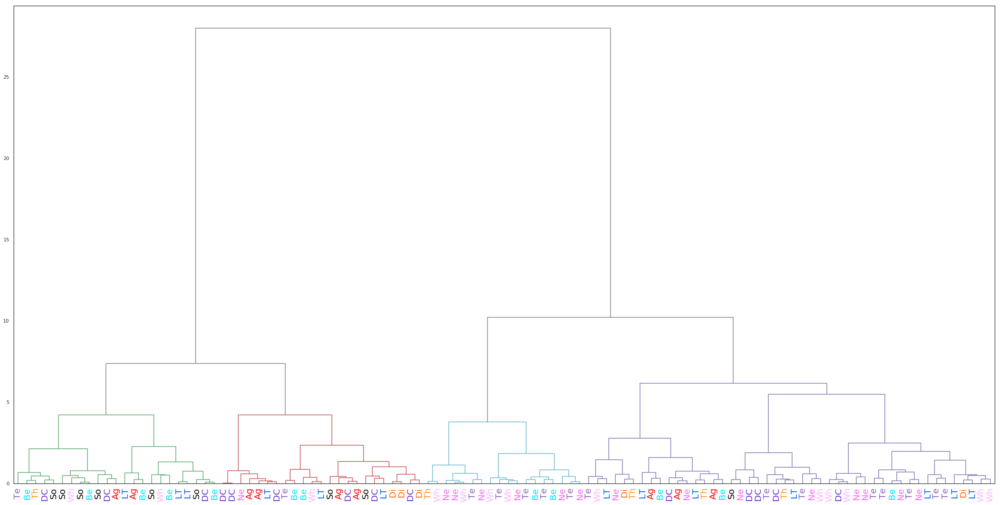

/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_4_5t_190718_091732/goodPlayback-e17-c1.pkl
-------------
ARI: 0.030701796774844588


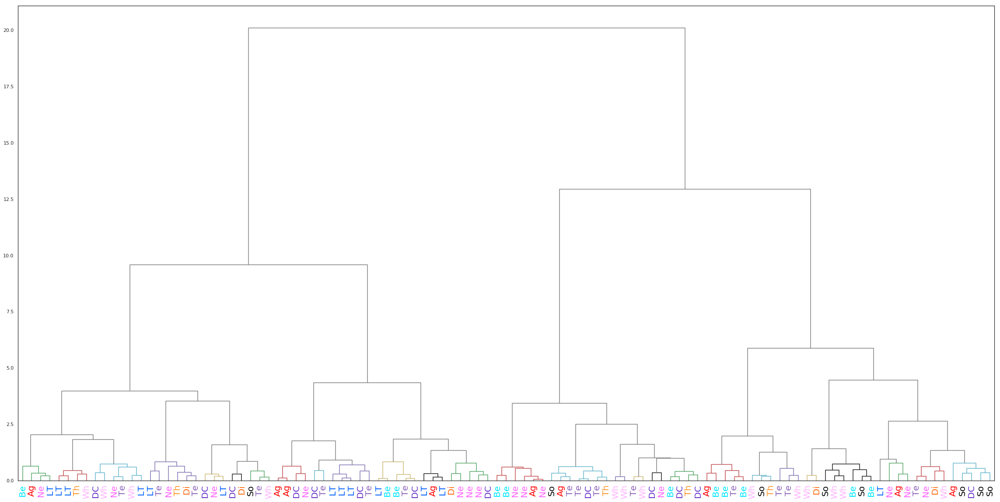

/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e10-c65.pkl
-------------
ARI: 0.04054988456174483


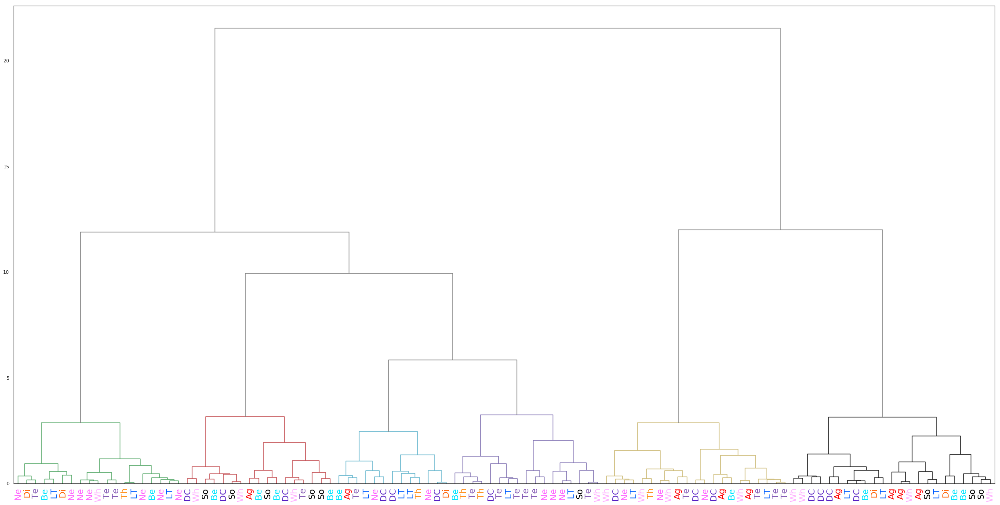

/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e17-c31.pkl
-------------
ARI: 0.0642924007948246


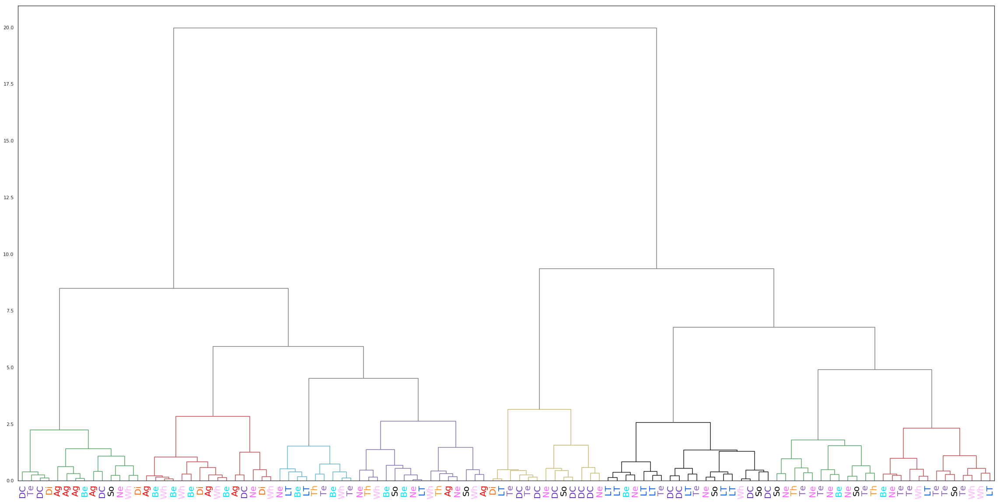

/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e19-c32.pkl
-------------
ARI: 0.1059795347634212


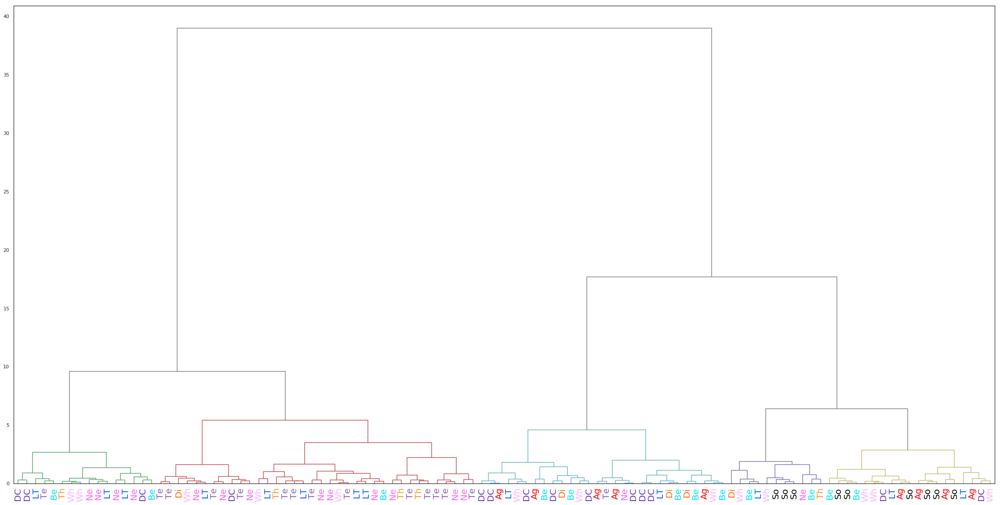

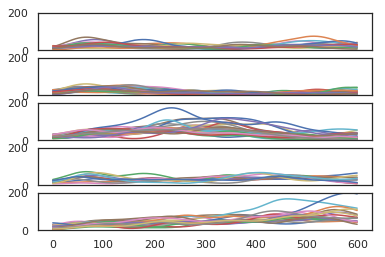

/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5_5t_190722_121506/goodPlayback-e19-c58.pkl
-------------
ARI: 0.05765764253456442


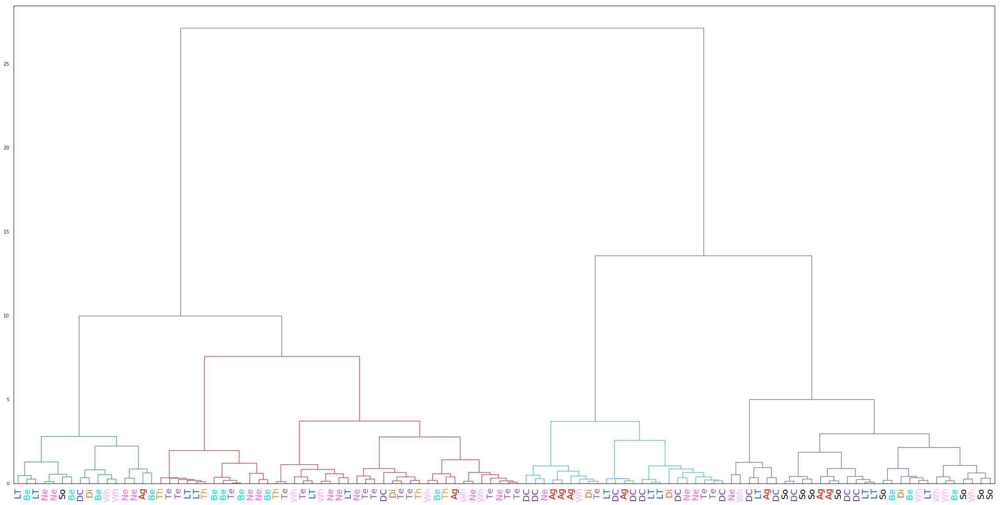

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c31.pkl
-------------
ARI: 0.011961211725045004


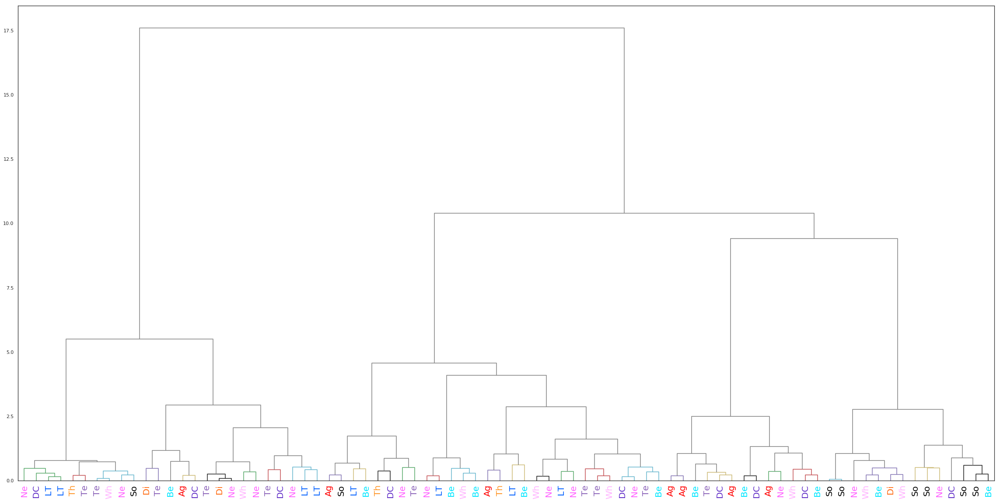

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c86.pkl
-------------
ARI: 0.05034098254346237


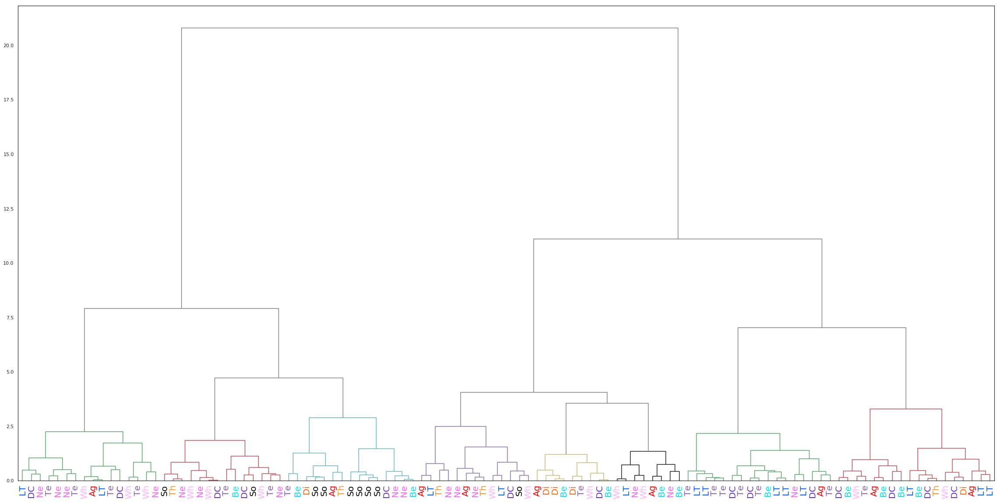

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c85.pkl
-------------
ARI: 0.04702747273749912


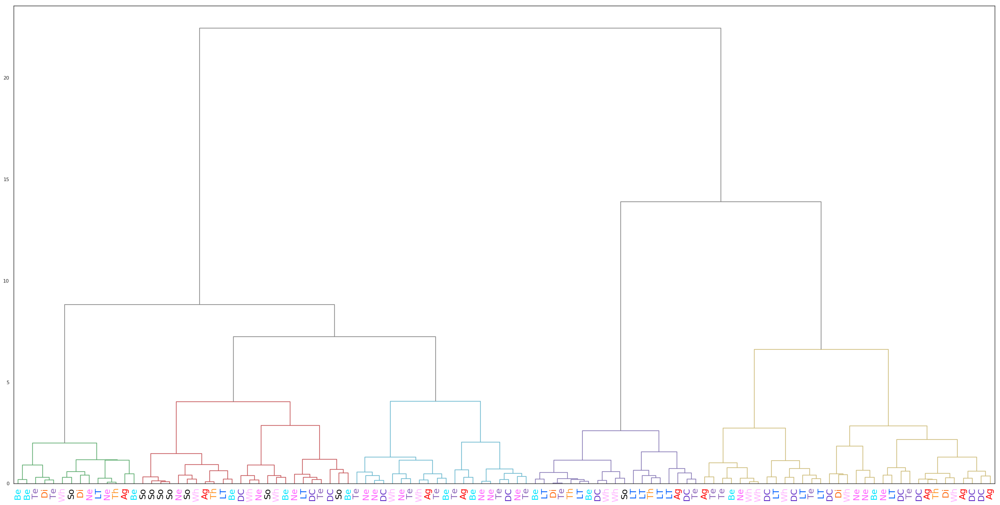

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c84.pkl
-------------
ARI: 0.03582482116603123


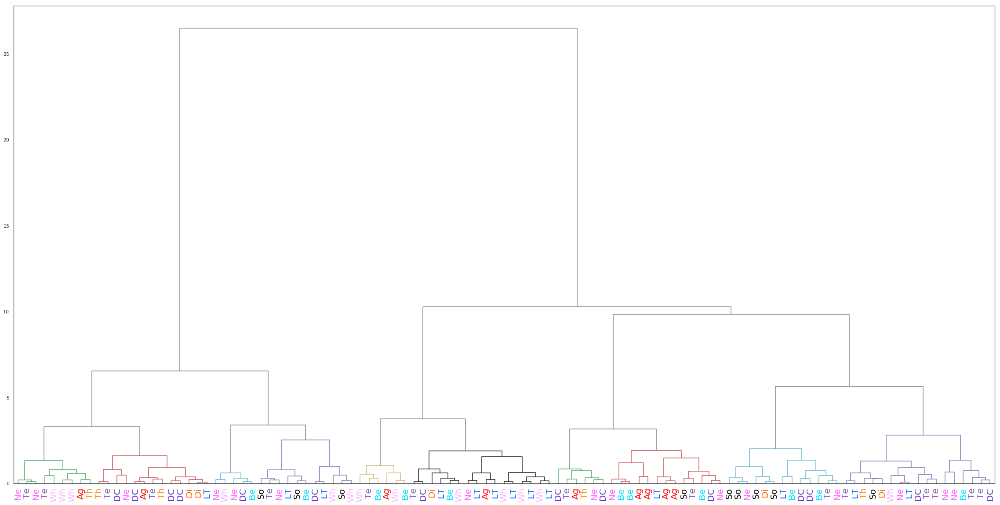

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c34.pkl
-------------
ARI: 0.05615589016829053


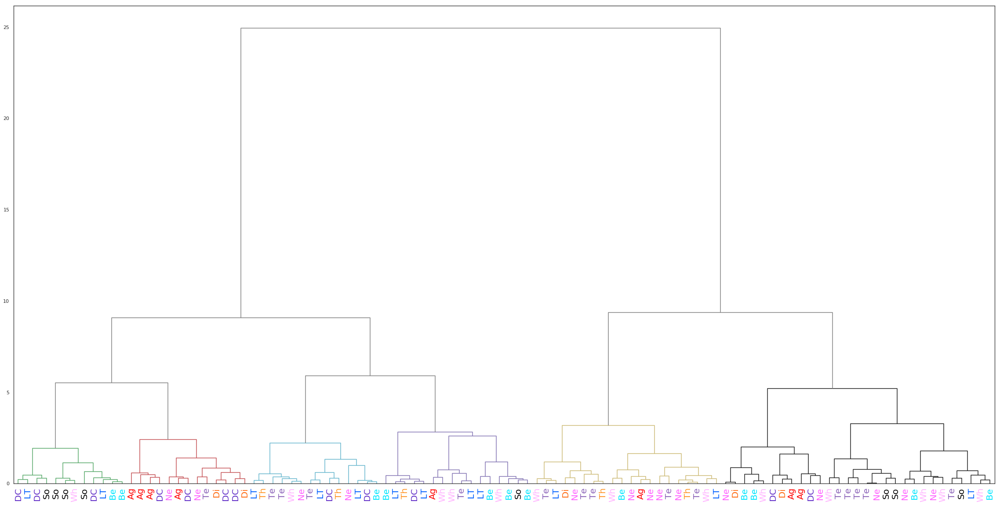

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_8t_190627_132428/goodPlayback-e12-c76.pkl
-------------
ARI: 0.049053962891995144


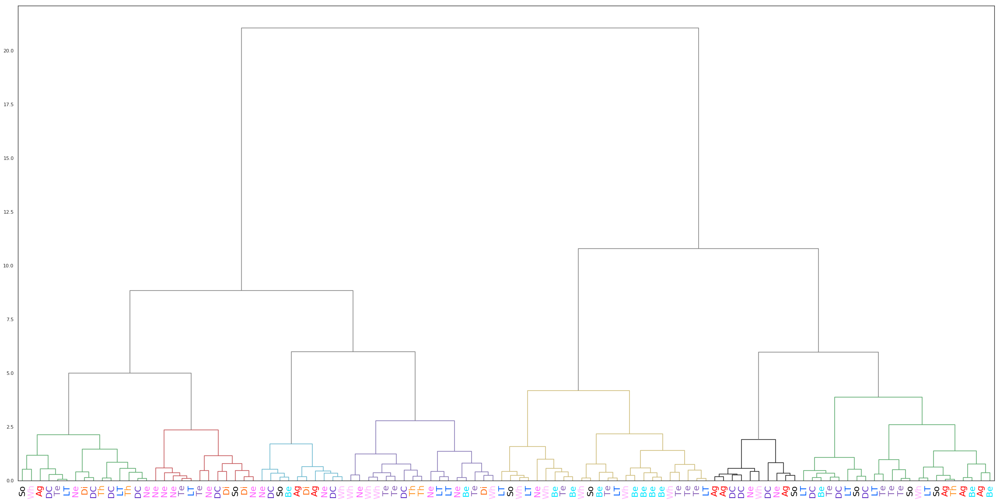

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_9t_190630_100846/goodPlayback-e10-c79.pkl
-------------
ARI: 0.03686837197052358


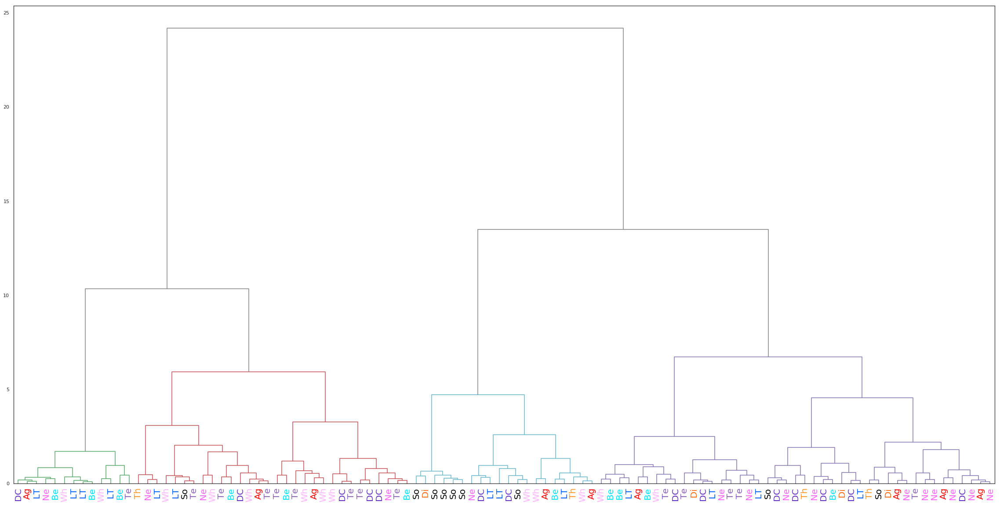

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c65.pkl
-------------
ARI: 0.0509625061561851


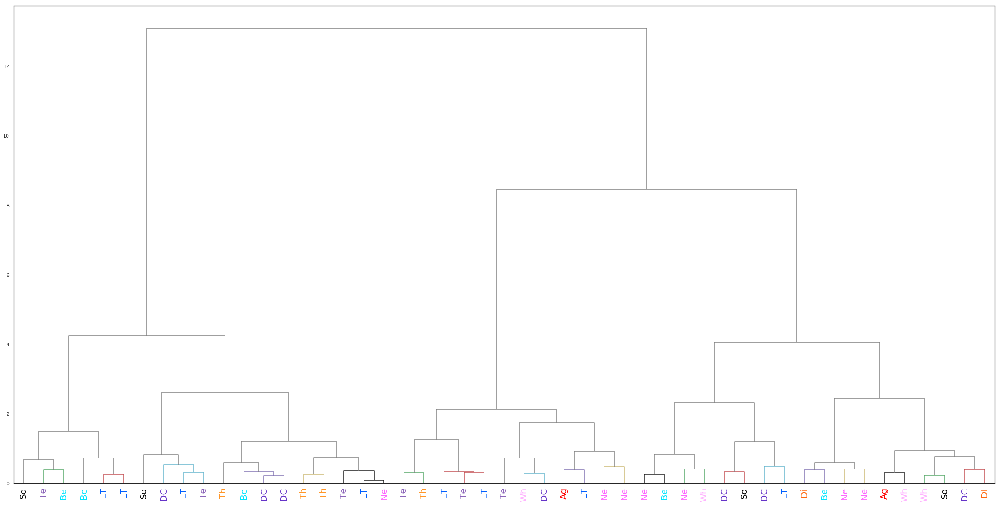

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c67.pkl
-------------
ARI: 0.03947062920826562


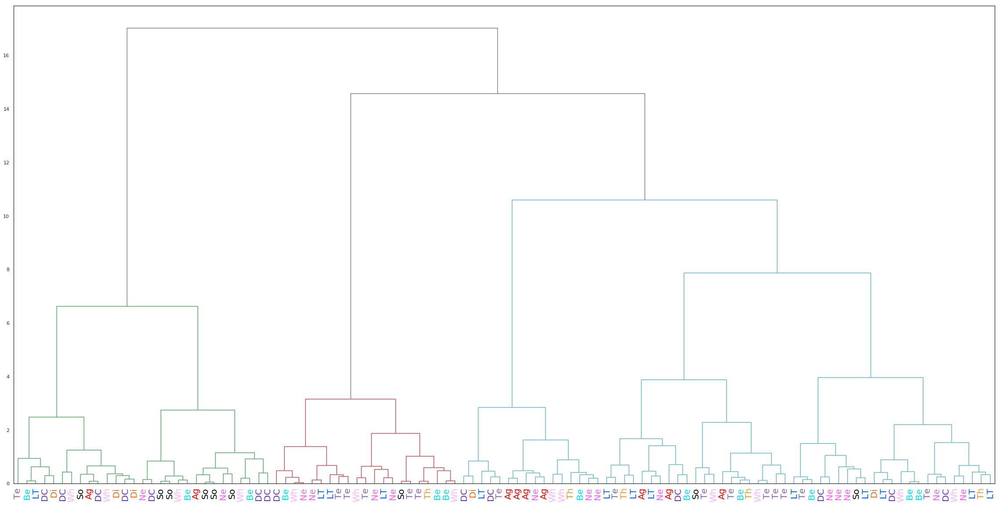

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c29.pkl
-------------
ARI: 0.015899492493877992


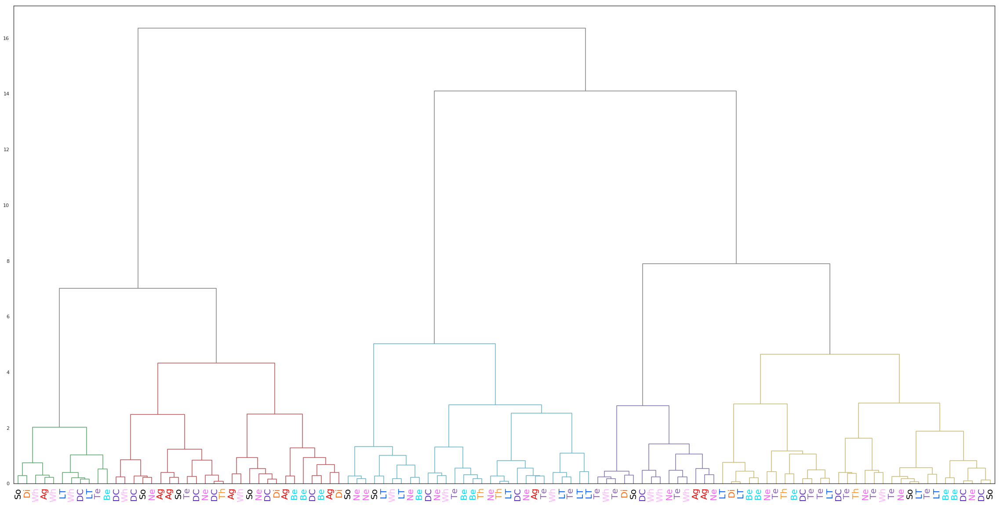

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c28.pkl
-------------
ARI: 0.03290376696660057


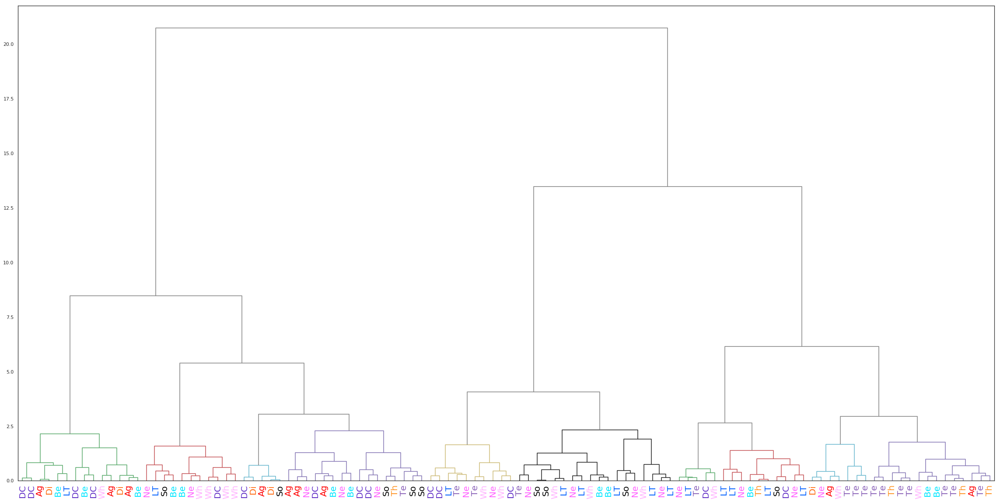

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c51.pkl
-------------
ARI: 0.04348965225215689


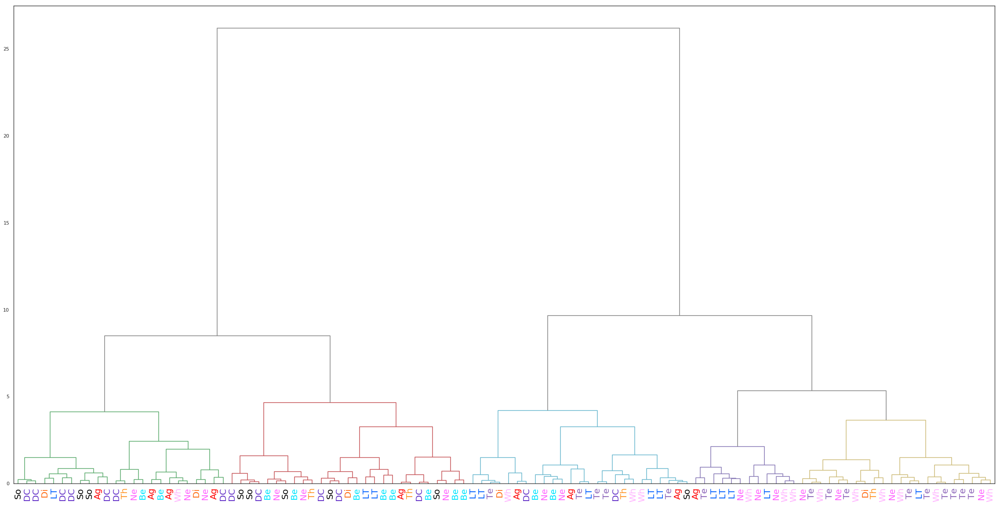

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c52.pkl
-------------
ARI: 0.0391658222047234


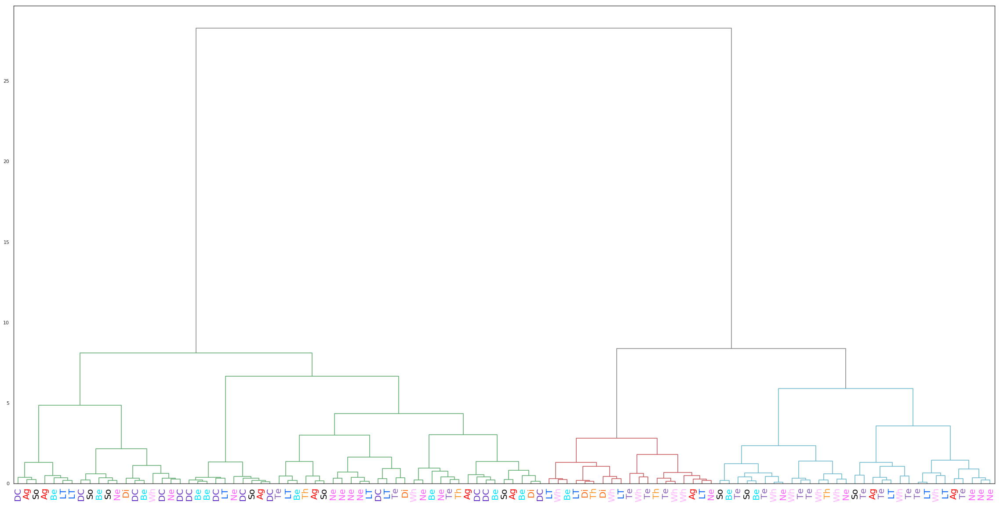

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e13-c14.pkl
-------------
ARI: 0.113706125396607


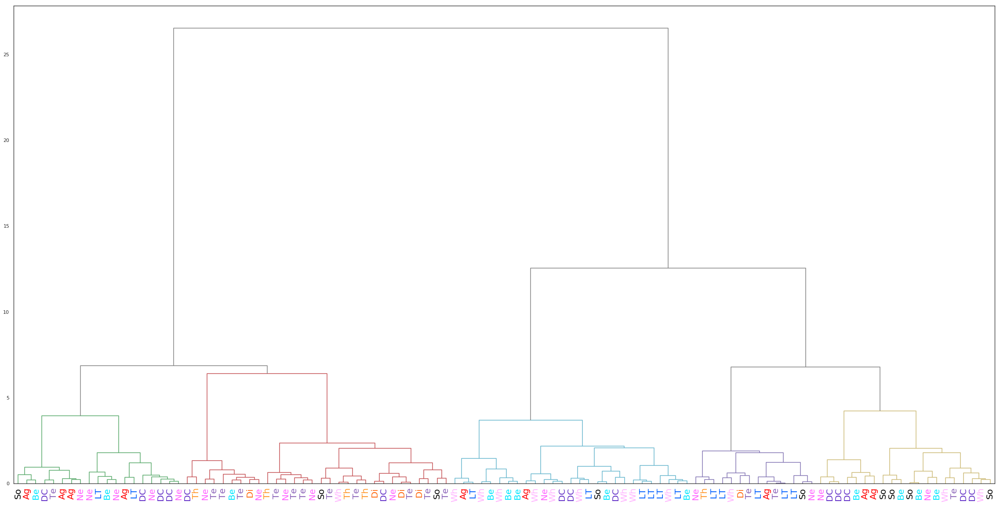

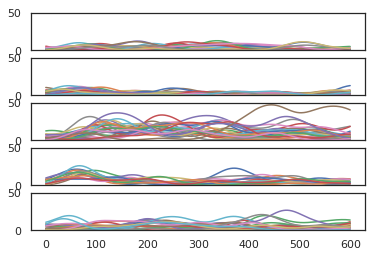

/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_121850/goodPlayback-e10-c72.pkl
-------------
ARI: 0.08655950976026705


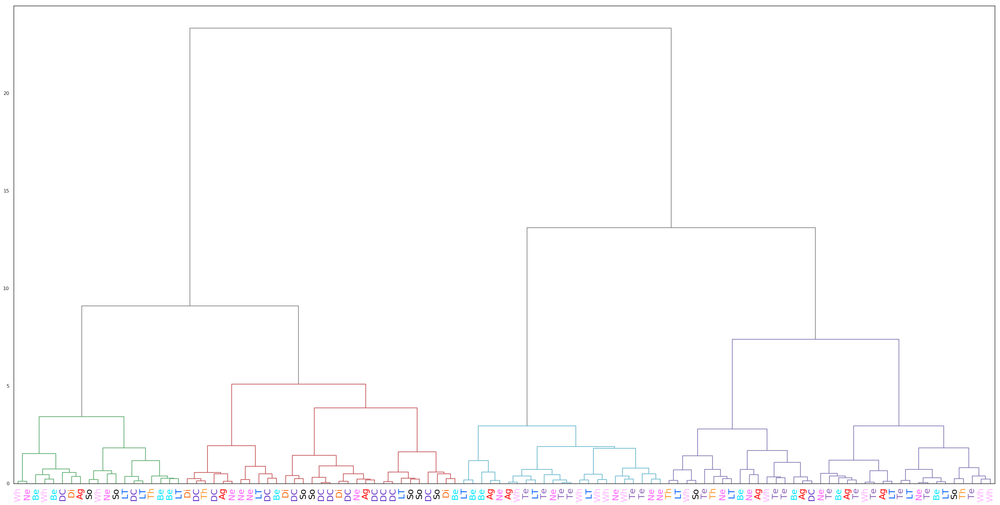

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e17-c3.pkl
-------------
ARI: 0.05035922203521776


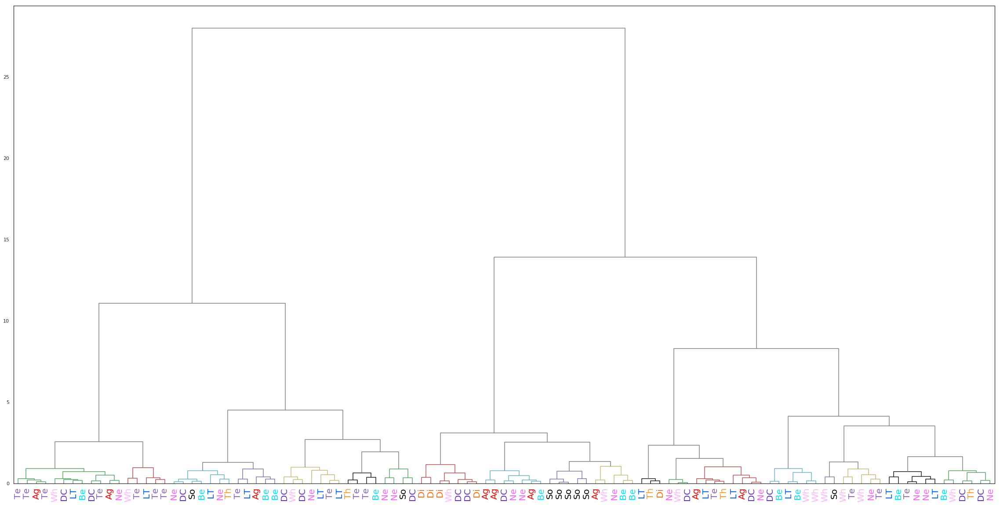

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e9-c13.pkl
-------------
ARI: 0.05128919903321561


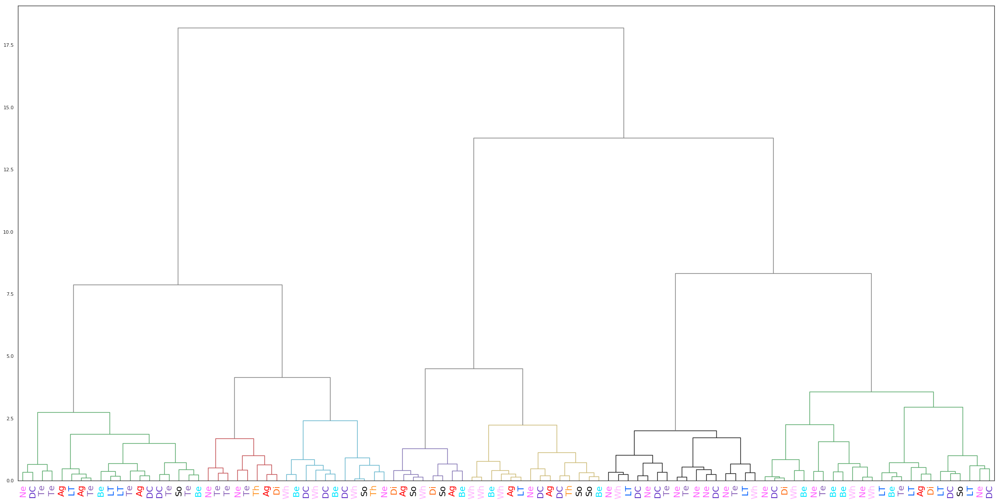

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e16-c66.pkl
-------------
ARI: 0.1121352096922506


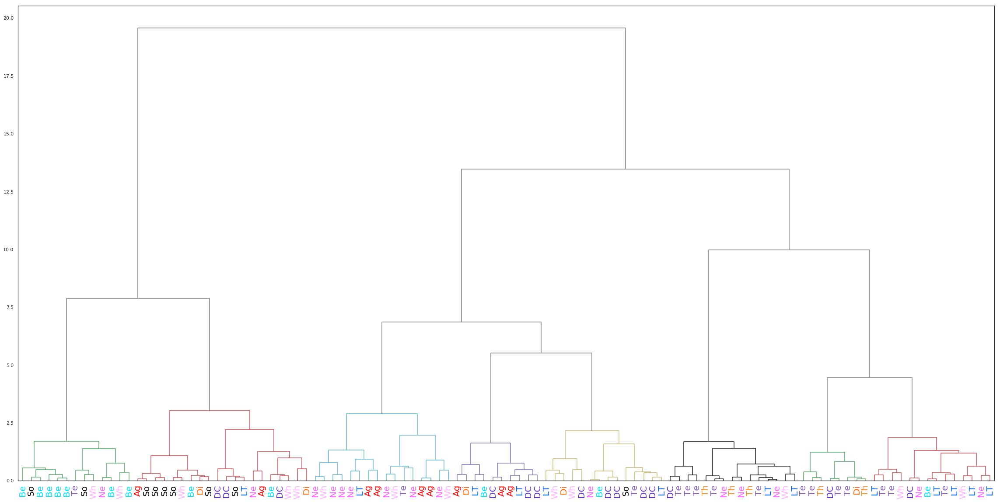

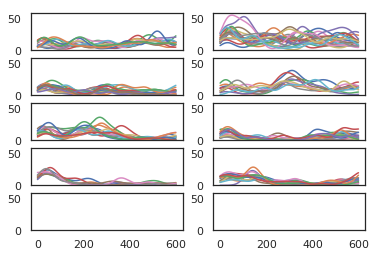

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c38.pkl
-------------
ARI: 0.07299853253308794


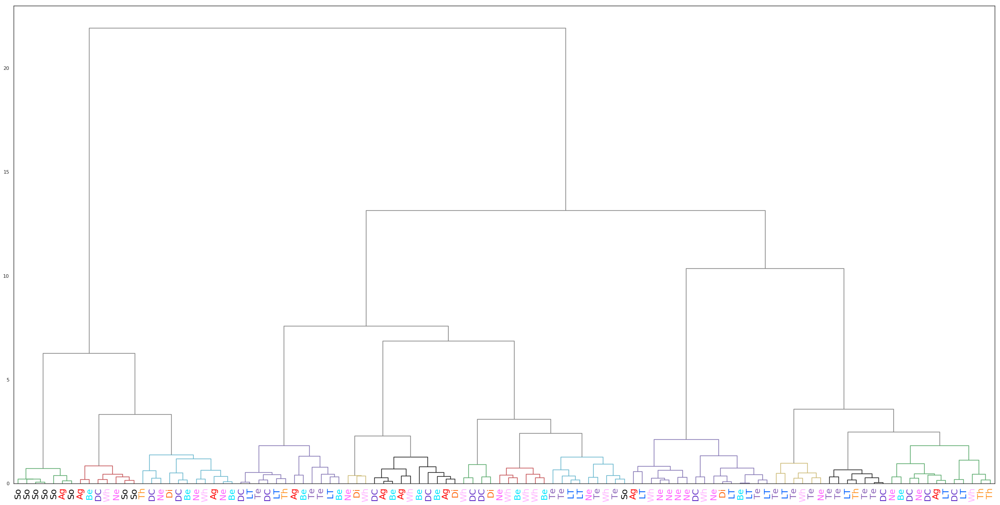

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c36.pkl
-------------
ARI: 0.09017296468551345


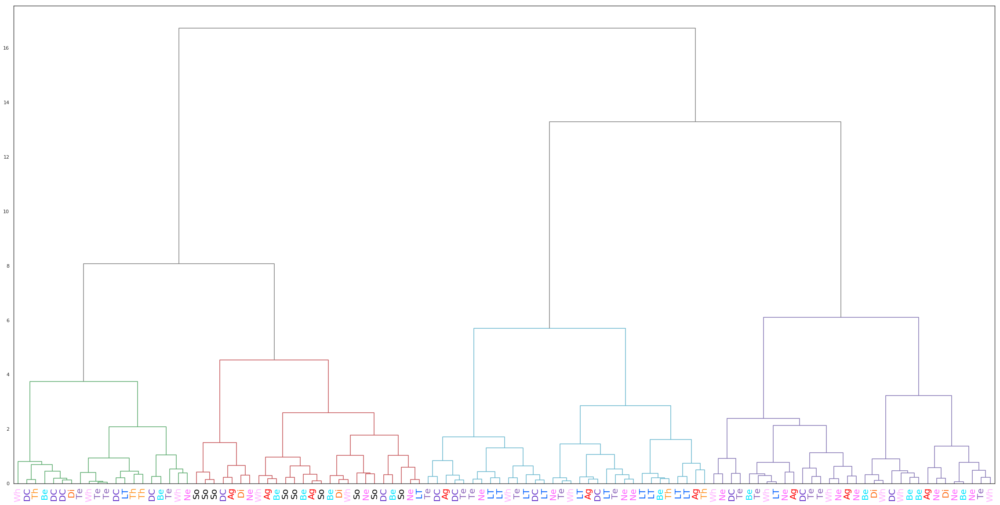

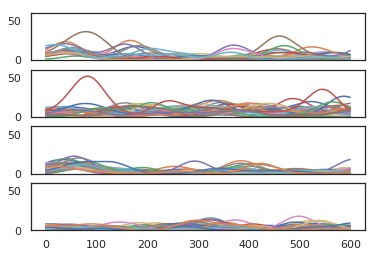

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e18-c4.pkl
-------------
ARI: 0.0806450101863816


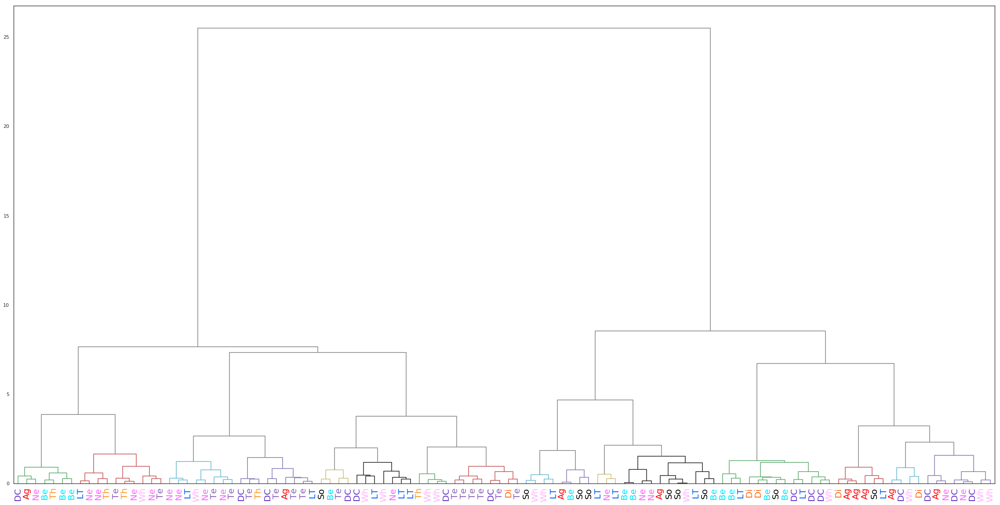

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e10-c1.pkl
-------------
ARI: 0.04343183984747377


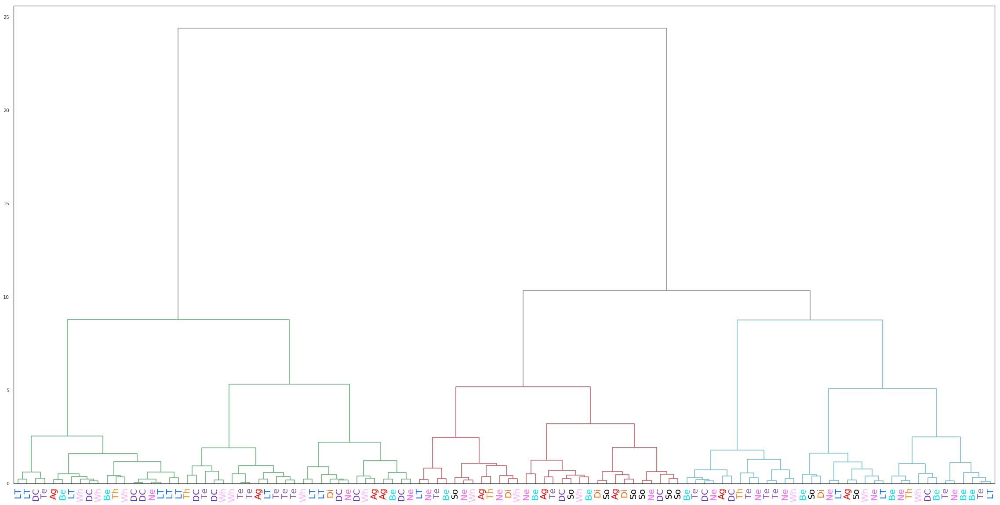

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e16-c96.pkl
-------------
ARI: 0.0374082763950554


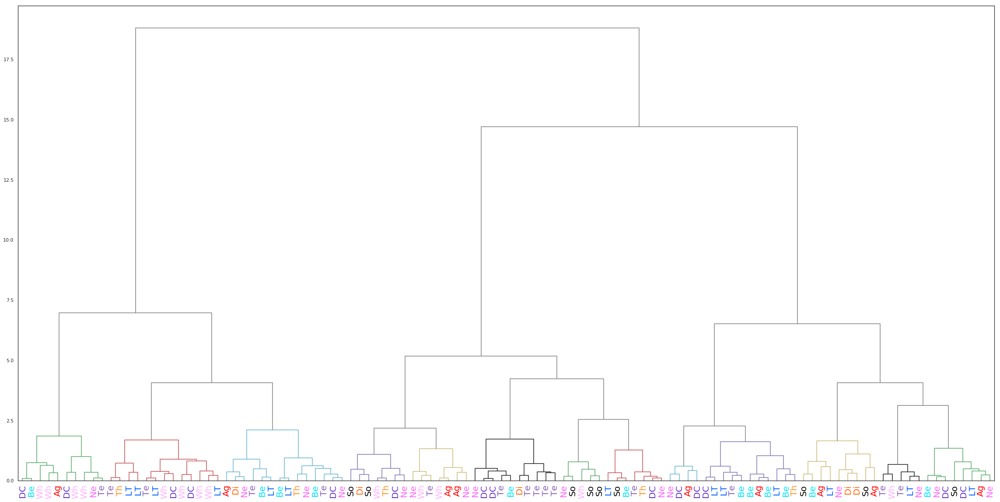

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c57.pkl
-------------
ARI: 0.11924259521911527


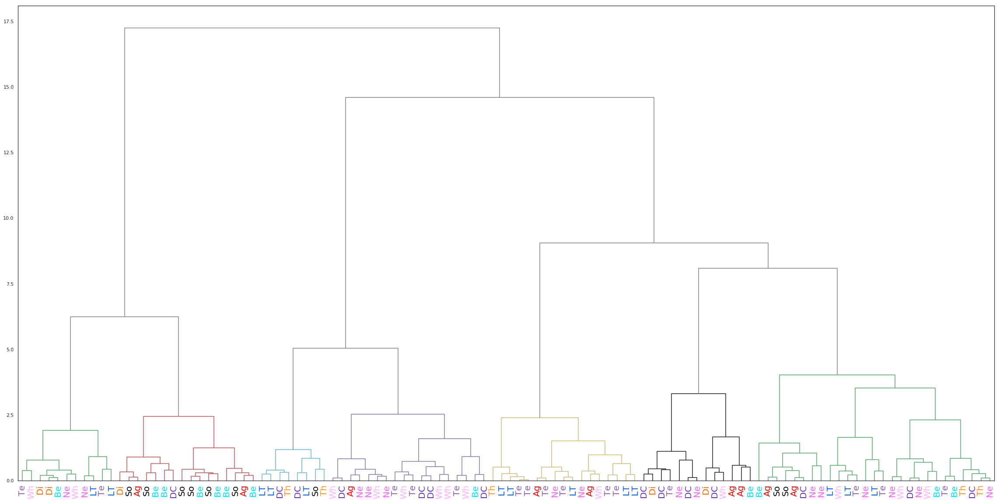

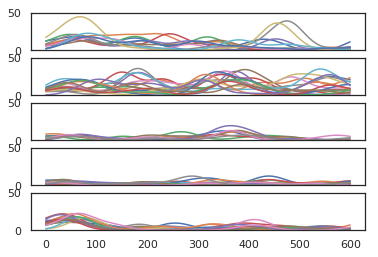

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c58.pkl
-------------
ARI: 0.04619129553921611


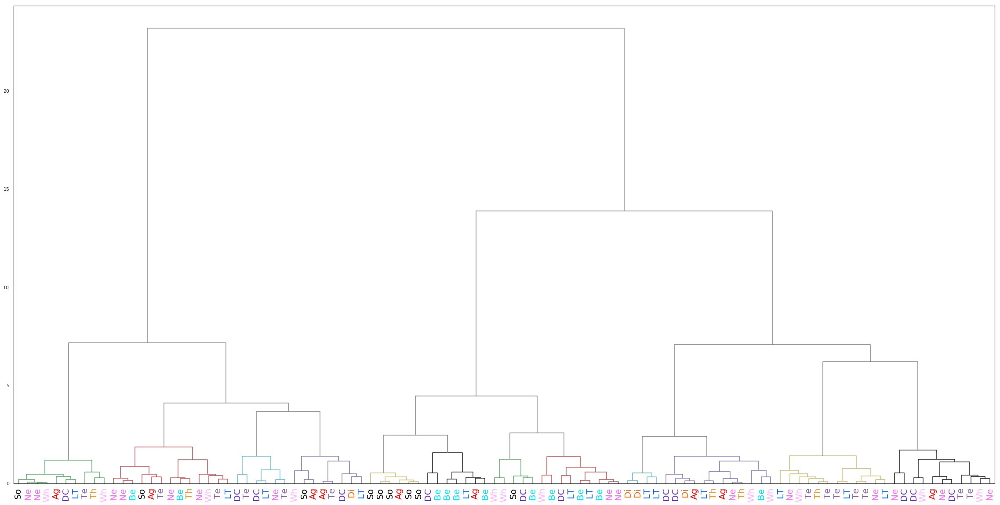

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c92.pkl
-------------
ARI: 0.058213435631497584


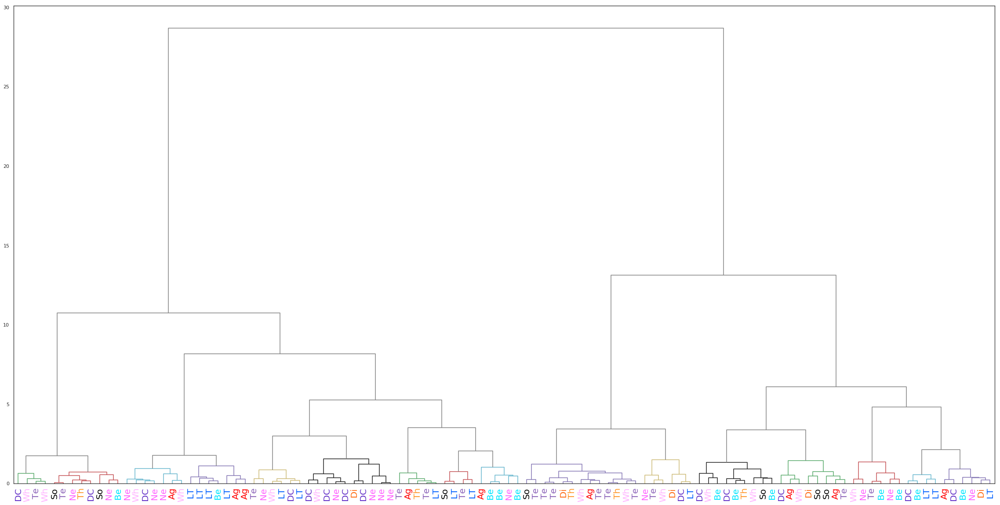

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c88.pkl
-------------
ARI: 0.07639038083511342


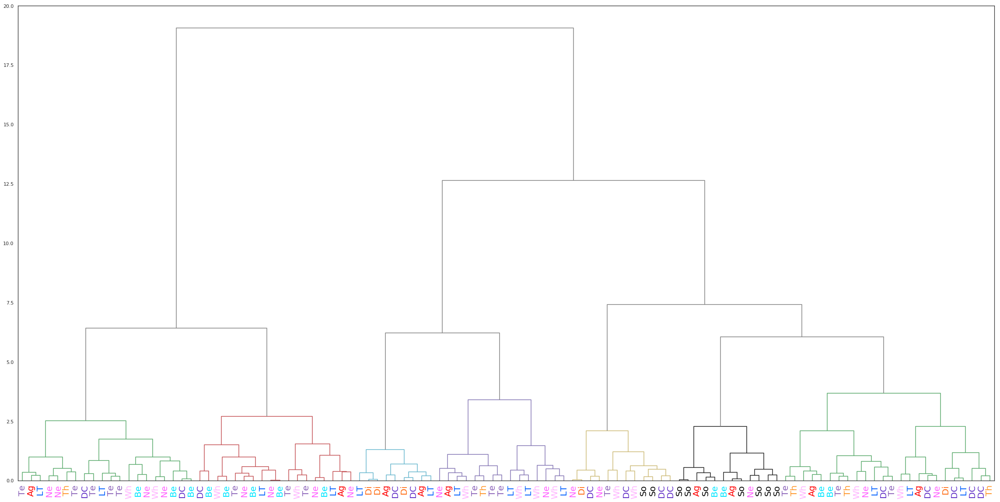

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e10-c36.pkl
-------------
ARI: 0.02326414230673523


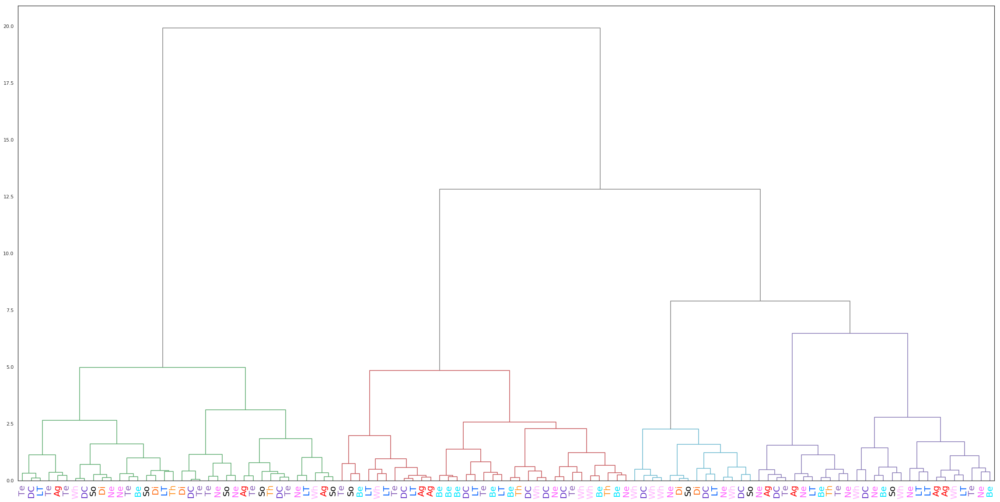

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c97.pkl
-------------
ARI: 0.10542257811820002


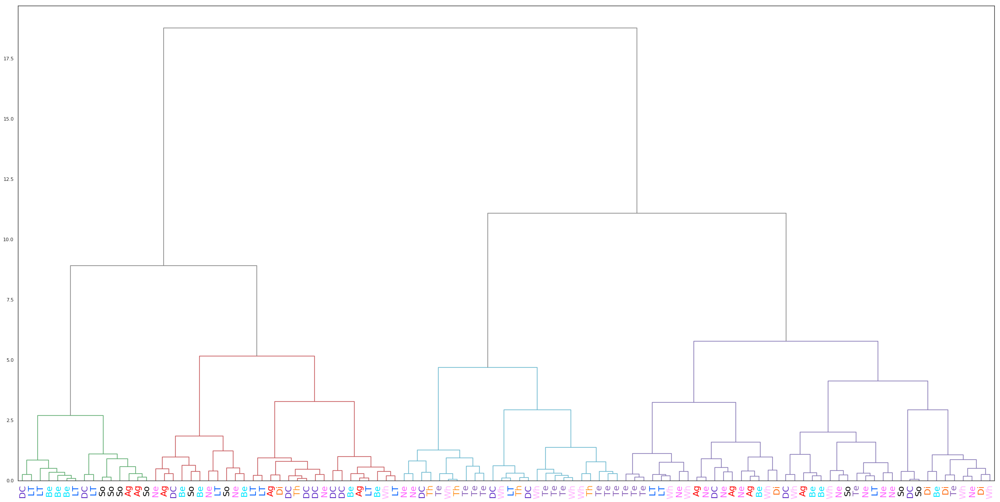

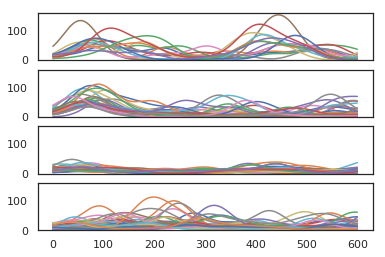

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c99.pkl
-------------
ARI: 0.06973517031589864


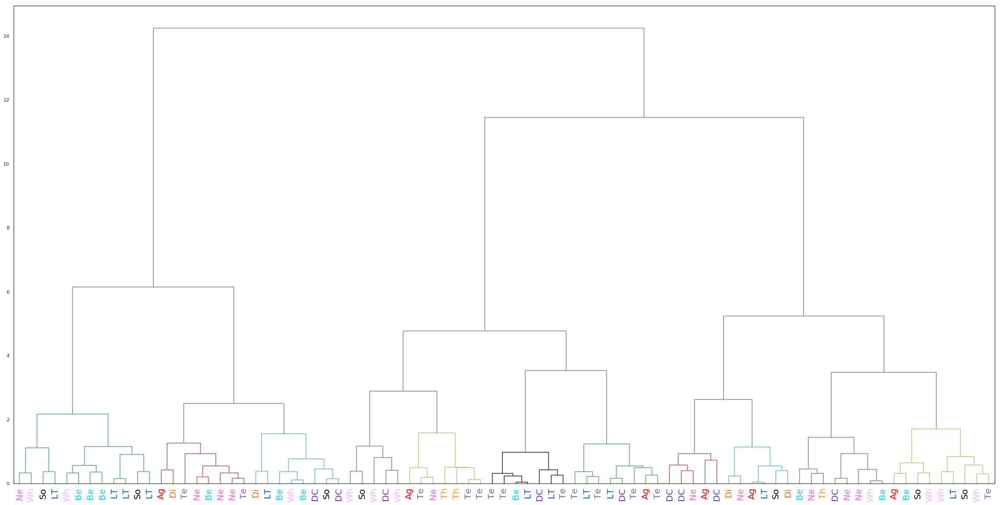

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e18-c59.pkl
-------------
ARI: 0.04860863713731543


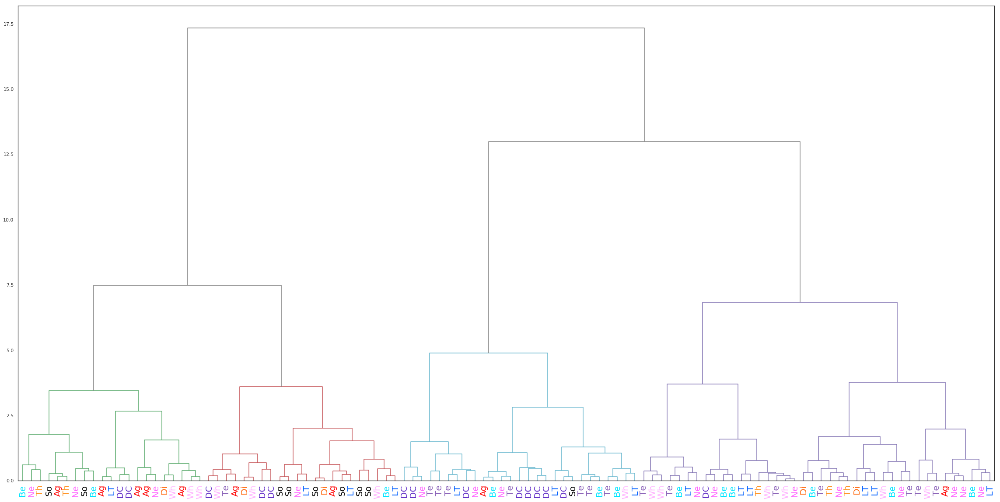

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e19-c56.pkl
-------------
ARI: 0.005809811984663225


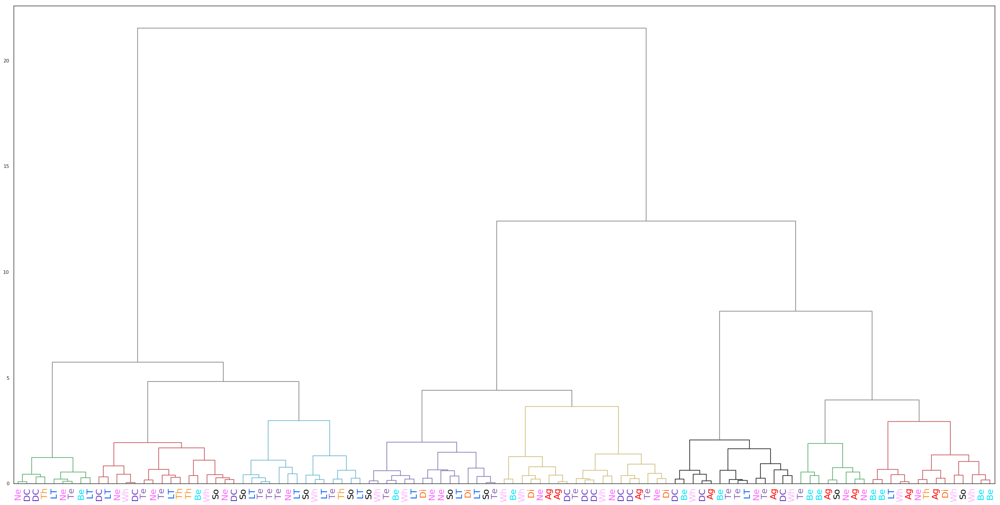

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e9-c22.pkl
-------------
ARI: 0.02224749965209921


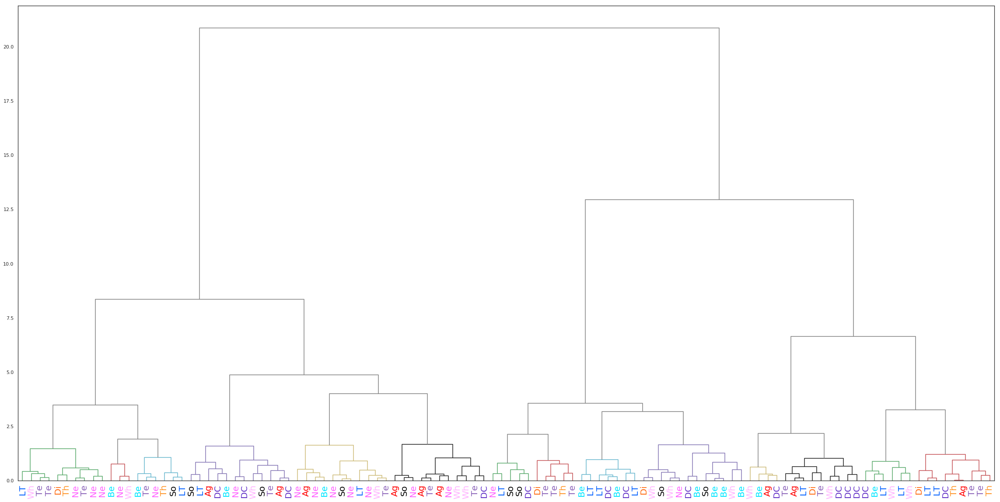

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e10-c44.pkl
-------------
ARI: 0.009172828096118295


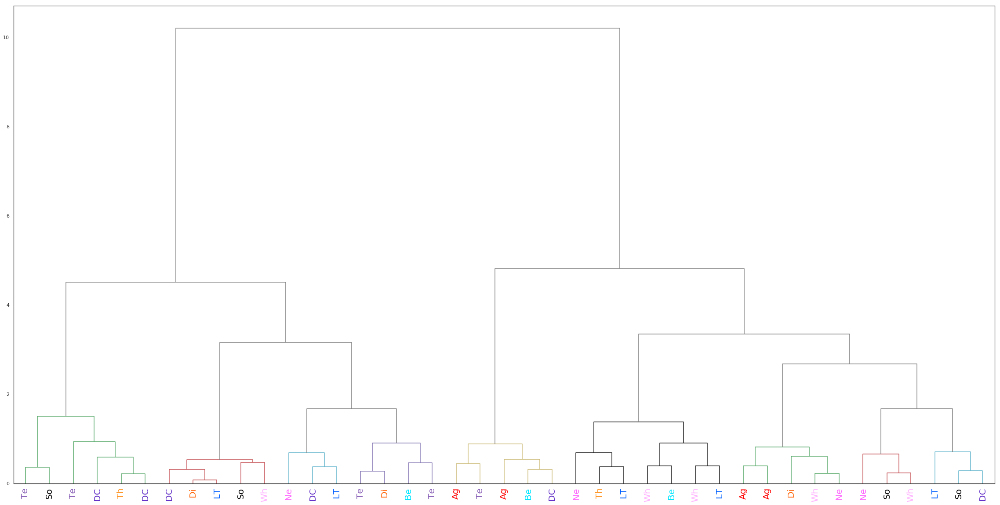

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c136.pkl
-------------
ARI: 0.012215655162378831


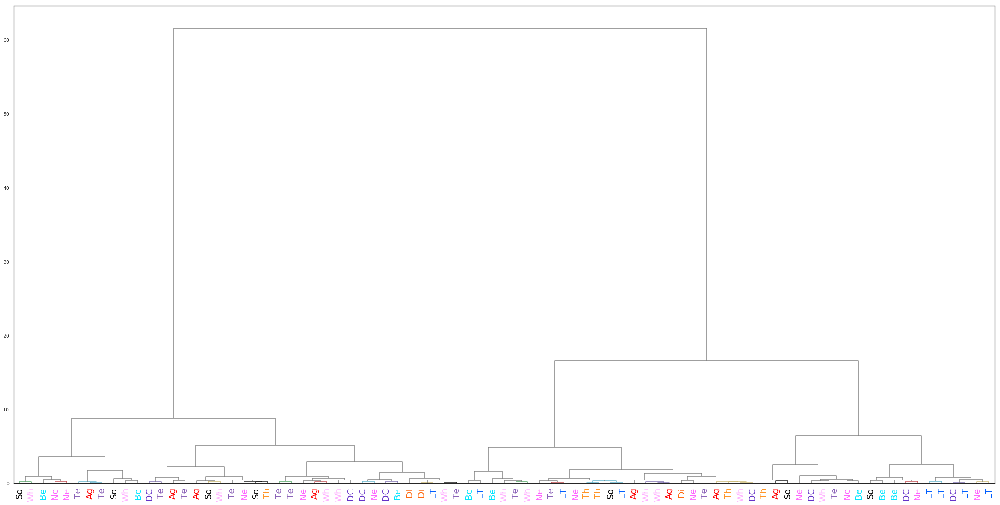

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c137.pkl
-------------
ARI: 0


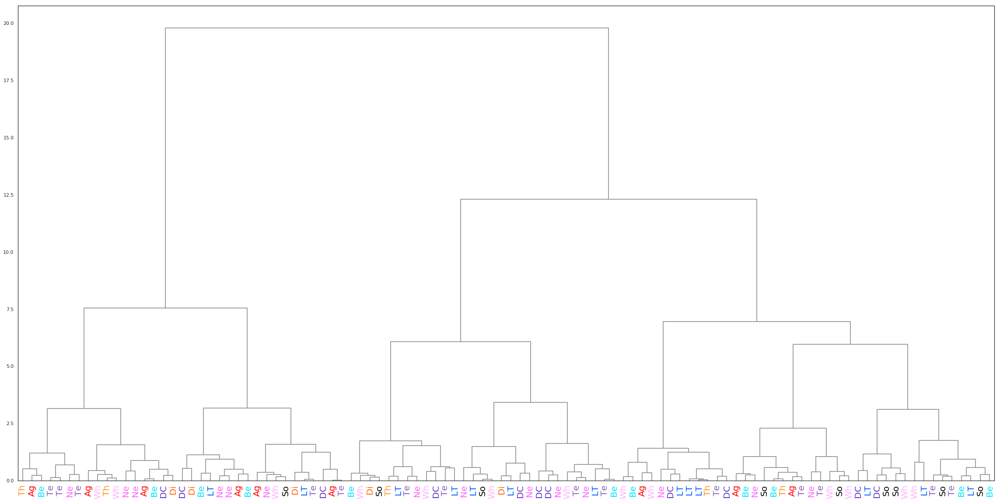

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e18-c109.pkl
-------------
ARI: 0.05729077831258139


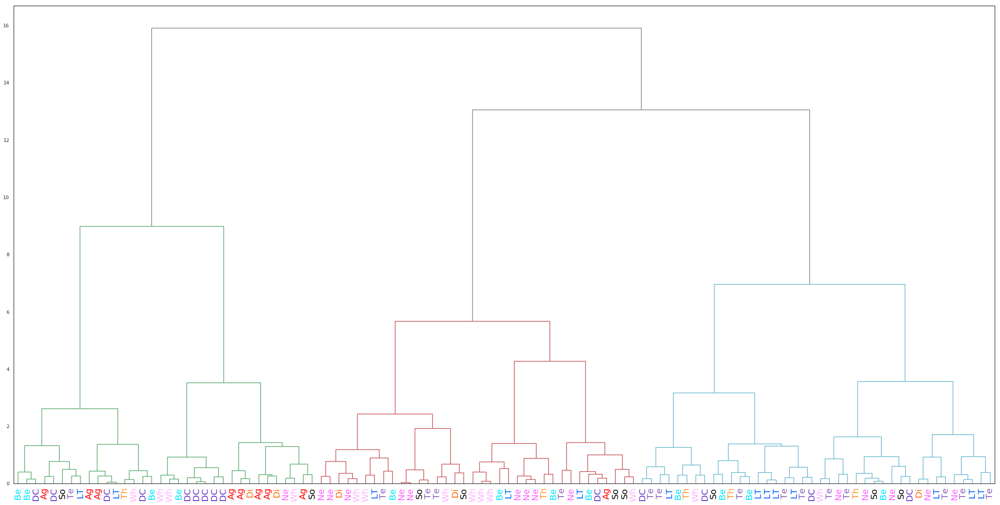

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e20-c56.pkl
-------------
ARI: 0.08275680693336977


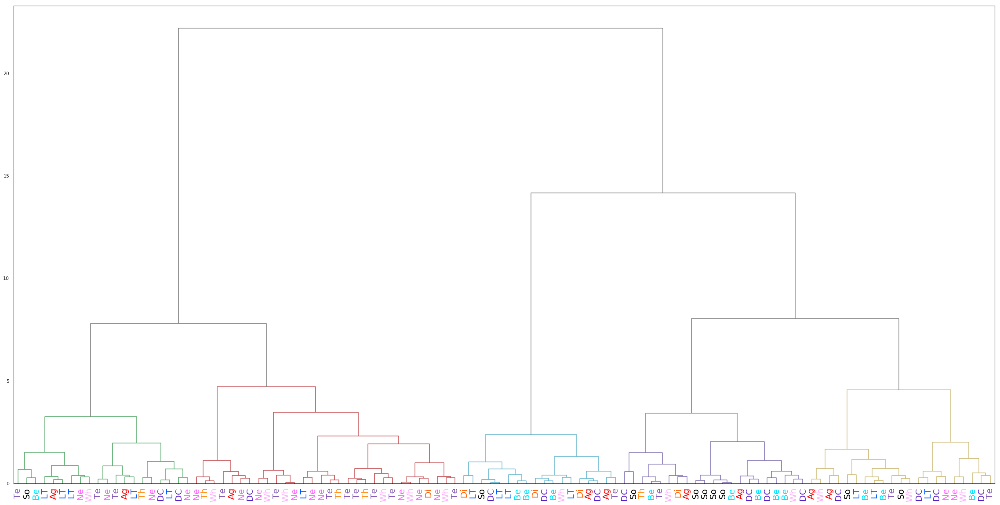

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e12-c1.pkl
-------------
ARI: 0.04567665711128549


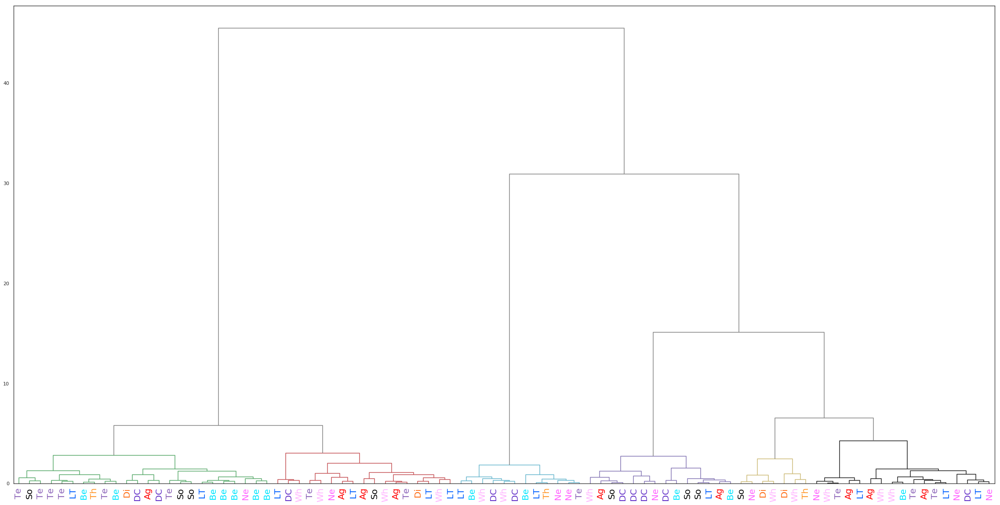

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e18-c7.pkl
-------------
ARI: 0.025068409305696027


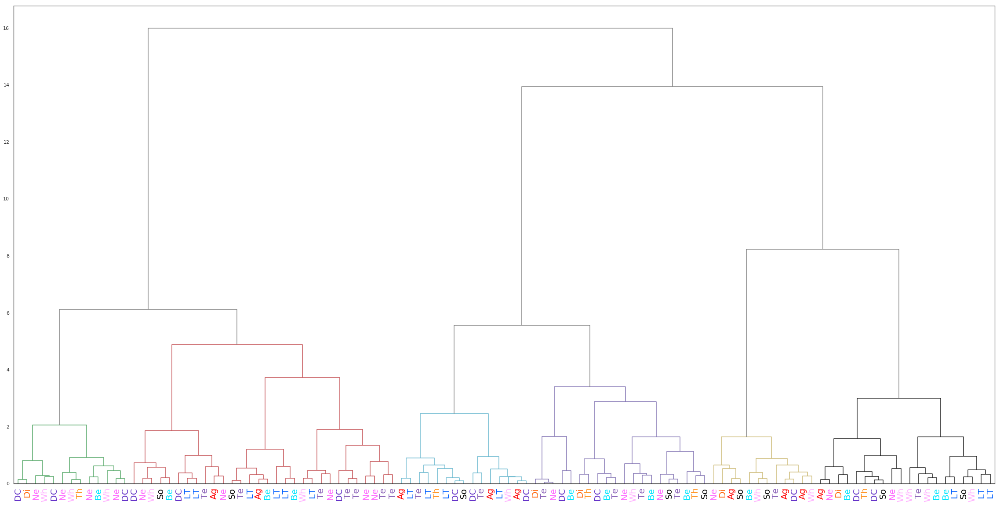

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c4.pkl
-------------
ARI: 0.04777387610005635


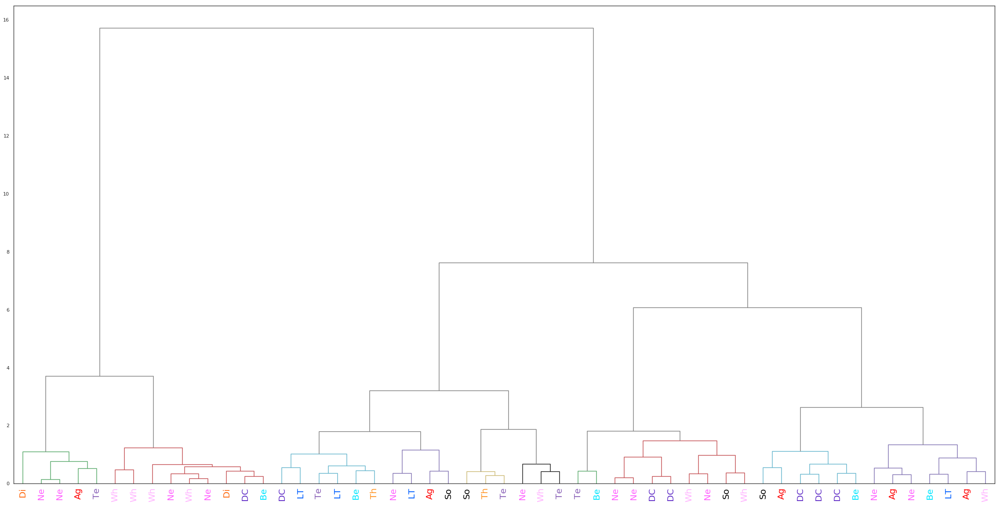

/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c5.pkl
-------------
ARI: 0


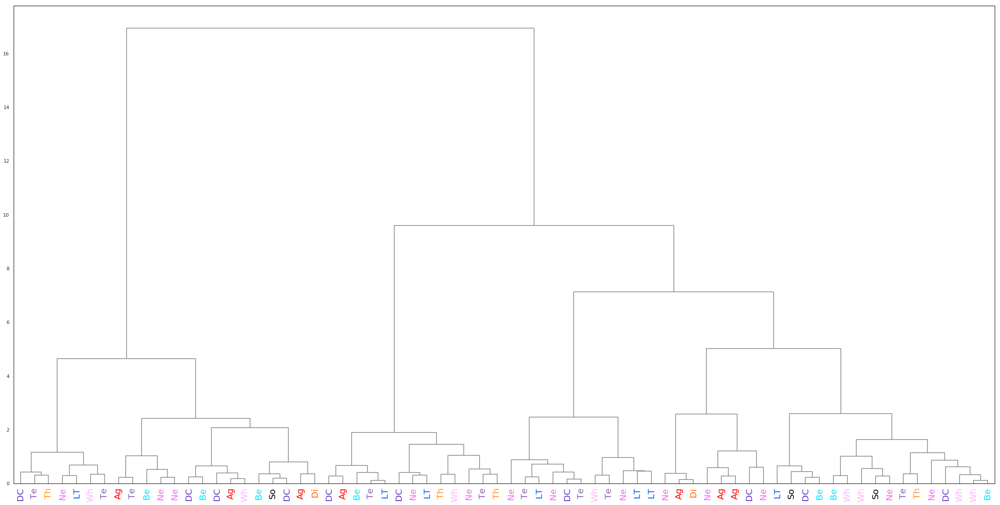

In [61]:
aris = []
for ind,row in summary[(summary['zAud'] > .5)&(summary['selInd'] > .1)].iterrows():
    inPath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
    print(inPath)
    fileIn = open(inPath, 'rb')
    unitInfo = pk.load(fileIn)
    dfAbsTime = pk.load(fileIn)
    dfRelTime = pk.load(fileIn)
    fileIn.close()
    # only take data for times we know the call type
    dfRelTime = dfRelTime[dfRelTime["call_type"].astype(bool)]
    t_inds = np.logical_and(dfRelTime['tKDE'][0] >= 0,dfRelTime['tKDE'][0] <= .6)
    PSTH_KDES_first_600 = np.zeros((len(dfRelTime),sum(t_inds)))
    for i in range(len(dfRelTime)):
        if dfRelTime['spikeKDE'][i][t_inds].sum() > 0:
            PSTH_KDES_first_600[i,:] = dfRelTime['spikeKDE'][i][t_inds]
    F,ari,pcs = cluster_analysis(PSTH_KDES_first_600,dfRelTime['call_type'][:],and_plot=True, use_umap=True,save="/auto/zdrive/lthomas/figs/%s_HAC.pdf"%(row['unit'].split('.')[0]))
    #plt.savefig("/auto/zdrive/lthomas/figs/%s_HAC_ARI_%.2f.pdf"%(row['unit'].split('.')[0],ari))
    aris.append(ari)

    if ari < .09:
        os.remove("/auto/zdrive/lthomas/figs/%s_HAC.pdf"%(row['unit'].split('.')[0]))
        continue

    plot_groupings(PSTH_KDES_first_600,F, save = "/auto/zdrive/lthomas/figs/%s_GROUP_ARI_%.2f.pdf"%(row['unit'].split('.')[0],ari))
    #plt.savefig("/auto/zdrive/lthomas/figs/%s_GROUP_ARI_%.2f.pdf"%(row['unit'].split('.')[0],ari))


## Go through audio files now

In [11]:
df_out = pd.read_pickle(outPath)


NameError: name 'outPath' is not defined

In [62]:
outPath = "/auto/zdrive/lthomas/goodpkls/AuditoryMetadata_full.pkl"
if os.path.exists(outPath):
    df_out = pd.read_pickle(outPath)
else:
    df_out = pd.DataFrame(columns=["FileName","Bird","Sex","calltype","fund","cvfund","maxfund","minfund","F1",
                                "F2", "F3","sal", "rms","maxAmp","meanS", "stdS", "skewS", "kurtS","entS",               
                                 "q1","q2","q3","meanT", "stdT","skewT","kurtT","entT","MesPCS"])

for ind,row in summary[(summary['zAud'] > .5)&(summary['selInd'] > .1)].iterrows():
    inPath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
    print("--------------")
    print(inPath)
    fileIn = open(inPath, 'rb')
    unitInfo = pk.load(fileIn)
    dfAbsTime = pk.load(fileIn)
    dfRelTime = pk.load(fileIn)
    fileIn.close()
    for ind in dfRelTime.index:
        fn = dfRelTime.loc[ind,'file']
        ct = dfRelTime.loc[ind,'call_type']
        if df_out['FileName'].str.contains(fn).sum() == 0:
            print(fn)
            if ct is not None:
                fnsplit = fn.split('_')
                birdname = fnsplit[0]
                sex = fnsplit[1][0]
            else:
                print("synth stim")
                # Synthetic stim
                birdname = None
                sex = None
                continue
            # get samplerate from time
            t = dfRelTime.loc[ind,'tStim']
            fs = round(1/(t[1]-t[0]))

            # get sound from df
            # previously was np.logical_and(dfRelTime.loc[ind,'tStim'] > 0 , dfRelTime.loc[ind,'tStim'] < .6)
            wavform = dfRelTime.loc[ind, 'stimWav']

            maxAmp = np.abs(wavform).max()
            bsound = BioSound(soundWave = wavform.astype(float) / maxAmp, fs = fs, emitter = birdname, calltype = ct)

            # calc spectro
            bsound.spectroCalc()
            bsound.rms = bsound.sound.std() # rms?

            # Calculate amplitude envelope 
            bsound.ampenv()

            # Calculate power spectrum 
            bsound.spectrum(f_high=10000)

            # Calculate fundamental and related values 
            bsound.fundest()

            # Test Plot
            #myBioSound.plot()

            meanF1 = np.mean(bsound.F1[~np.isnan(bsound.F1)])
            meanF2 = np.mean(bsound.F2[~np.isnan(bsound.F2)])
            meanF3 = np.mean(bsound.F3[~np.isnan(bsound.F3)])

            if bsound.fund.shape != (0,):
                fund = np.float(bsound.fund)
                cvfund = np.float(bsound.cvfund)
                maxfund = np.float(bsound.maxfund)
                minfund = np.float(bsound.minfund)
            else:
                print("Asynth stim")
                fund = None 
                cvfund = None
                maxfund = None # added 
                minfund= None # added 
                continue
            print("ADDING")
            df_out = df_out.append({"FileName": fn,"Bird": birdname,"Sex": sex,"calltype": ct,"fund":fund,"cvfund":cvfund,"maxfund":maxfund,"minfund":minfund,
                           "F1": meanF1,"F2": meanF2, "F3": meanF3,"sal": np.float(bsound.sal), "rms": bsound.rms,
                           "maxAmp":np.float(bsound.maxAmp),
                         "meanS": np.float(bsound.meanspect), "stdS": np.float(bsound.stdspect),
                         "skewS": np.float(bsound.skewspect), "kurtS": np.float(bsound.kurtosisspect), 
                         "entS": np.float(bsound.entropyspect),
                         "q1": np.float(bsound.q1), "q2": np.float(bsound.q2), "q3": np.float(bsound.q3),                  
                         "meanT": np.float(bsound.meantime), "stdT": np.float(bsound.stdtime),
                         "skewT": np.float(bsound.skewtime), "kurtT": np.float(bsound.kurtosistime),
                         "entT": np.float(bsound.entropytime),"UMAP1": None, "UMAP2": None},ignore_index=True)


--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl
BlaBla0506_MAF_Ag_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_Ag_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaBla0506_MAF_Ag_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaBla0506_MAF_DC_7-3-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_DC_8-4-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_DC_9-2-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaBla0506_MAF_Ne_5-2-3_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_Ne_6-9-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaBla0506_MAF_Ne_8-7-4_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaBla0506_MAF_So_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_So_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaBla0506_MAF_So_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaBla0506_MAF_Te_3-2-7_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_Te_4-5-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_Te_8-1-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_Th_2-1-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_Th_5-3-4_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_Wh_2-1-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaBla0506_MAF_Wh_3-4-8_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaBla0506_MAF_Wh_7-9-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Ag_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Ag_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Ag_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_DC_1-4-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_DC_2-7-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_DC_8-9-3_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Di_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaLbl8026_FAS_Di_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Di_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Ne_1-5-4_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Ne_2-6-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaLbl8026_FAS_Ne_8-7-3_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Te_1-7-2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Te_3-4-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Te_8-5-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Wh_1-8-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
BlaLbl8026_FAS_Wh_4-7-3_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
BlaLbl8026_FAS_Wh_5-9-2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
GraLbl0457_MAS_Ag_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Ag_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


Asynth stim
GraLbl0457_MAS_Ag_2_fs25k.wav
ADDING
GraLbl0457_MAS_DC_1-4-2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
GraLbl0457_MAS_DC_7-3-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
GraLbl0457_MAS_DC_8-6-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Di_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Di_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Ne_3-6-7_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Ne_4-2-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Ne_8-9-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_So_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_So_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
GraLbl0457_MAS_So_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Te_4-9-3_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Te_5-2-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Te_7-8-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Wh_4-9-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Wh_5-2-8_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
GraLbl0457_MAS_Wh_6-7-3_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_DC_1-3-7_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_DC_5-4-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_DC_6-2-8_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_Ne_3-1-4_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_Ne_8-6-2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_Ne_9-7-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_So_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
LblBla4548_MAF_So_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_So_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_Te_2-8-7_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_Te_3-9-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_Te_4-5-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_Wh_2-8-4_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBla4548_MAF_Wh_6-7-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
LblBla4548_MAF_Wh_9-3-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBlu1630_FCS_Be_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBlu1630_FCS_Be_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBlu1630_FCS_Be_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBlu1630_FCS_LT_7-4-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBlu1630_FCS_LT_8-3-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBlu1630_FCS_LT_9-2-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBlu2028_MCS_Be_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
LblBlu2028_MCS_Be_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
LblBlu2028_MCS_Be_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBlu2028_MCS_LT_5-1-3_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblBlu2028_MCS_LT_7-6-2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
LblBlu2028_MCS_LT_9-4-8_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
LblGre0000_UCF_Be_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0000_UCF_Be_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0000_UCF_Be_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0000_UCF_LT_11-5-2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0000_UCF_LT_12-3-4_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0000_UCF_LT_6-7-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0000_UCF_LT_8-1-10_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0001_UCF_Be_0_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0001_UCF_Be_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0001_UCF_Be_2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
LblGre0001_UCF_LT_2-1-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0001_UCF_LT_5-4-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
LblGre0001_UCF_LT_7-8-3_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
WhiWhi1415_FAF_DC_1-3-2_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
WhiWhi1415_FAF_DC_4-6-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
WhiWhi1415_FAF_Ne_1-3-8_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
WhiWhi1415_FAF_Ne_2-6-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
WhiWhi1415_FAF_Ne_4-7-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
WhiWhi1415_FAF_Te_2-4-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10
/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2200.
  warnings.warn(errors[info][0], RuntimeWarning)


ADDING
WhiWhi1415_FAF_Te_5-3-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
WhiWhi1415_FAF_Te_8-7-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
WhiWhi1415_FAF_Th_3-2-5_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
WhiWhi1415_FAF_Th_4-1-9_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
WhiWhi1415_FAF_Th_8-7-6_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
WhiWhi1415_FAF_Wh_2-3-1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


ADDING
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl
GraLbl0457_MAS_Ag_1_fs25k.wav


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/soundsig/sound.py:278: RuntimeWarning: divide by zero encountered in log10


Asynth stim
stim1.wav
synth stim
stim10.wav
synth stim
stim10_sfilt.wav
synth stim
stim10_tfilt.wav
synth stim
stim11.wav
synth stim
stim12.wav
synth stim
stim13.wav
synth stim
stim14.wav
synth stim
stim15.wav
synth stim
stim16.wav
synth stim
stim17.wav
synth stim
stim18.wav
synth stim
stim19.wav
synth stim
stim1_sfilt.wav
synth stim
stim1_tfilt.wav
synth stim
stim2.wav
synth stim
stim20.wav
synth stim
stim2_sfilt.wav
synth stim
stim2_tfilt.wav
synth stim
stim3.wav
synth stim
stim3_sfilt.wav
synth stim
stim3_tfilt.wav
synth stim
stim4.wav
synth stim
stim4_sfilt.wav
synth stim
stim4_tfilt.wav
synth stim
stim5.wav
synth stim
stim5_sfilt.wav
synth stim
stim5_tfilt.wav
synth stim
stim6.wav
synth stim
stim6_sfilt.wav
synth stim
stim6_tfilt.wav
synth stim
stim7.wav
synth stim
stim7_sfilt.wav
synth stim
stim7_tfilt.wav
synth stim
stim8.wav
synth stim
stim8_sfilt.wav
synth stim
stim8_tfilt.wav
synth stim
stim9.wav
synth stim
stim9_sfilt.wav
synth stim
stim9_tfilt.wav
synth stim
--------------


In [13]:
df_out.to_pickle(outPath)

In [14]:
# only take real stim
df_out = df_out[~df_out['Bird'].isnull()]

In [15]:
df_out

,FileName,Bird,Sex,calltype,fund,cvfund,maxfund,minfund,F1,F2,...,q2,q3,meanT,stdT,skewT,kurtT,entT,MesPCS,UMAP1,UMAP2
0,BlaBla0506_MAF_Ag_0_fs25k.wav,BlaBla0506,M,Ag,550.831311,0.322715,729.764101,301.120447,945.813187,2572.073605,...,1831.054687,3662.109375,0.286563,0.182570,0.283233,1.682652,0.980594,NaN,None,None
1,BlaBla0506_MAF_Ag_1_fs25k.wav,BlaBla0506,M,Ag,513.022247,0.544967,1194.316894,301.501588,996.301338,2382.997144,...,1489.257812,2050.781250,0.269723,0.157804,0.308065,1.877323,0.975009,NaN,None,None
2,BlaBla0506_MAF_Ag_2_fs25k.wav,BlaBla0506,M,Ag,446.583868,0.094370,526.491648,347.410901,670.213344,2590.907625,...,1367.187500,4760.742187,0.355781,0.144804,-0.447521,2.600175,0.966182,NaN,None,None
3,BlaBla0506_MAF_DC_7-3-6_fs25k.wav,BlaBla0506,M,DC,908.237163,0.218663,1052.769810,311.971040,1377.465594,2973.524136,...,3125.000000,4125.976562,0.131672,0.072277,-0.232634,1.608596,0.856376,NaN,None,None
4,BlaBla0506_MAF_DC_8-4-1_fs25k.wav,BlaBla0506,M,DC,989.701433,0.068652,1062.399058,524.272888,1838.497400,2992.111637,...,4028.320312,4248.046875,0.128739,0.070691,-0.253779,1.616981,0.859367,NaN,None,None
5,BlaBla0506_MAF_DC_9-2-5_fs25k.wav,BlaBla0506,M,DC,961.012859,0.260375,1499.854382,388.069165,1469.985576,2938.331403,...,3125.000000,3686.523437,0.130713,0.071765,-0.269256,1.617251,0.854924,NaN,None,None
6,BlaBla0506_MAF_Ne_5-2-3_fs25k.wav,BlaBla0506,M,Ne,597.352559,0.147554,817.388884,450.400647,1290.161697,2714.791470,...,2612.304687,3588.867187,0.154763,0.111627,-0.068926,1.125672,0.761778,NaN,None,None
7,BlaBla0506_MAF_Ne_6-9-1_fs25k.wav,BlaBla0506,M,Ne,582.587896,0.119864,672.571767,446.218524,1162.826221,2671.811427,...,2392.578125,3710.937500,0.322918,0.219730,-0.263246,1.487722,0.844110,NaN,None,None
8,BlaBla0506_MAF_Ne_8-7-4_fs25k.wav,BlaBla0506,M,Ne,814.210434,0.342333,1498.165649,330.809402,1453.350225,2894.259725,...,1660.156250,1855.468750,0.122949,0.178265,2.126214,5.680595,0.798567,NaN,None,None
9,BlaBla0506_MAF_So_0_fs25k.wav,BlaBla0506,M,So,727.942374,0.348259,1170.655509,403.154869,1329.195204,2655.361215,...,1757.812500,2856.445312,0.314098,0.168450,-0.171471,1.849347,0.954839,NaN,None,None


## CLUSTER AUDIO FROM ALL PKL FILES

In [16]:
# The features - indexing features out of the vocSelTable -- features created by soundsig previously
#These will be the features used to create linkages between the calls in the stimuli set or full bank

#These will be dimension len(numberofcallsinthedataset) by len(numberoffeatures contatenated)
XfundNames = np.hstack(('sal', 'fund','maxfund','minfund','cvfund')) #concatenating said features as labels of columns
Xfund = [df_out.loc[:,col] for col in XfundNames ]
Xfund = np.stack(Xfund, axis=1) #only contains something like headers

XspectNames = np.hstack(('meanS', 'stdS', 'skewS', 'kurtS', 'entS', 'q1', 'q2', 'q3'))
Xspect = [df_out.loc[:,col] for col in XspectNames ]
Xspect = np.stack(Xspect, axis=1)#only contains something like headers

XtempNames = np.hstack(('meanT', 'stdT', 'skewT', 'kurtT', 'entT'))
Xtemp = [df_out.loc[:,col] for col in XtempNames ]
Xtemp = np.stack(Xtemp, axis=1)#only contains something like headers

XintensityNames = np.array(('rms', 'maxAmp'))
Xintensity = [df_out.loc[:,col] for col in XintensityNames ]
Xintensity = np.stack(Xintensity, axis=1)#only contains something like headers

Xall = np.hstack((Xfund, Xspect, Xtemp, Xintensity))
XallNames = np.hstack((XfundNames, XspectNames, XtempNames, XintensityNames))
#np.save(os.path.join(outdir, 'feature_names_all7943'), XallNames)

# Z score all data that is not nan and make corresponding arrays for bird id and call type
nonanInd = (np.sum(np.isnan(Xall), axis = 1) == 0)
Xfundz = zscore(Xfund[nonanInd], axis=0)
Xspectz = zscore(Xspect[nonanInd], axis=0)
Xtempz = zscore(Xtemp[nonanInd], axis=0)
Xintensityz = zscore(Xintensity[nonanInd], axis=0)
Xallz = zscore(Xall[nonanInd], axis=0)

#this contains all the usable call types from vocSelTable
semantic = np.array(df_out['calltype'])[nonanInd] #previously vocSelTableGroupedAgg
#coarse_semantic = np.array([fine_to_coarse[x] for x in fine_semantic])

-------------
ARI: 0.356061689191223


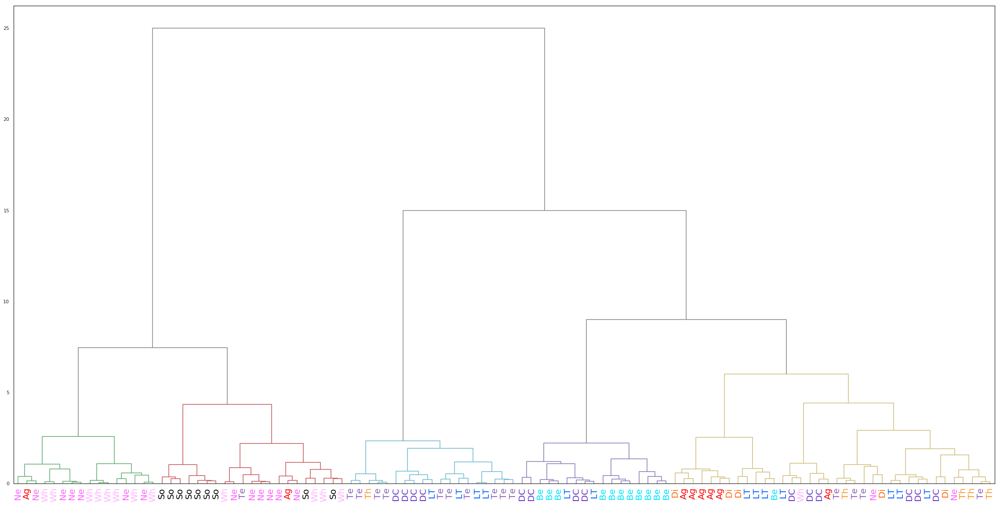

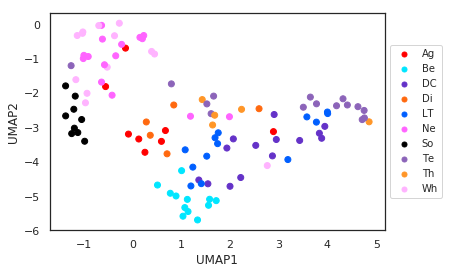

In [17]:
F,ari,PCS = cluster_analysis(Xallz,np.squeeze(semantic),and_plot=True,use_umap=True)
df_out['UMAP1'] = PCS[:,0]
df_out['UMAP2'] = PCS[:,1]
#points=seaborn.scatterplot(df_out['UMAP1'],df_out['UMAP2'],hue=[callColor[x] for x in df_out['calltype']])
#points.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.scatter(df_out['UMAP1'],df_out['UMAP2'], c=df_out['calltype'].apply(lambda x: callColor[x]))
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in callColor.values()]
#plt.legend(markers, callColor.keys(), numpoints=1,loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.savefig("/auto/zdrive/lthomas/figs/AllCalls_HAC.pdf")
colors = [callColor[x] for x in np.unique(df_out['calltype'])]
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=5) for color in colors]
plt.legend(markers, np.unique(df_out['calltype']), numpoints=1,loc='center left', bbox_to_anchor=(1., 0.5), ncol=1,prop={'size': 10})


plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.savefig("/auto/zdrive/lthomas/figs/AllCalls_UMAP.pdf")

## PLOT BY SPIKERATE (NORMALIZED 0-100 Hz)
plot the spikerate for each pkl file ontop of the auditory clustering above

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl
max rate: 95.0


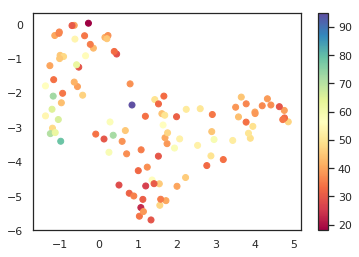

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl
max rate: 93.33333333333334


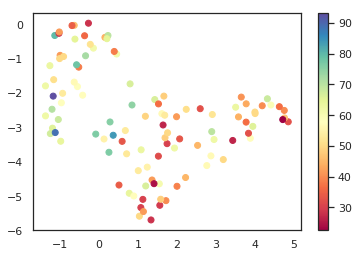

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_8_5t_190809_133540/goodPlayback-e19-c2.pkl
max rate: 27.083333333333332


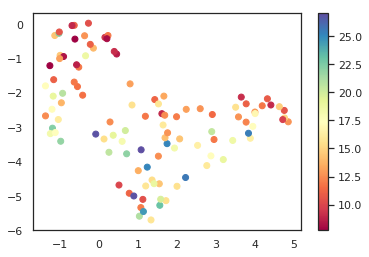

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_4_5t_190718_091732/goodPlayback-e17-c1.pkl
max rate: 23.333333333333336


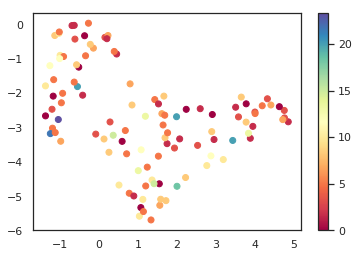

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e10-c65.pkl
max rate: 156.38888888888889


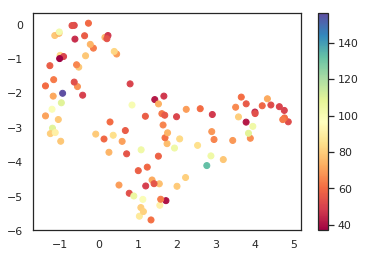

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e17-c31.pkl
max rate: 32.708333333333336


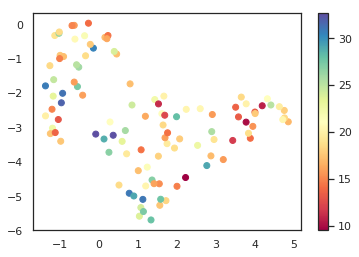

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e19-c32.pkl
max rate: 44.50000000000001


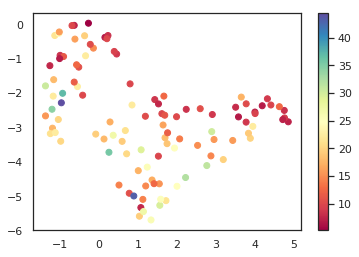

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5_5t_190722_121506/goodPlayback-e19-c58.pkl
max rate: 41.66666666666667


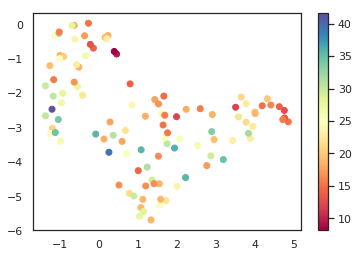

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c31.pkl
max rate: 35.0


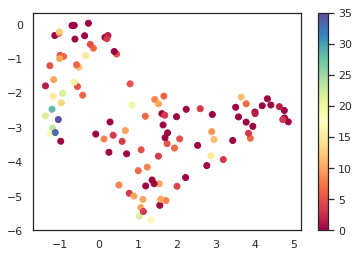

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c86.pkl
max rate: 31.666666666666668


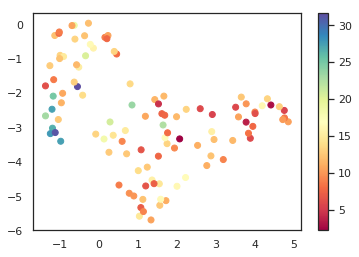

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c85.pkl
max rate: 48.12500000000001


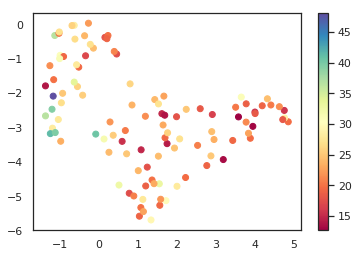

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c84.pkl
max rate: 17.333333333333336


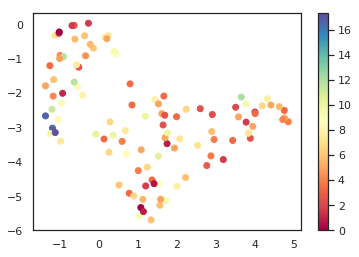

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c34.pkl
max rate: 63.333333333333336


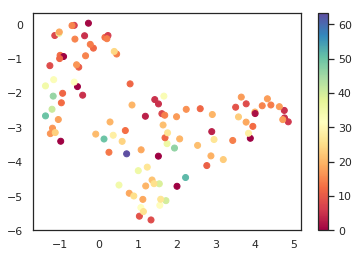

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_8t_190627_132428/goodPlayback-e12-c76.pkl
max rate: 13.333333333333334


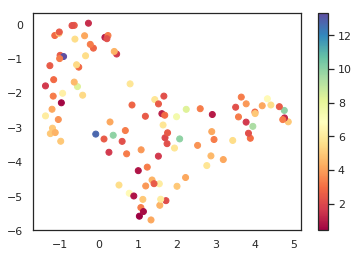

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_9t_190630_100846/goodPlayback-e10-c79.pkl
max rate: 48.333333333333336


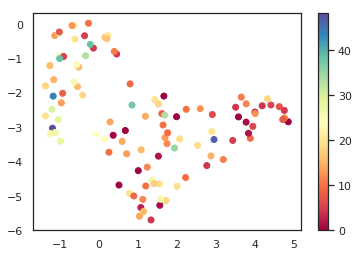

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c65.pkl
max rate: 23.333333333333336


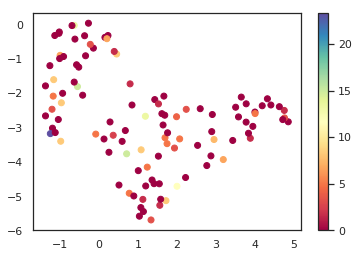

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c67.pkl
max rate: 43.333333333333336


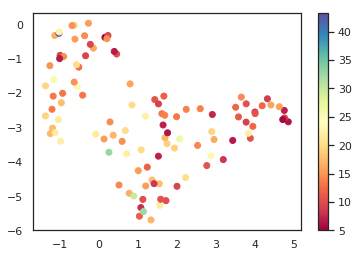

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c29.pkl
max rate: 26.666666666666668


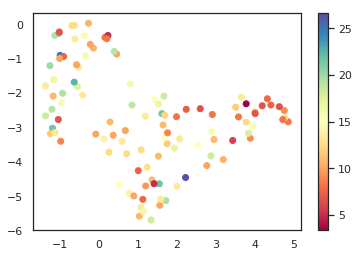

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c28.pkl
max rate: 56.94444444444445


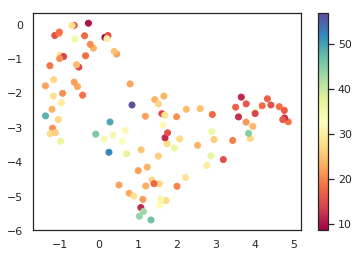

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c51.pkl
max rate: 63.57142857142858


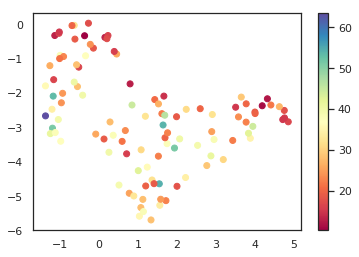

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c52.pkl
max rate: 48.333333333333336


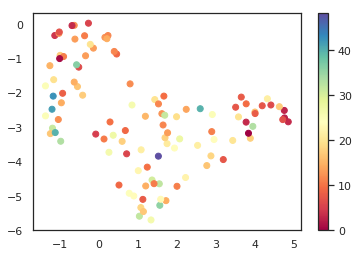

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e13-c14.pkl
max rate: 16.666666666666668


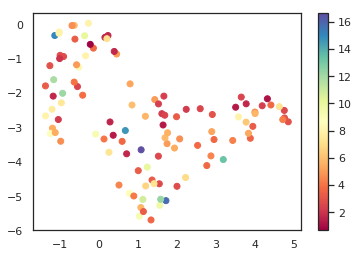

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_121850/goodPlayback-e10-c72.pkl
max rate: 67.91666666666666


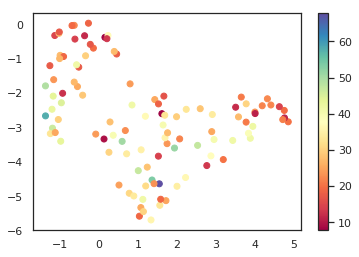

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e17-c3.pkl
max rate: 83.33333333333334


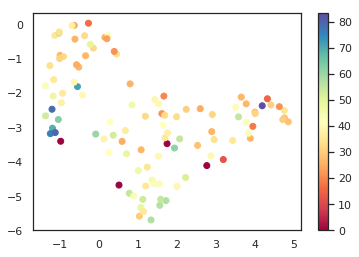

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e9-c13.pkl
max rate: 19.166666666666668


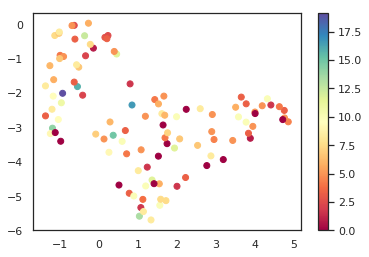

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e16-c66.pkl
max rate: 24.166666666666668


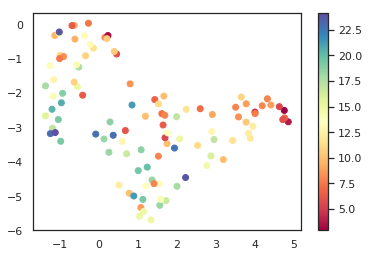

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c38.pkl
max rate: 57.5


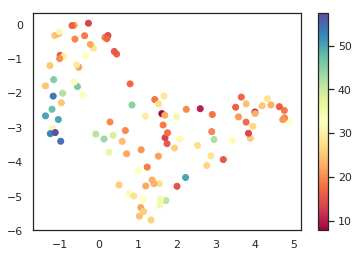

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c36.pkl
max rate: 18.333333333333336


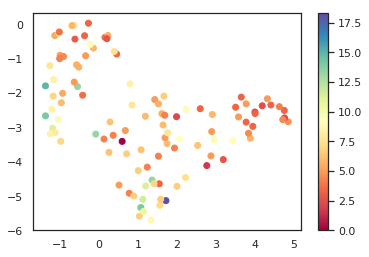

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e18-c4.pkl
max rate: 34.44444444444445


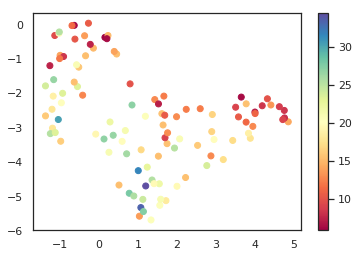

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e10-c1.pkl
max rate: 34.44444444444445


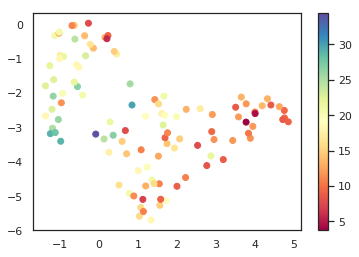

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e16-c96.pkl
max rate: 26.11111111111111


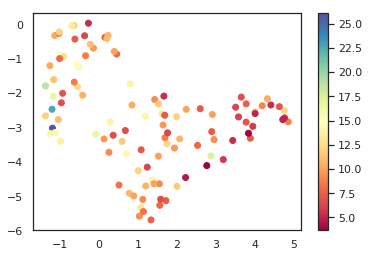

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c57.pkl
max rate: 18.333333333333336


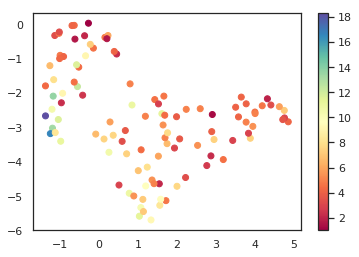

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c58.pkl
max rate: 50.55555555555555


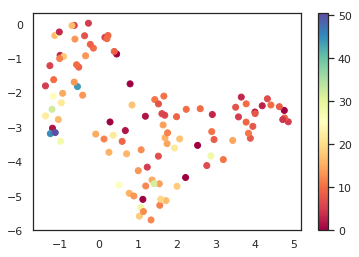

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c92.pkl
max rate: 30.0


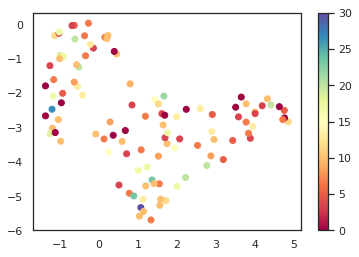

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c88.pkl
max rate: 70.0


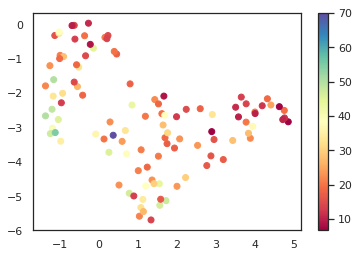

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e10-c36.pkl
max rate: 18.333333333333336


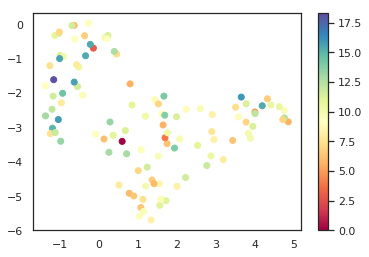

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c97.pkl
max rate: 26.296296296296298


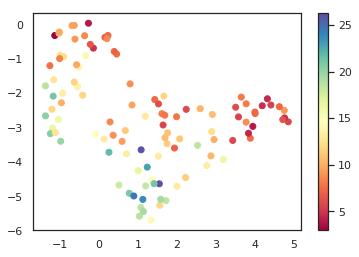

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c99.pkl
max rate: 50.0


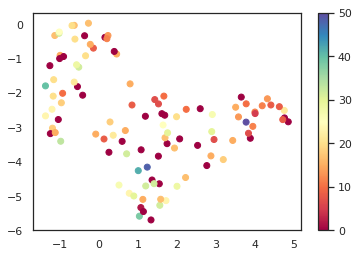

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e18-c59.pkl
max rate: 38.333333333333336


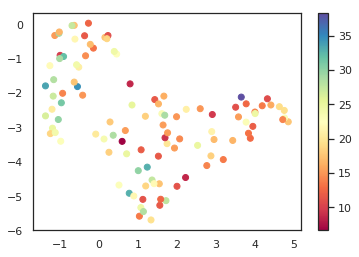

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e19-c56.pkl
max rate: 26.666666666666668


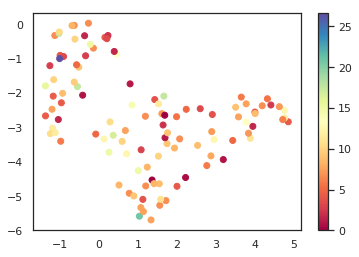

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e9-c22.pkl
max rate: 40.0


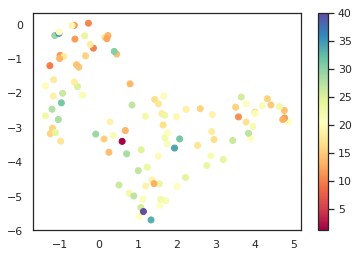

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e10-c44.pkl
max rate: 43.333333333333336


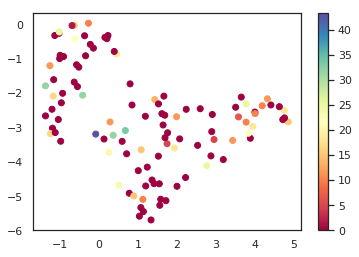

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c136.pkl
max rate: 5.833333333333333


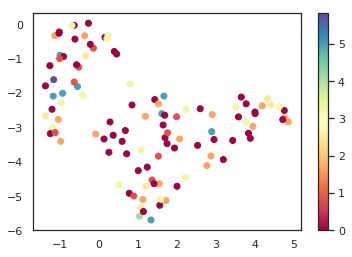

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c137.pkl
max rate: 25.0


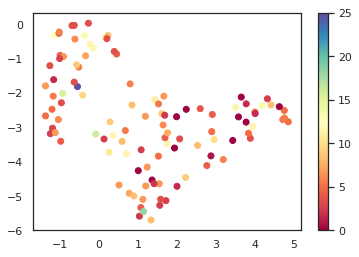

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e18-c109.pkl
max rate: 43.333333333333336


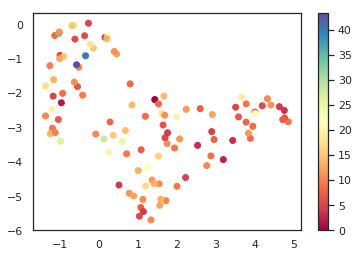

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e20-c56.pkl
max rate: 26.666666666666668


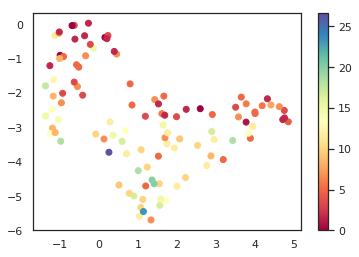

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e12-c1.pkl
max rate: 13.333333333333334


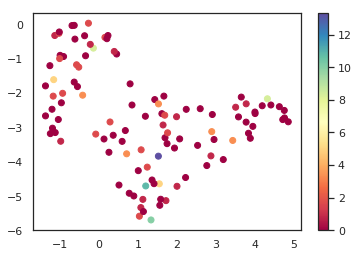

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e18-c7.pkl
max rate: 4.2857142857142865


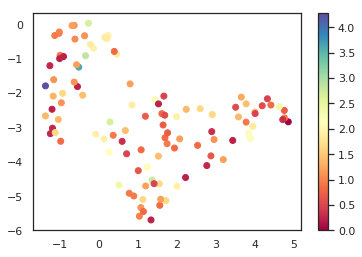

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c4.pkl
max rate: 80.0


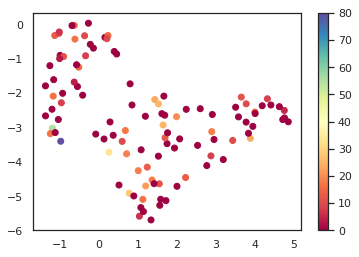

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c5.pkl
max rate: 110.0


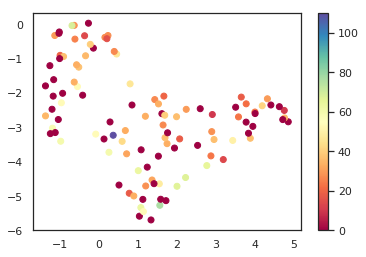

In [18]:
good_inds = (summary['zAud'] > .5)&(summary['selInd'] > .1)
for ind,row in summary[good_inds].iterrows():
    inPath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
    print("--------------")
    print(inPath)
    fileIn = open(inPath, 'rb')
    unitInfo = pk.load(fileIn)
    dfAbsTime = pk.load(fileIn)
    dfRelTime = pk.load(fileIn)
    fileIn.close()
    spks = np.zeros(len(df_out))
    for ind2,row2 in dfRelTime.iterrows():
        sr = 0
        den = 0
        for spktimes in row2['spikeTimes']:
            sr += ((spktimes > 0) & (spktimes < .6)).sum() / .6
            den += 1
        spks[df_out['FileName'] == row2['file']] = sr / den
    print("max rate: %s"%spks.max() )
    #seaborn.scatterplot(df_out['UMAP1'],df_out['UMAP2'],hue=spks,cmap="Spectral")
    points=plt.scatter(df_out['UMAP1'],df_out['UMAP2'],c=spks,cmap="Spectral")
    plt.colorbar(points)
    plt.savefig("/auto/zdrive/lthomas/figs/%s_SR.pdf"%(row['unit'].split('.')[0]))
    plt.show()


## Plot neural cluster groups over the auditory UMAP
maybe this will show they make simmilar clusters?

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl
-------------
ARI: 0.05982543675453435


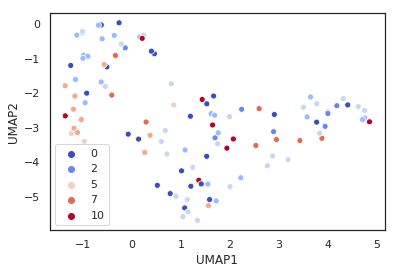

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl
-------------
ARI: 0.047302509560621736


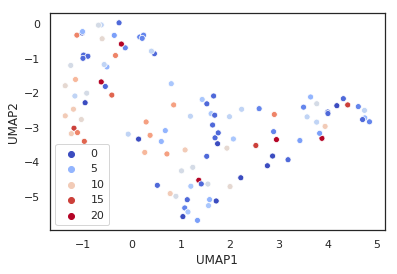

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_8_5t_190809_133540/goodPlayback-e19-c2.pkl
-------------
ARI: 0.06135819642764029


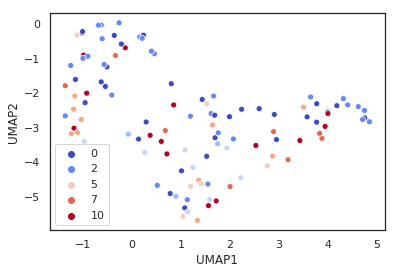

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_4_5t_190718_091732/goodPlayback-e17-c1.pkl
-------------
ARI: 0.01382890747036662


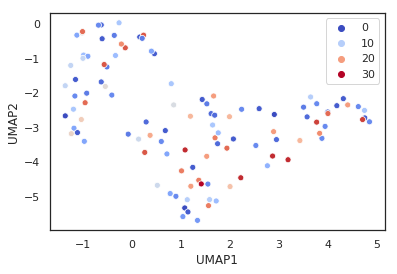

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e10-c65.pkl
-------------
ARI: 0.05913144461681126


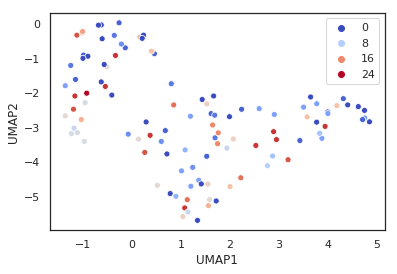

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e17-c31.pkl
-------------
ARI: 0.06980745041306946


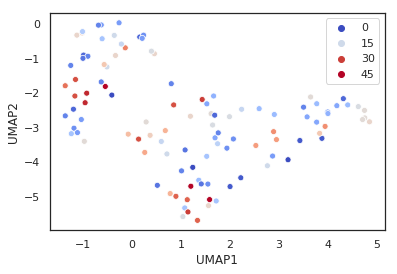

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e19-c32.pkl
-------------
ARI: 0.10384455915911545


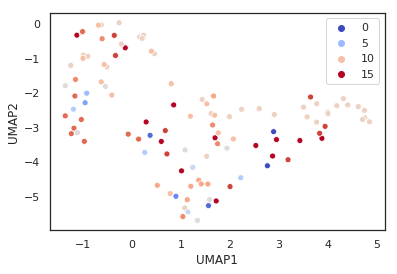

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5_5t_190722_121506/goodPlayback-e19-c58.pkl
-------------
ARI: 0.06859133230624959


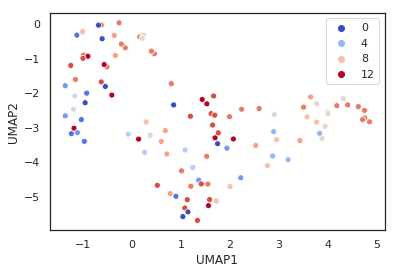

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c31.pkl
-------------
ARI: 0.22570016474464577


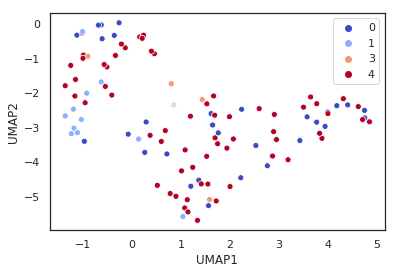

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c86.pkl
-------------
ARI: 0.04376764055229231


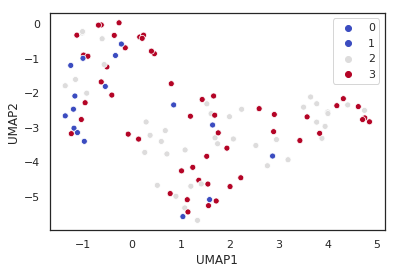

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c85.pkl
-------------
ARI: 0.06520627693124667


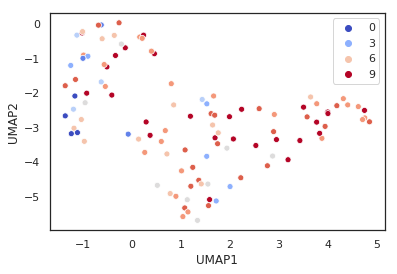

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c84.pkl
-------------
ARI: 0.04046929641682879


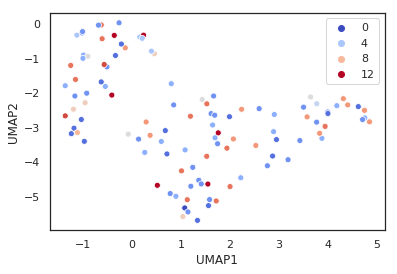

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c34.pkl
-------------
ARI: 0.03526467516376558


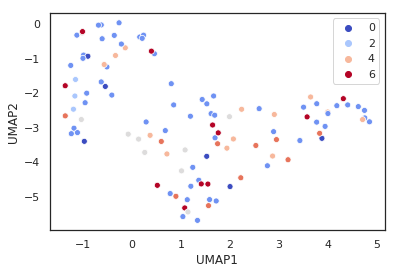

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_8t_190627_132428/goodPlayback-e12-c76.pkl
-------------
ARI: 0.04833221292786206


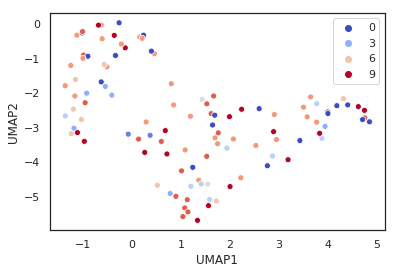

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_9t_190630_100846/goodPlayback-e10-c79.pkl
-------------
ARI: 0.037656553351859606


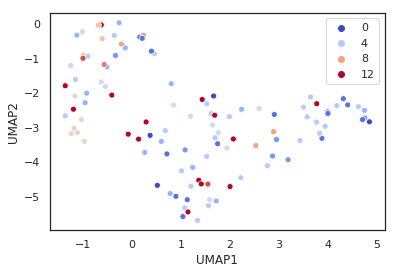

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c65.pkl
-------------
ARI: 0.0757220611020619


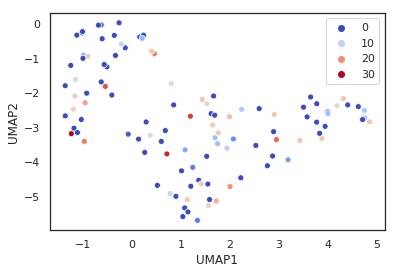

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c67.pkl
-------------
ARI: 0.020058990755657806


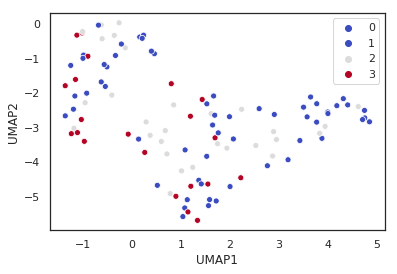

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c29.pkl
-------------
ARI: 0.029671745315949103


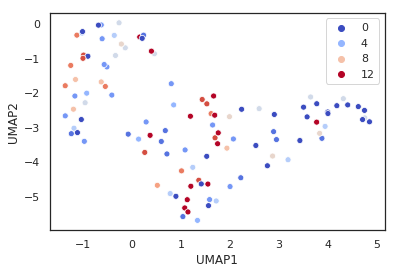

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c28.pkl
-------------
ARI: 0.052420514690791065


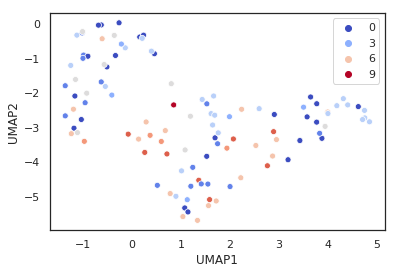

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c51.pkl
-------------
ARI: 0.11306156779905874


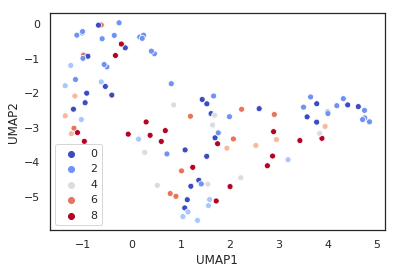

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c52.pkl
-------------
ARI: 0.09841722301402746


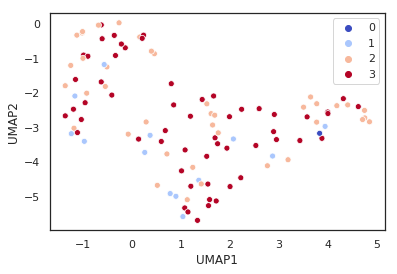

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e13-c14.pkl
-------------
ARI: 0.0726902940238202


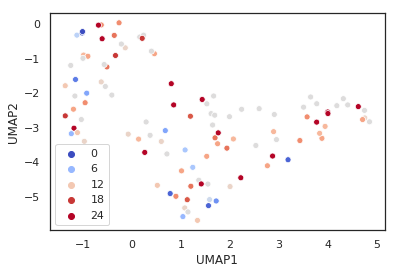

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_121850/goodPlayback-e10-c72.pkl
-------------
ARI: 0.07374556274304869


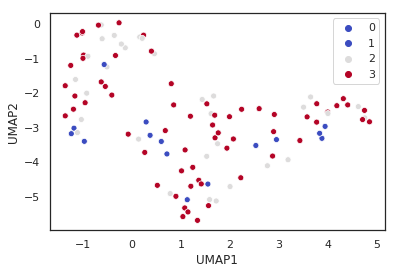

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e17-c3.pkl
-------------
ARI: 0.028552863857692914


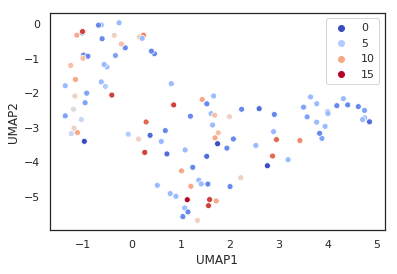

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e9-c13.pkl
-------------
ARI: 0.04110250700391594


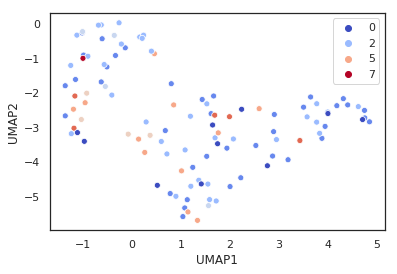

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e16-c66.pkl
-------------
ARI: 0.10780669593663011


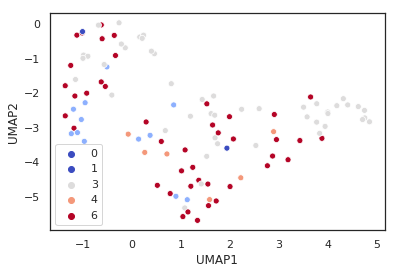

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c38.pkl
-------------
ARI: 0.11561121564514637


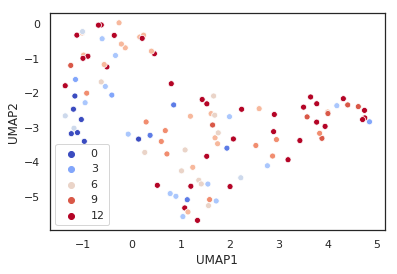

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c36.pkl
-------------
ARI: 0.05357997779384952


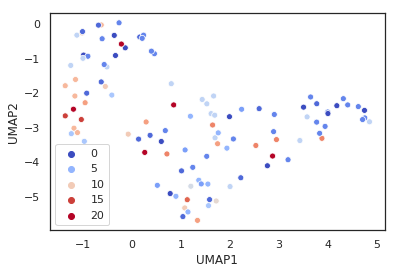

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e18-c4.pkl
-------------
ARI: 0.09939660911318537


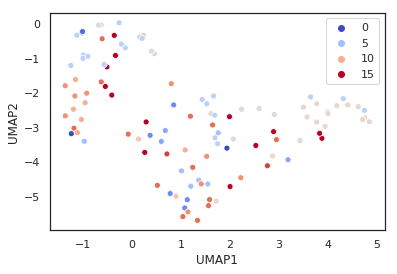

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e10-c1.pkl
-------------
ARI: 0.05258854962081697


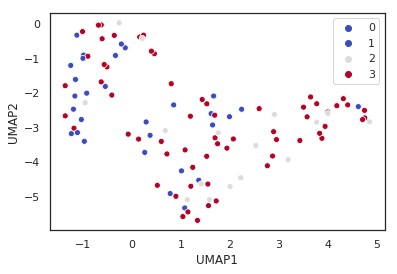

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e16-c96.pkl
-------------
ARI: 0.04200491348002563


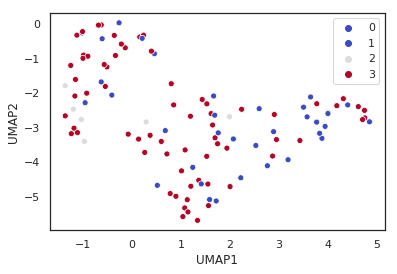

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c57.pkl
-------------
ARI: 0.09186076943208583


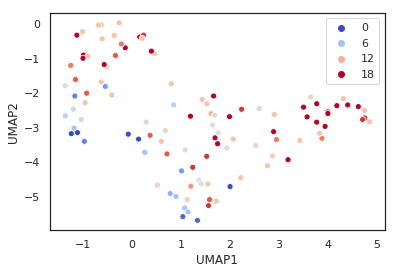

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c58.pkl
-------------
ARI: 0.045087860646793064


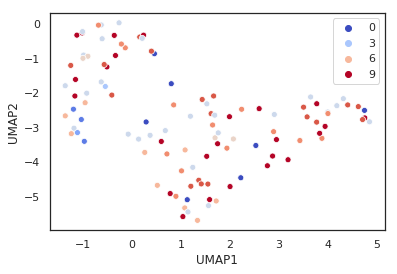

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c92.pkl
-------------
ARI: 0.03655509419464957


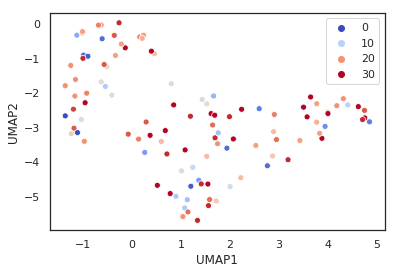

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c88.pkl
-------------
ARI: 0.05567739459400188


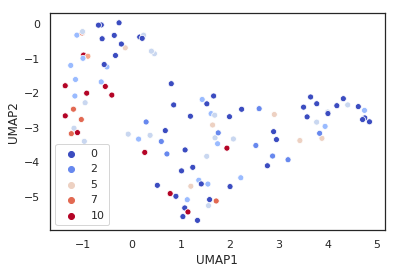

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e10-c36.pkl
-------------
ARI: 0.0338782745715974


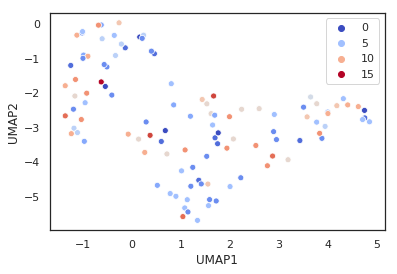

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c97.pkl
-------------
ARI: 0.1433058894403167


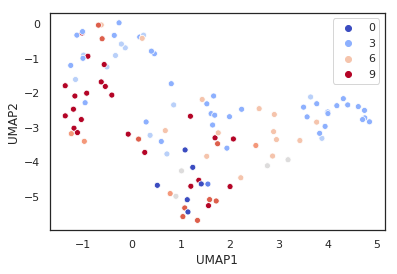

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c99.pkl
-------------
ARI: 0.05703657780533168


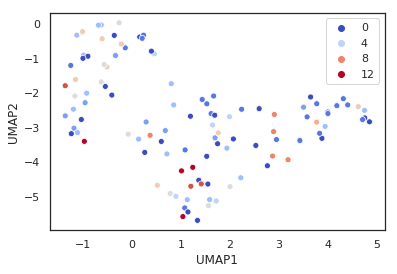

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e18-c59.pkl
-------------
ARI: 0.04694607975598508


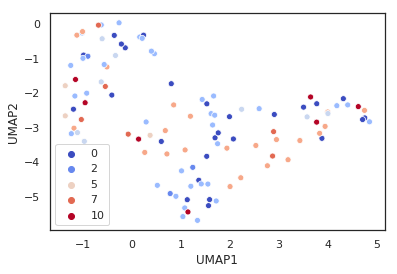

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e19-c56.pkl
-------------
ARI: 0.014224851273066334


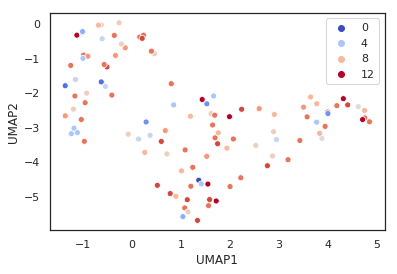

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e9-c22.pkl
-------------
ARI: 0.04365634282971874


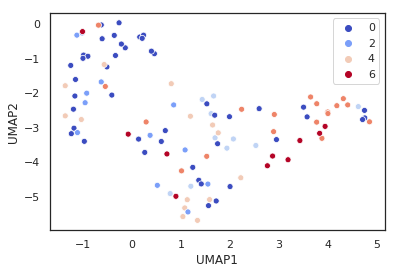

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e10-c44.pkl
-------------
ARI: 0.03359798412095273


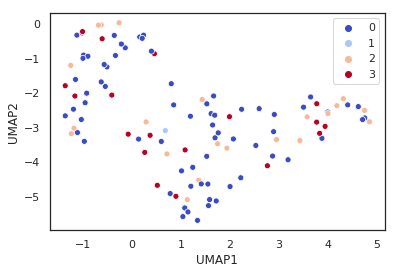

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c136.pkl
-------------
ARI: 0.012800499531689054


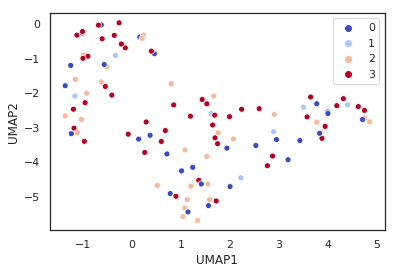

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c137.pkl
-------------
ARI: 0.007071997497099499


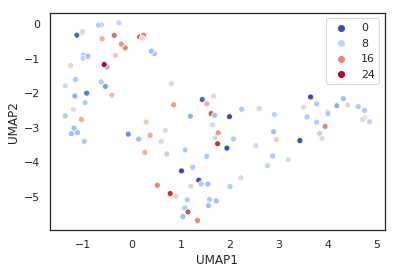

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e18-c109.pkl
-------------
ARI: 0.031020804408060303


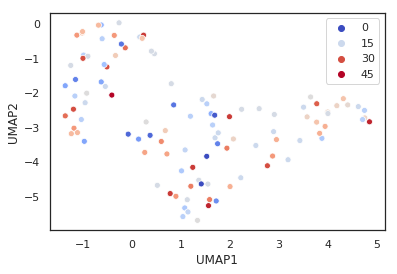

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e20-c56.pkl
-------------
ARI: 0.07570262934650235


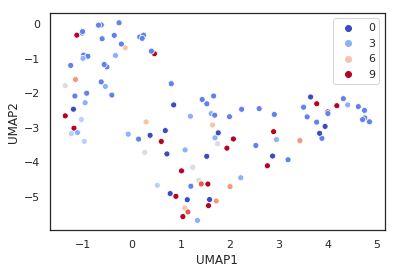

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e12-c1.pkl
-------------
ARI: 0.015003444183728466


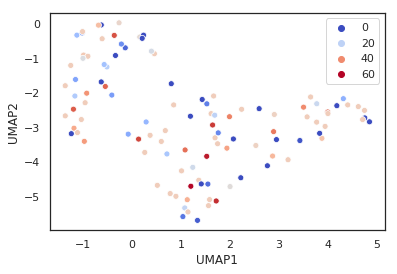

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e18-c7.pkl
-------------
ARI: 0.008547983591727738


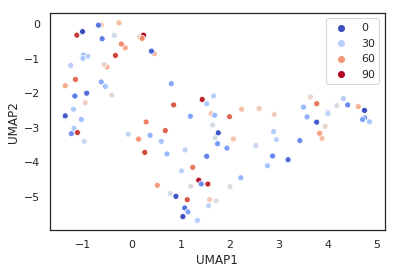

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c4.pkl
-------------
ARI: 0.07624705020750264


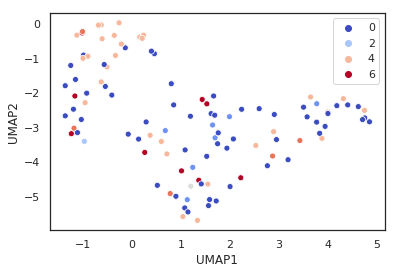

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c5.pkl
-------------
ARI: 0.024953812249902653


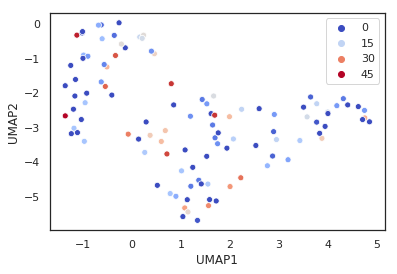

In [19]:
good_inds = (summary['zAud'] > .5)&(summary['selInd'] > .1)
for ind,row in summary[good_inds].iterrows():
    inPath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
    print("--------------")
    print(inPath)
    fileIn = open(inPath, 'rb')
    unitInfo = pk.load(fileIn)
    dfAbsTime = pk.load(fileIn)
    dfRelTime = pk.load(fileIn)
    fileIn.close()
    dfRelTime = dfRelTime[dfRelTime["call_type"].astype(bool)]
    
    t_inds = np.logical_and(dfRelTime['tKDE'][0] >= -.1,dfRelTime['tKDE'][0] < .6)
    PSTH_KDES_first_600 = np.zeros((len(dfRelTime),sum(t_inds)))
    for i in range(len(dfRelTime)):
        if dfRelTime['spikeKDE'][i][t_inds].sum() > 0:
            PSTH_KDES_first_600[i,:] = dfRelTime['spikeKDE'][i][t_inds]
    F,ari,pcs = cluster_analysis(PSTH_KDES_first_600,dfRelTime['call_type'][:],and_plot=False)
    F2 = np.zeros(len(df_out),dtype=int)
    for ind2,row2 in dfRelTime.iterrows():
        F2[df_out['FileName'] == row2['file']] = F[ind2]

    seaborn.scatterplot(df_out['UMAP1'],df_out['UMAP2'],hue=F2,palette="coolwarm")
    plt.show()

## Plot auditory call type over neural UMAP

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl
-------------
ARI: 0.05849123465282554


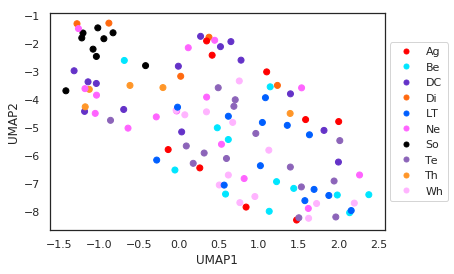

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl
-------------
ARI: 0.07116233683132837


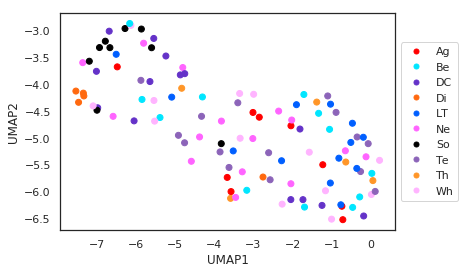

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_8_5t_190809_133540/goodPlayback-e19-c2.pkl
-------------
ARI: 0.09059991795797488


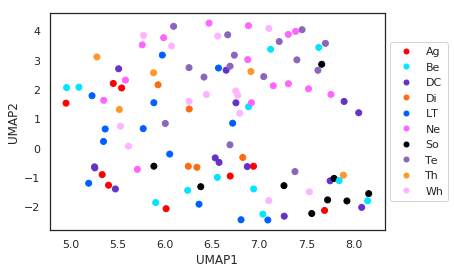

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_4_5t_190718_091732/goodPlayback-e17-c1.pkl
-------------
ARI: 0.02714538020467905


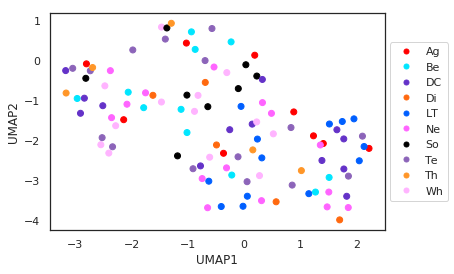

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e10-c65.pkl
-------------
ARI: 0.056395531873244927


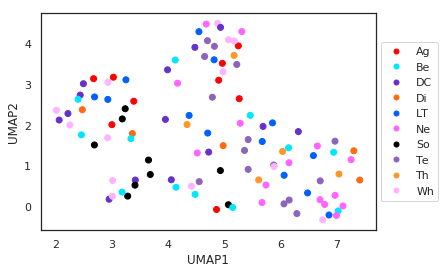

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e17-c31.pkl
-------------
ARI: 0.0913275427478579


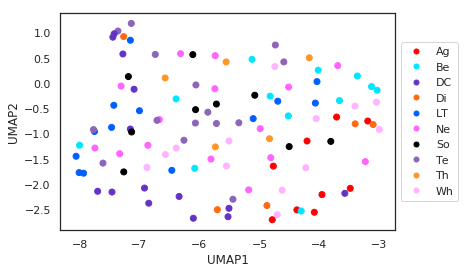

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e19-c32.pkl
-------------
ARI: 0.10944381014516394


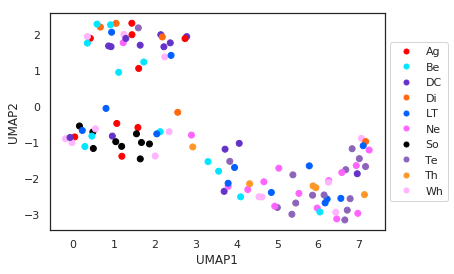

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5_5t_190722_121506/goodPlayback-e19-c58.pkl
-------------
ARI: 0.08858375833660259


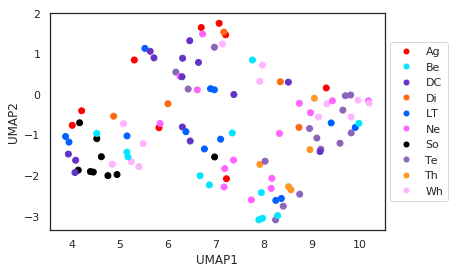

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c31.pkl
-------------
ARI: 0.0247003854170909


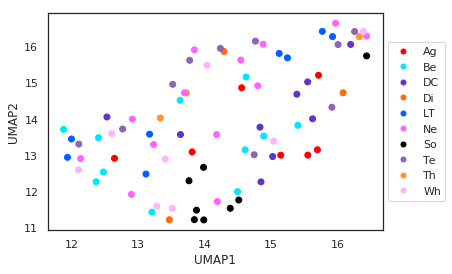

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c86.pkl
-------------
ARI: 0.058914527531010195


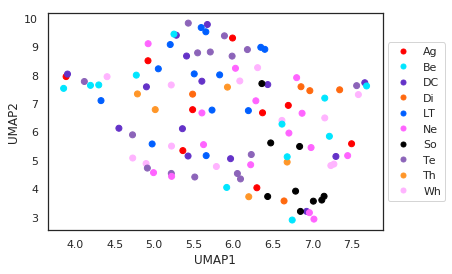

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c85.pkl
-------------
ARI: 0.0583684319899888


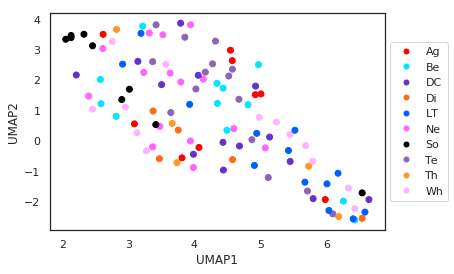

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c84.pkl
-------------
ARI: 0.053170931662469986


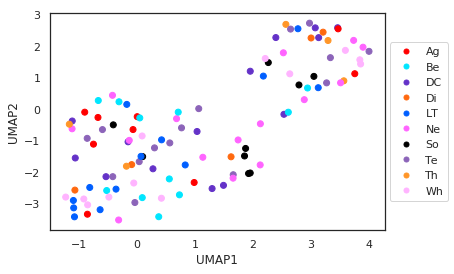

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c34.pkl
-------------
ARI: 0.03534879241012306


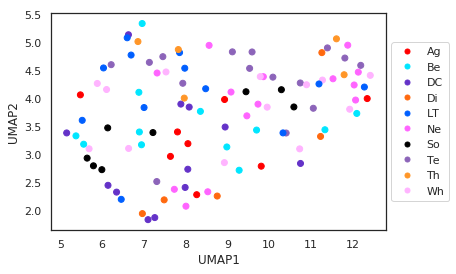

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_8t_190627_132428/goodPlayback-e12-c76.pkl
-------------
ARI: 0.042198382351836865


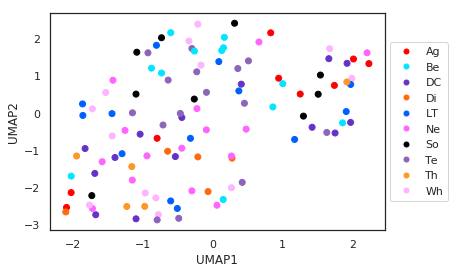

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_9t_190630_100846/goodPlayback-e10-c79.pkl
-------------
ARI: 0.061972149280167345


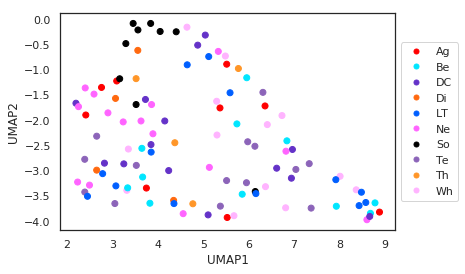

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c65.pkl
-------------
ARI: 0.10747330960854093


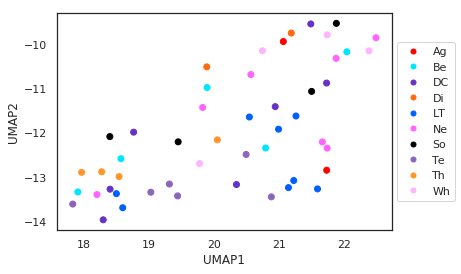

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c67.pkl
-------------
ARI: 0.03745120095282208


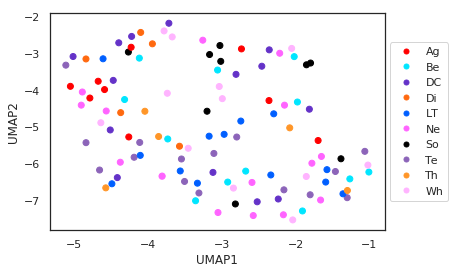

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c29.pkl
-------------
ARI: 0.012242150285525602


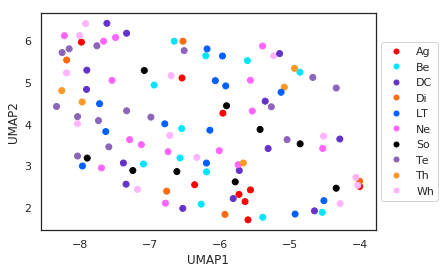

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c28.pkl
-------------
ARI: 0.07183904525014397


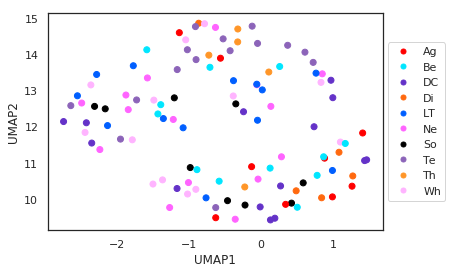

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c51.pkl
-------------
ARI: 0.09143947406118275


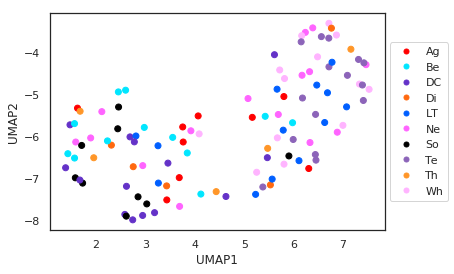

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c52.pkl
-------------
ARI: 0.10734597452595528


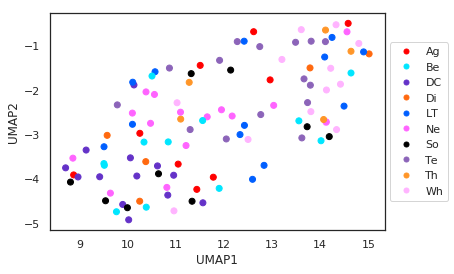

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e13-c14.pkl
-------------
ARI: 0.09881013967925505


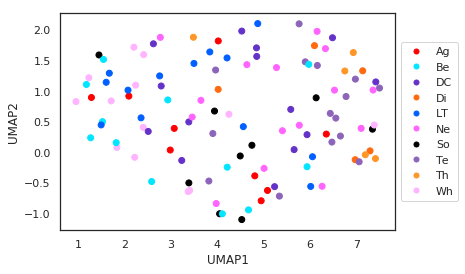

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_121850/goodPlayback-e10-c72.pkl
-------------
ARI: 0.10477814461415665


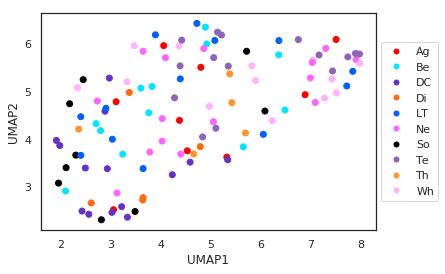

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e17-c3.pkl
-------------
ARI: 0.04889536665705347


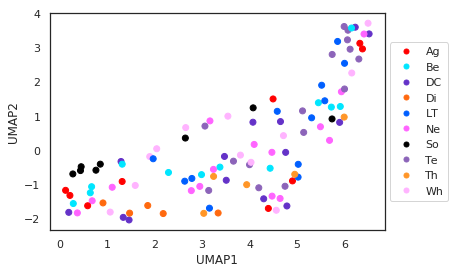

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e9-c13.pkl
-------------
ARI: 0.05596731862922947


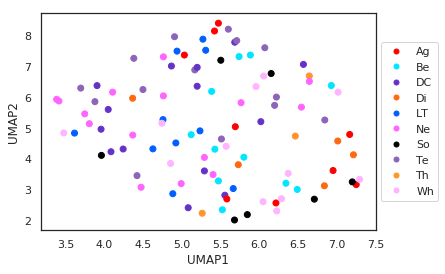

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e16-c66.pkl
-------------
ARI: 0.10555154327930573


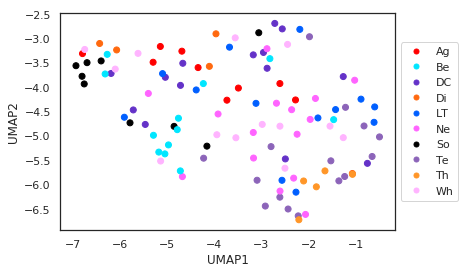

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c38.pkl
-------------
ARI: 0.08602174204922887


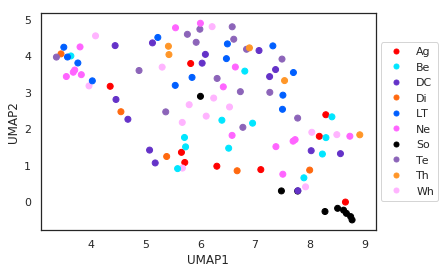

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c36.pkl
-------------
ARI: 0.0729058673901421


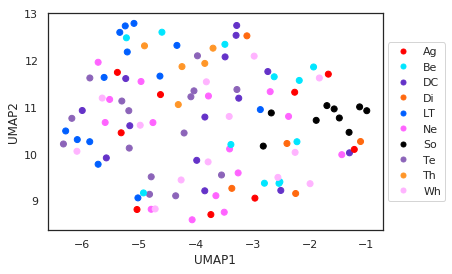

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e18-c4.pkl
-------------
ARI: 0.07136617488949946


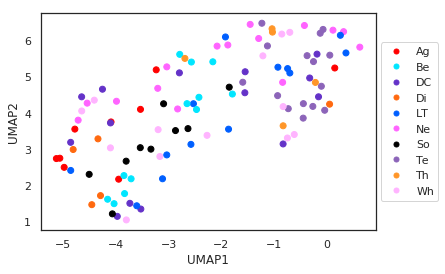

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e10-c1.pkl
-------------
ARI: 0.04511948506744926


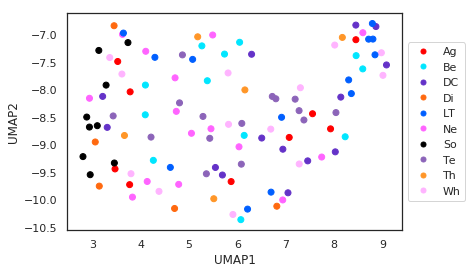

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e16-c96.pkl
-------------
ARI: 0.022727272727272728


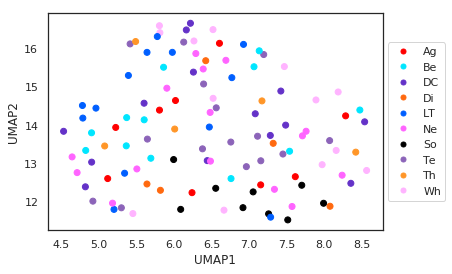

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c57.pkl
-------------
ARI: 0.117251187241283


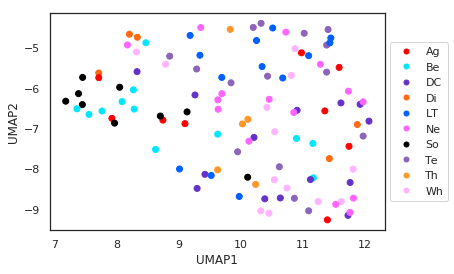

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c58.pkl
-------------
ARI: 0.05610111246408531


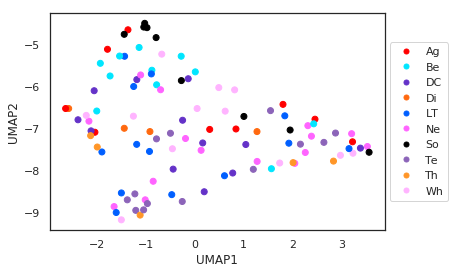

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c92.pkl
-------------
ARI: 0.039900950801467196


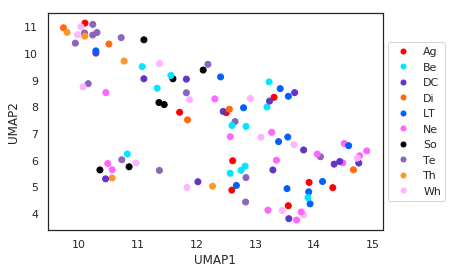

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c88.pkl
-------------
ARI: 0.08685143422978055


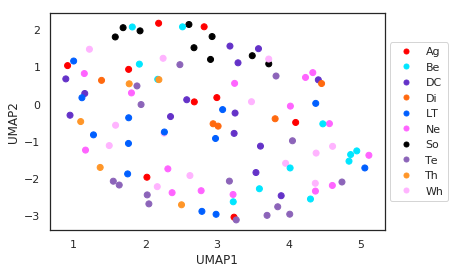

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e10-c36.pkl
-------------
ARI: 0.013312404514149303


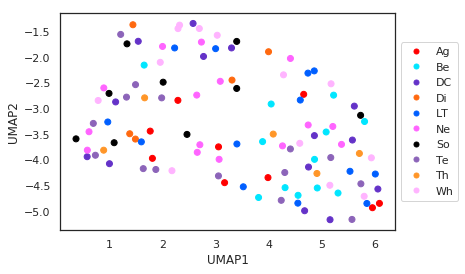

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c97.pkl
-------------
ARI: 0.10990471969864835


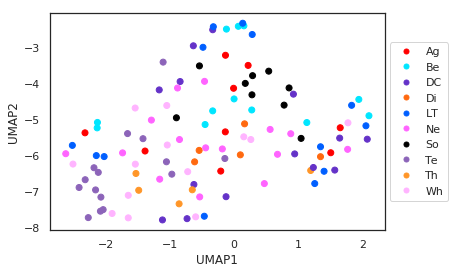

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c99.pkl
-------------
ARI: 0.04553645415444512


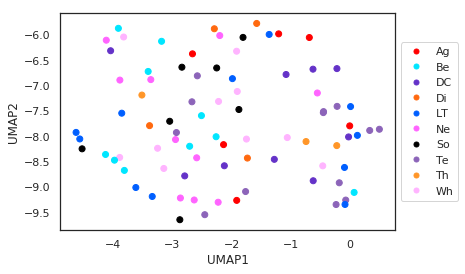

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e18-c59.pkl
-------------
ARI: 0.039079695757515236


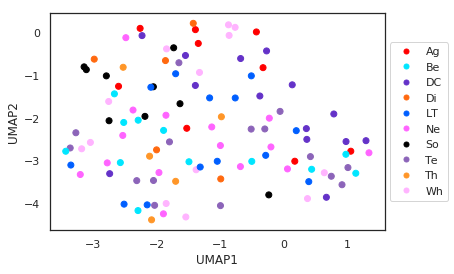

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e19-c56.pkl
-------------
ARI: 0.00358158755331802


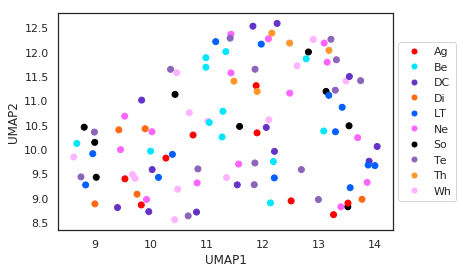

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e9-c22.pkl
-------------
ARI: 0.014017493102712657


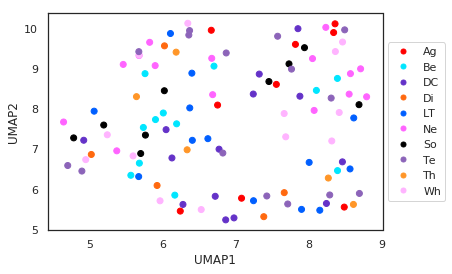

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e10-c44.pkl
-------------
ARI: 0.000627862840508572


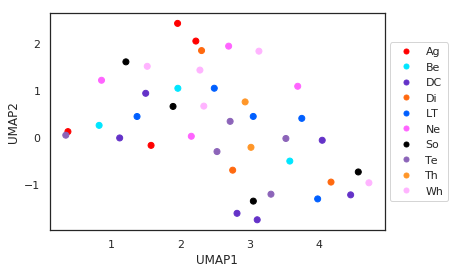

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c136.pkl
-------------
ARI: 0


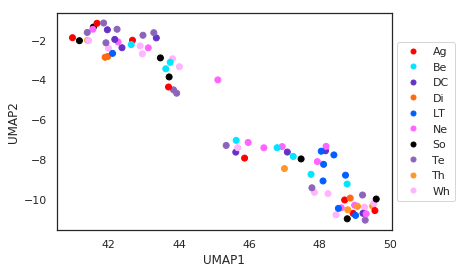

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c137.pkl
-------------
ARI: 0.003333029595709056


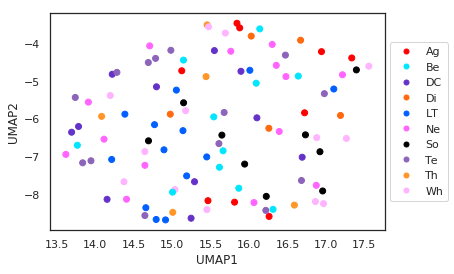

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e18-c109.pkl
-------------
ARI: 0.06198021088248195


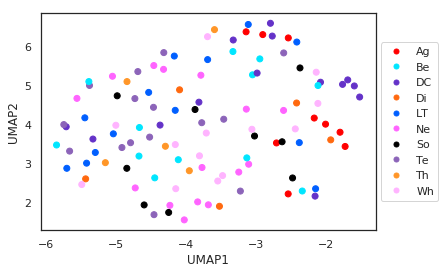

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e20-c56.pkl
-------------
ARI: 0.06851918397271871


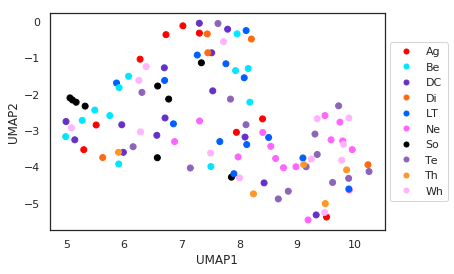

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e12-c1.pkl
-------------
ARI: 0.01806401633860347


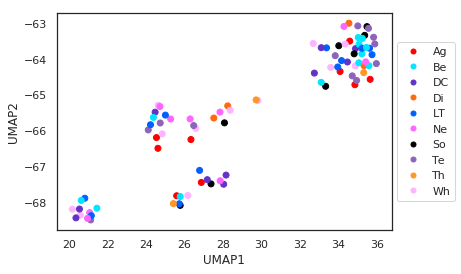

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e18-c7.pkl
-------------
ARI: 0.00010239177887099061


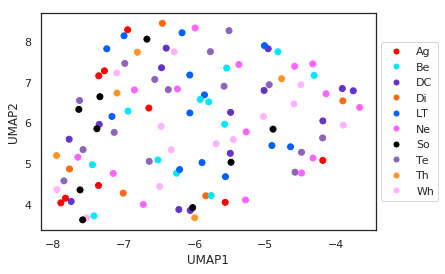

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c4.pkl
-------------
ARI: 0.046407883347759506


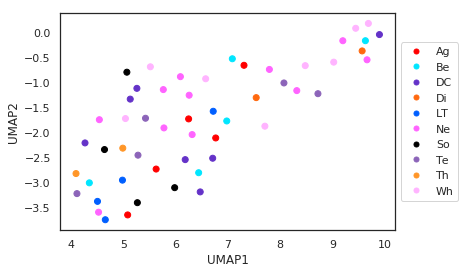

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c5.pkl
-------------
ARI: 0.006609197871992982


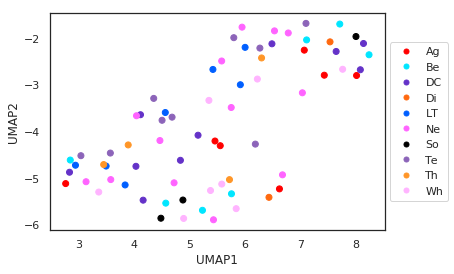

In [20]:
good_inds = (summary['zAud'] > .5)&(summary['selInd'] > .1)
for ind,row in summary[good_inds].iterrows():
    inPath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
    print("--------------")
    print(inPath)
    fileIn = open(inPath, 'rb')
    unitInfo = pk.load(fileIn)
    dfAbsTime = pk.load(fileIn)
    dfRelTime = pk.load(fileIn)
    fileIn.close()
    dfRelTime = dfRelTime[dfRelTime["call_type"].astype(bool)]
    
    t_inds = np.logical_and(dfRelTime['tKDE'][0] >= -.1,dfRelTime['tKDE'][0] < .6)
    PSTH_KDES_first_600 = np.zeros((len(dfRelTime),sum(t_inds)))
    for i in range(len(dfRelTime)):
        if dfRelTime['spikeKDE'][i][t_inds].sum() > 0:
            PSTH_KDES_first_600[i,:] = dfRelTime['spikeKDE'][i][t_inds]
    F,ari,pcs = cluster_analysis(PSTH_KDES_first_600,dfRelTime['call_type'][:],and_plot=False, use_umap=True)
    
    plt.scatter(pcs[:,0],pcs[:,1], c=[callColor[x] for x in dfRelTime['call_type'][:]])
    colors = [callColor[x] for x in np.unique(dfRelTime['call_type'][:])]
    markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=5) for color in colors]
    plt.legend(markers, np.unique(dfRelTime['call_type'][:]), numpoints=1,loc='center left', bbox_to_anchor=(1., 0.5), ncol=1)
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    #plt.savefig("AuditoryUMAP.pdf")

    plt.show()

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl
-------------
0.05982543675453435
-------------


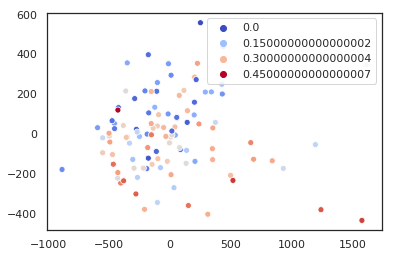

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl
-------------
0.047302509560621736
-------------


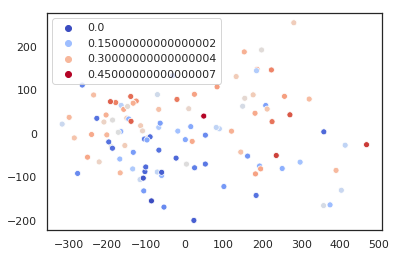

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_8_5t_190809_133540/goodPlayback-e19-c2.pkl
-------------
0.06135819642764029
-------------


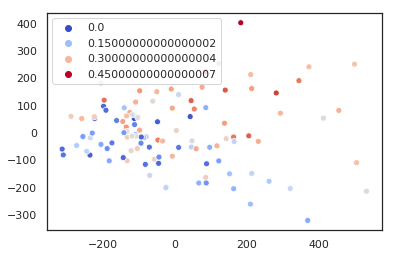

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_4_5t_190718_091732/goodPlayback-e17-c1.pkl
-------------
0.01382890747036662
-------------


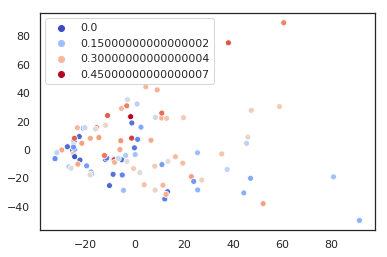

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5_5t_190722_121506/goodPlayback-e19-c58.pkl
-------------
0.06859133230624959
-------------


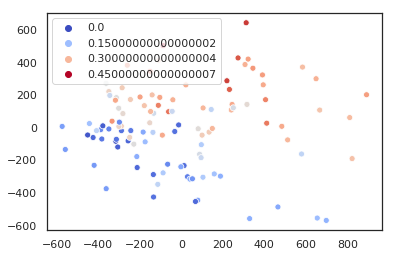

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c65.pkl
-------------
0.0757220611020619
-------------


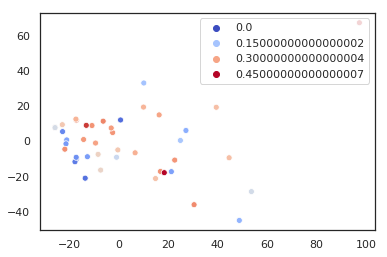

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c67.pkl
-------------
0.020058990755657806
-------------


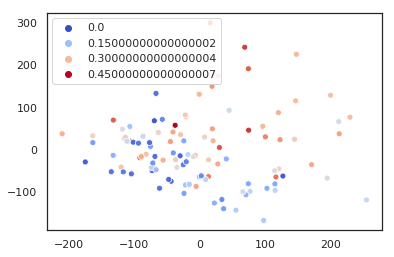

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c29.pkl
-------------
0.029671745315949103
-------------


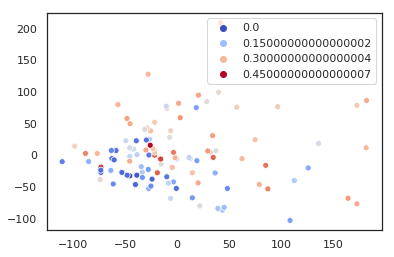

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c28.pkl
-------------
0.052420514690791065
-------------


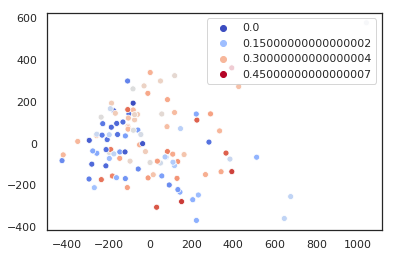

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c51.pkl
-------------
0.11306156779905874
-------------


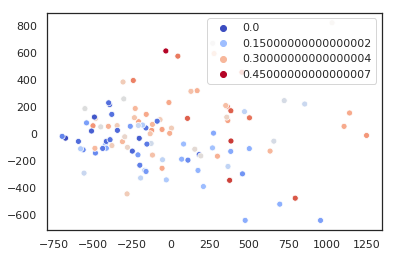

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c52.pkl
-------------
0.09841722301402746
-------------


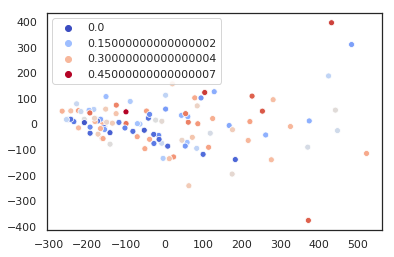

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e13-c14.pkl
-------------
0.0726902940238202
-------------


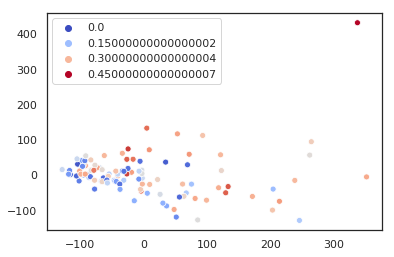

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e17-c3.pkl
-------------
0.028552863857692914
-------------


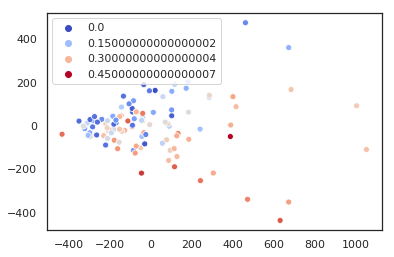

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e9-c13.pkl
-------------
0.04110250700391594
-------------


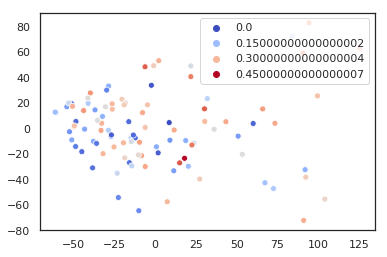

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e16-c66.pkl
-------------
0.10780669593663011
-------------


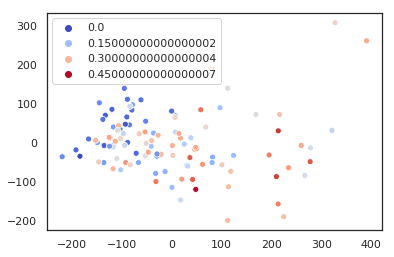

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c38.pkl
-------------
0.11561121564514637
-------------


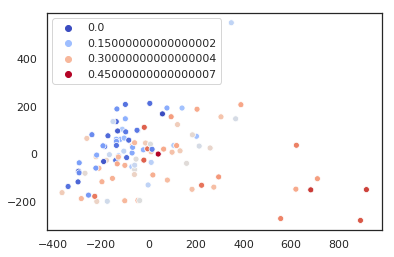

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c36.pkl
-------------
0.05357997779384952
-------------


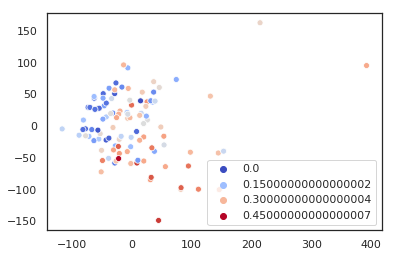

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e18-c4.pkl
-------------
0.09939660911318537
-------------


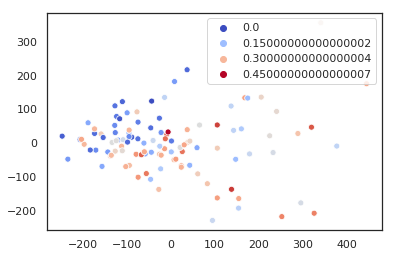

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e10-c1.pkl
-------------
0.05258854962081697
-------------


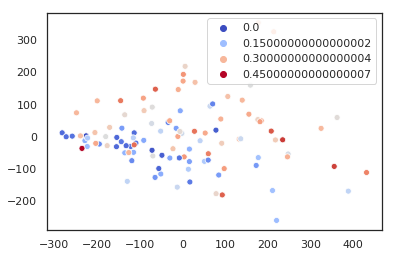

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e16-c96.pkl
-------------
0.04200491348002563
-------------


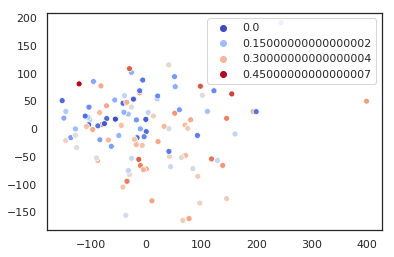

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c57.pkl
-------------
0.09186076943208583
-------------


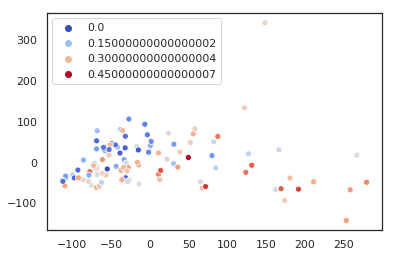

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c58.pkl
-------------
0.045087860646793064
-------------


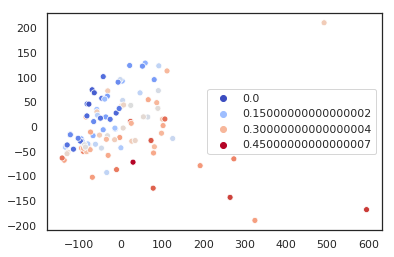

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c92.pkl
-------------
0.03655509419464957
-------------


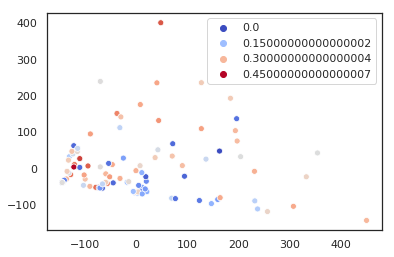

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c88.pkl
-------------
0.05567739459400188
-------------


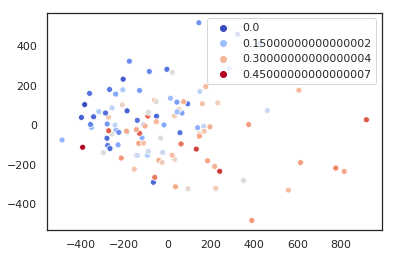

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e10-c36.pkl
-------------
0.0338782745715974
-------------


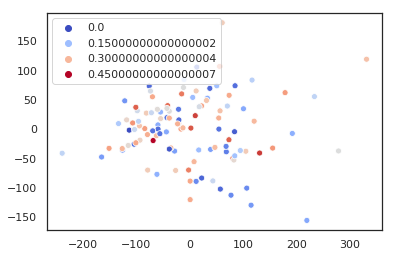

In [62]:
good_inds = (summary['zAud'] > .5)&(summary['selInd'] > .1)
for ind,row in summary[good_inds].iterrows():
    inPath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
    print("--------------")
    print(inPath)
    fileIn = open(inPath, 'rb')
    unitInfo = pk.load(fileIn)
    dfAbsTime = pk.load(fileIn)
    dfRelTime = pk.load(fileIn)
    fileIn.close()
    dfRelTime = dfRelTime[dfRelTime["call_type"].astype(bool)]
    
    t_inds = np.logical_and(dfRelTime['tKDE'][0] >= -.1,dfRelTime['tKDE'][0] < .6)
    PSTH_KDES_first_600 = np.zeros((len(dfRelTime),sum(t_inds)))
    for i in range(len(dfRelTime)):
        if dfRelTime['spikeKDE'][i][t_inds].sum() > 0:
            PSTH_KDES_first_600[i,:] = dfRelTime['spikeKDE'][i][t_inds]
    F,ari,pcs = cluster_analysis(PSTH_KDES_first_600,dfRelTime['call_type'][:],and_plot=False)
    F2 = np.zeros(len(pcs),dtype=float)
    for ind2,row2 in dfRelTime.iterrows():
        if (df_out['FileName']==row2['file']).sum() > 0:
            F2[ind2] = df_out[df_out['FileName']==row2['file']]['meanT']
        else:
            F2[ind2] = -1
    pcs = pcs[F2!=-1]
    F2 = F2[F2!=-1]
    seaborn.scatterplot(pcs[:,0],pcs[:,1],hue=F2,palette="coolwarm")
    plt.show()

## Multi neuron analysis in site

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e17-c3.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e9-c13.pkl
-------------
ARI: 0.0386575890777332


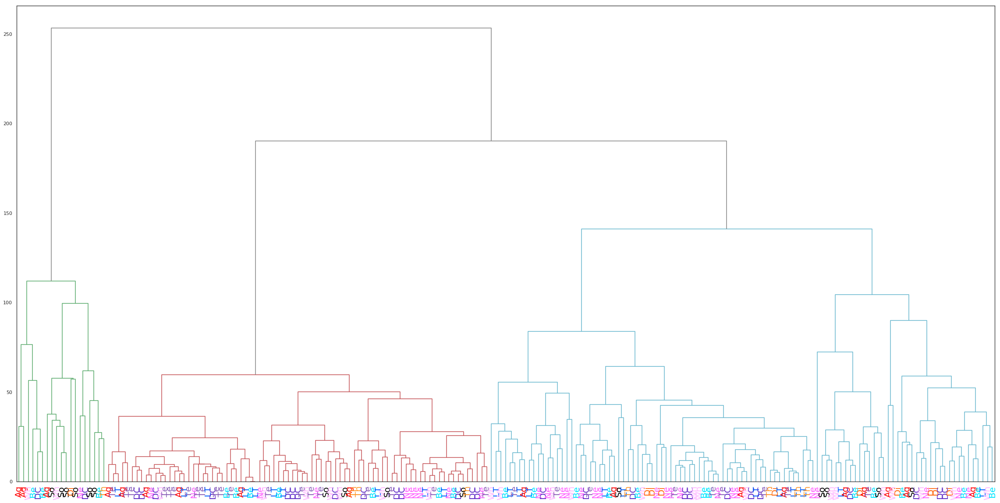

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e16-c66.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c38.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c36.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e18-c4.pkl
-------------
ARI: 0.07745932346266542


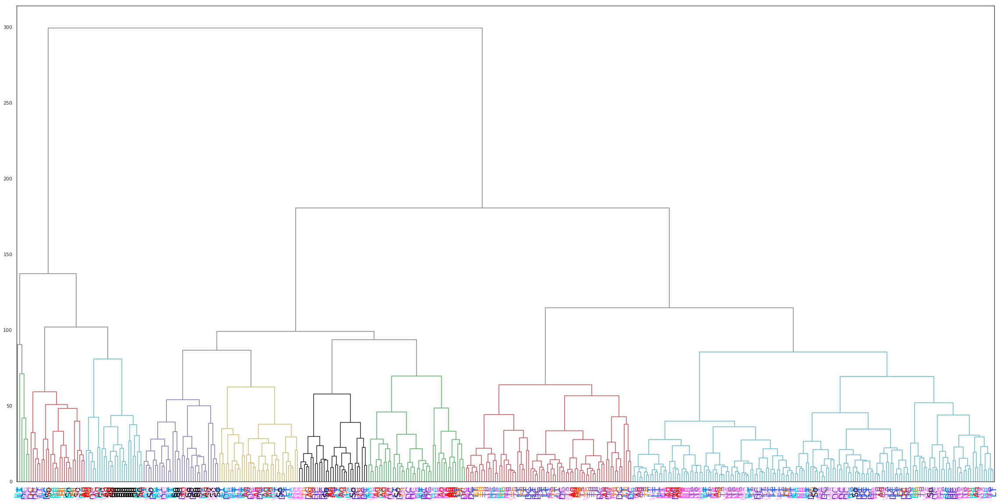

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e10-c1.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e16-c96.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c57.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c58.pkl
-------------
ARI: 0.029668403951617076


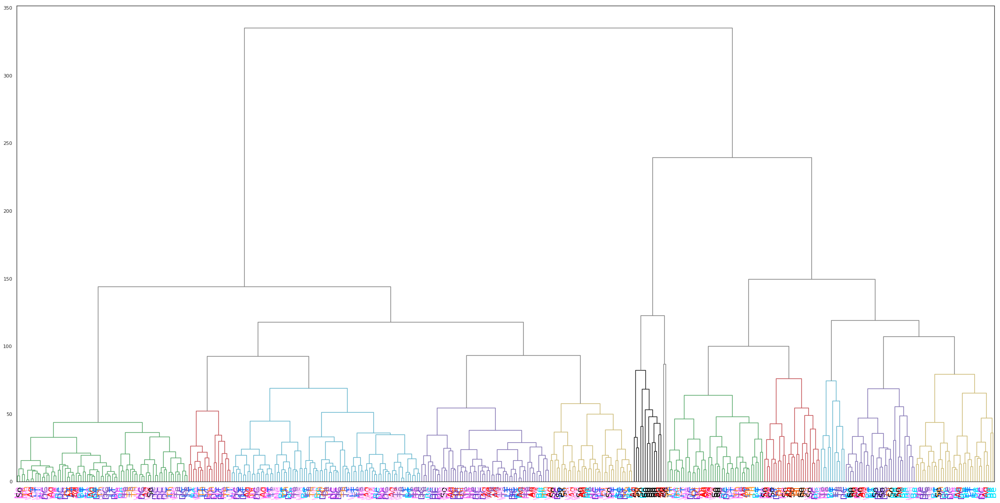

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c92.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c88.pkl
-------------
ARI: 0.029033577227145543


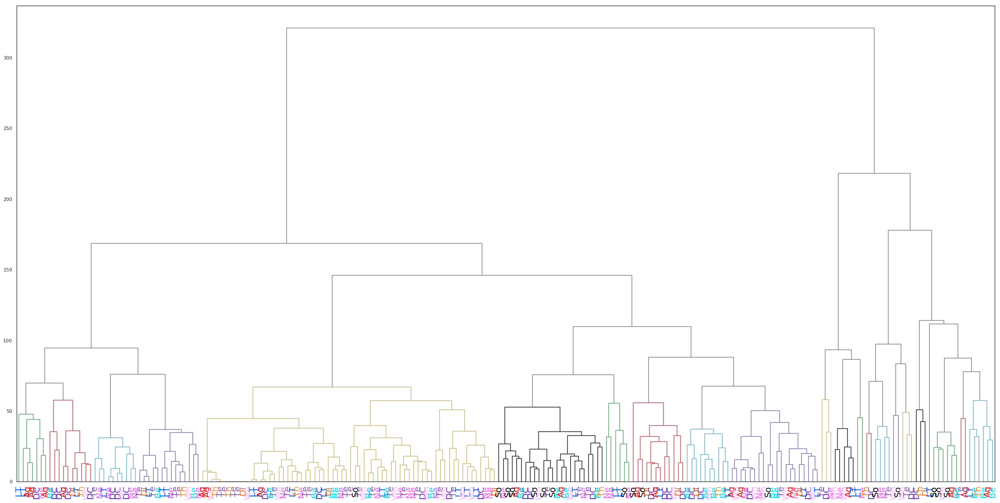

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e10-c36.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c97.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c99.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e18-c59.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e19-c56.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e9-c22.pkl
-------------
ARI: 0.009418311126258546


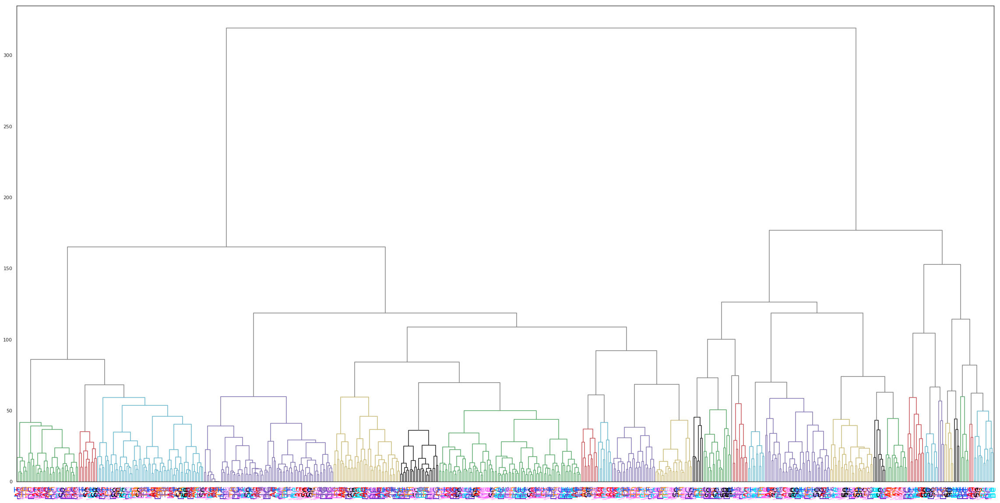

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e10-c44.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c136.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c137.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e18-c109.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e20-c56.pkl
-------------
ARI: 0.008126819940797418


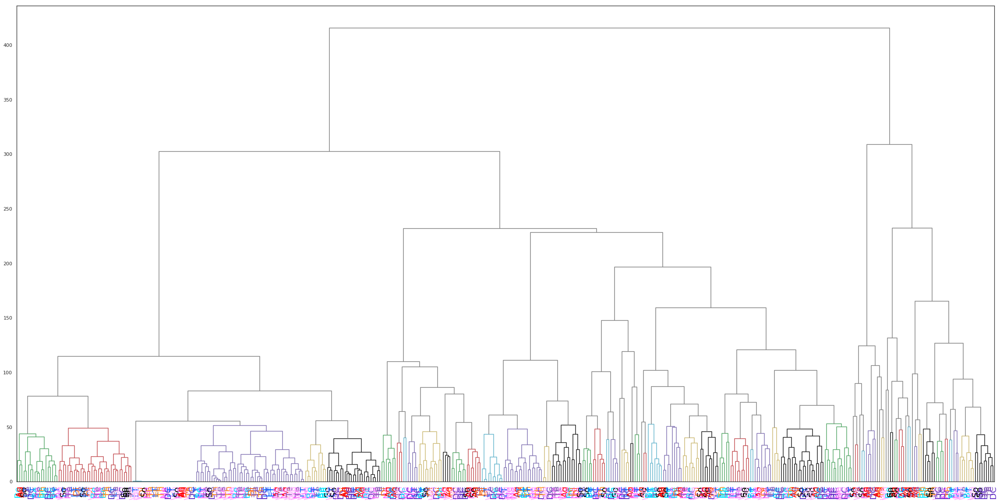

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e12-c1.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e18-c7.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c4.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c5.pkl
-------------
ARI: 0.005745151157150306


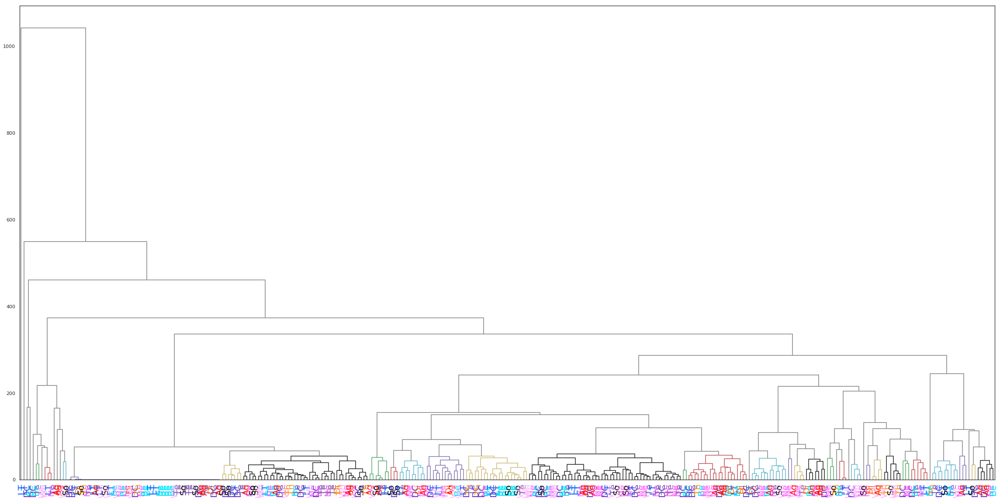

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c29.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c28.pkl
-------------
ARI: 0.013424037451169308


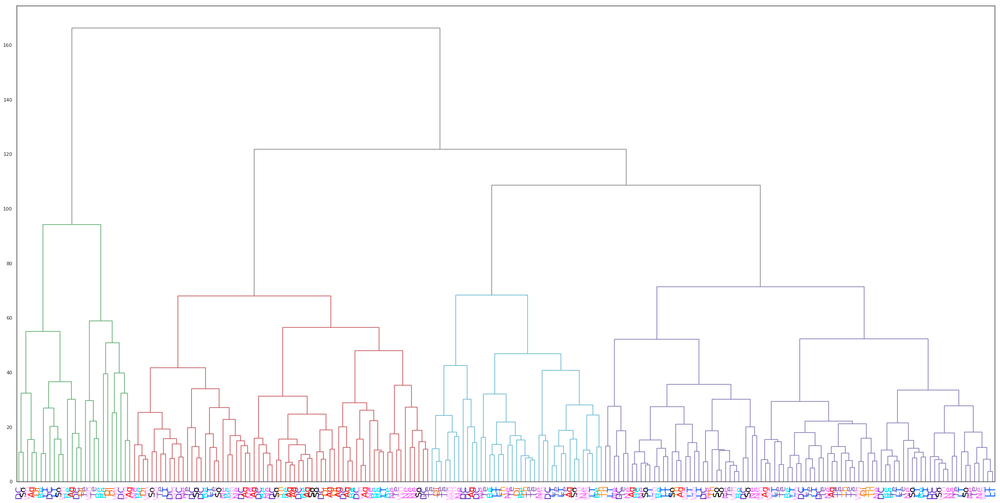

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c65.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c67.pkl
-------------
ARI: 0.017573953048692602


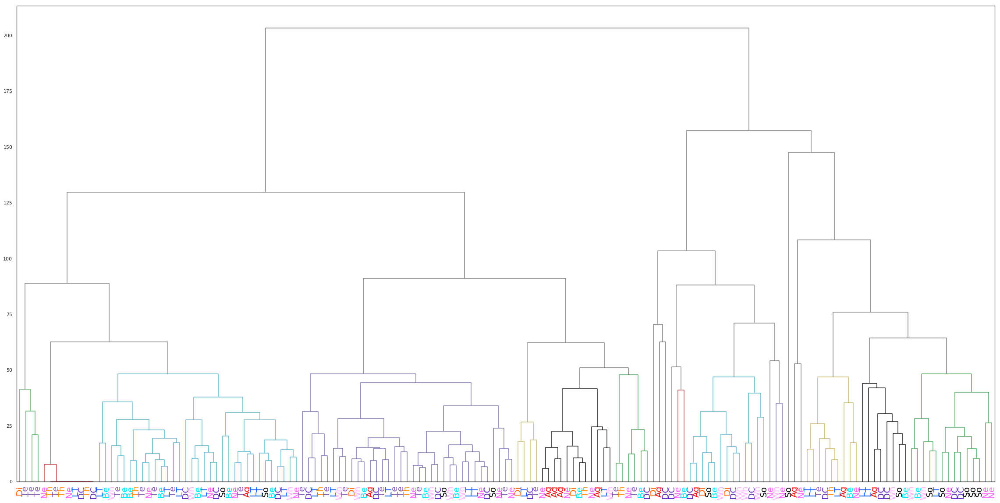

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c51.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c52.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e13-c14.pkl
-------------
ARI: 0.048510547534959


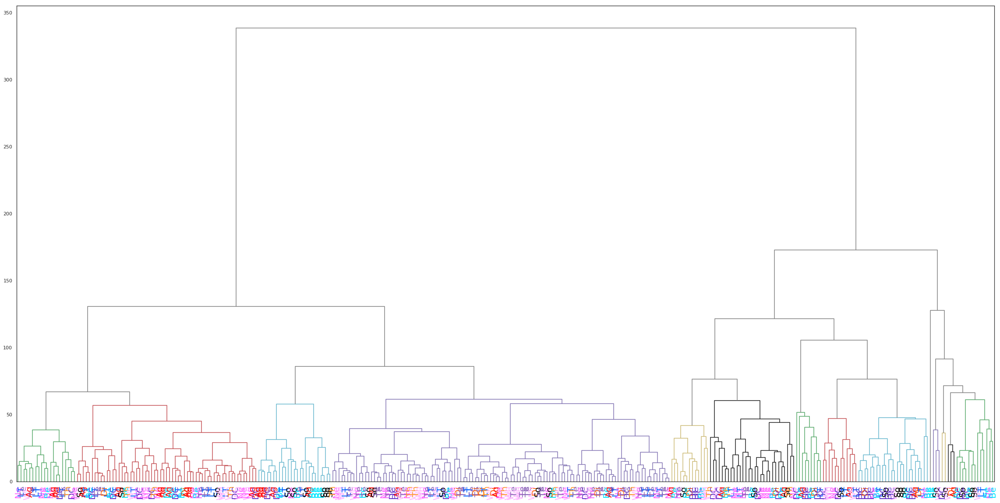

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_121850/goodPlayback-e10-c72.pkl
-------------
ARI: 0.07374556274304869


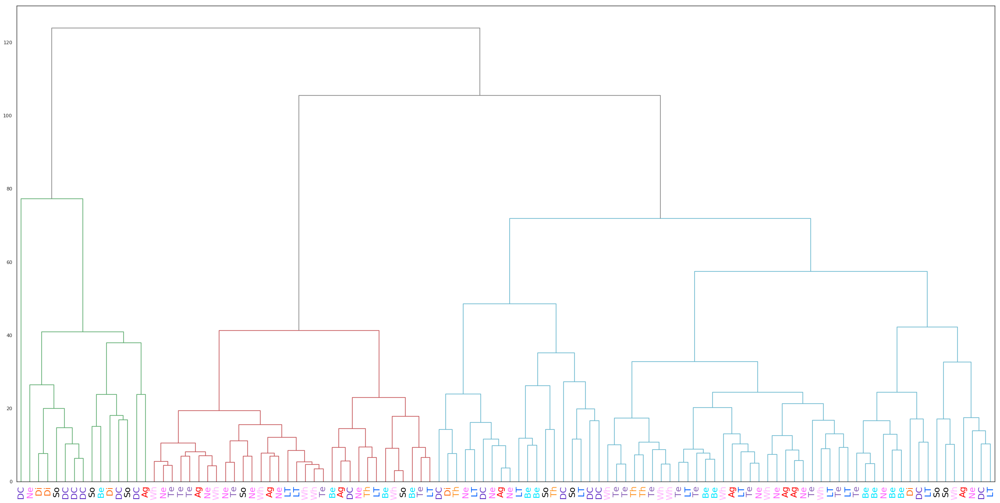

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c31.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c86.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c85.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c84.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c34.pkl
-------------
ARI: 0.013980098523634995


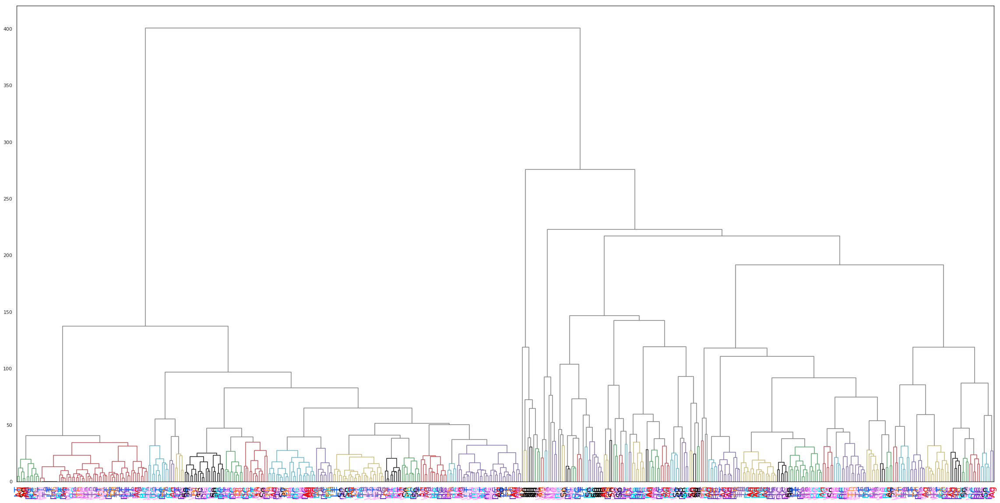

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_8t_190627_132428/goodPlayback-e12-c76.pkl
-------------
ARI: 0.04833221292786206


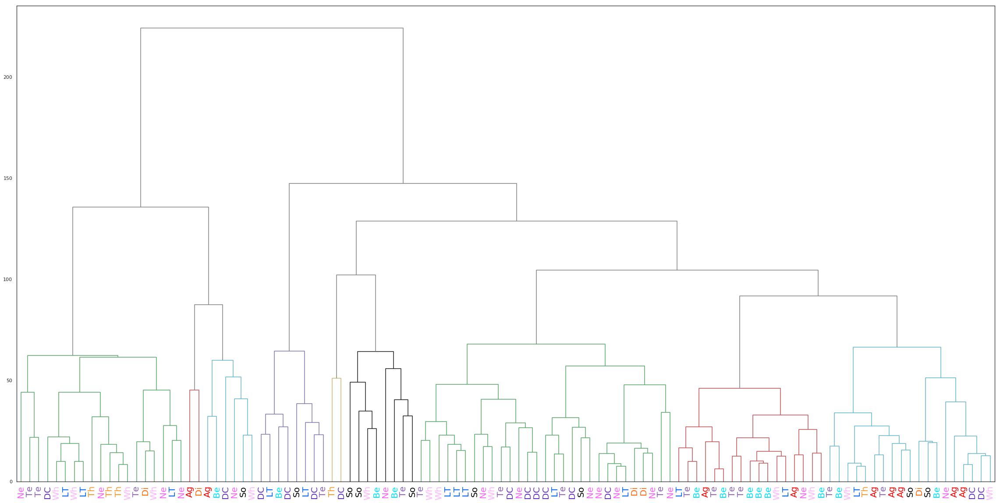

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_9t_190630_100846/goodPlayback-e10-c79.pkl
-------------
ARI: 0.037656553351859606


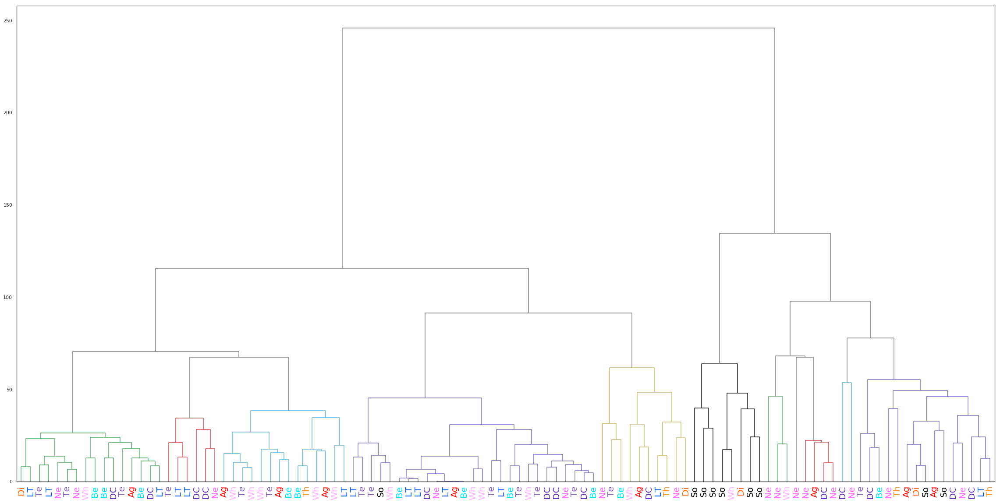

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_4_5t_190718_091732/goodPlayback-e17-c1.pkl
-------------
ARI: 0.01382890747036662


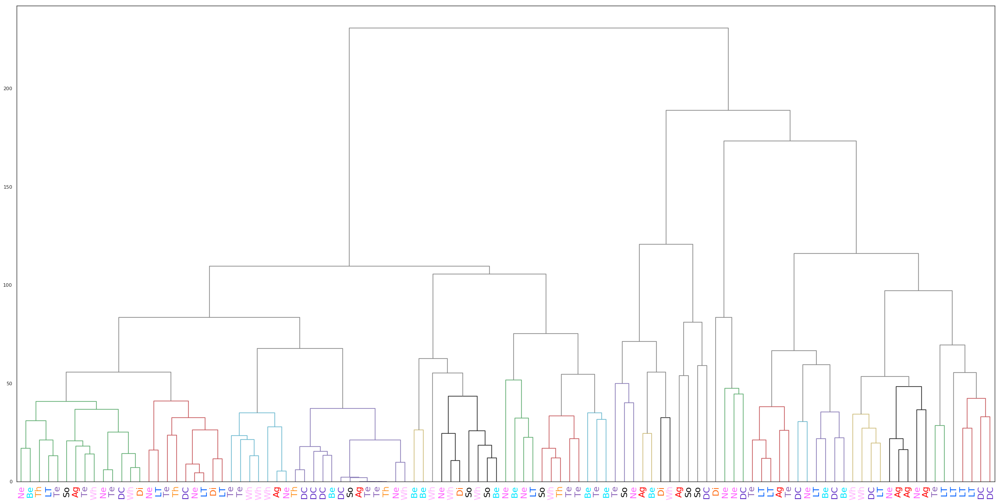

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5_5t_190722_121506/goodPlayback-e19-c58.pkl
-------------
ARI: 0.06859133230624959


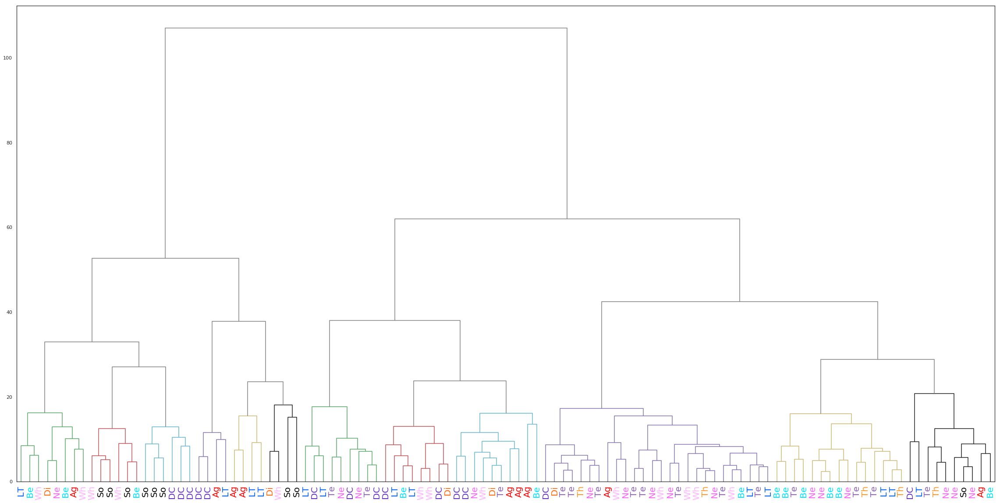

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl
-------------
ARI: 0.09310764138086154


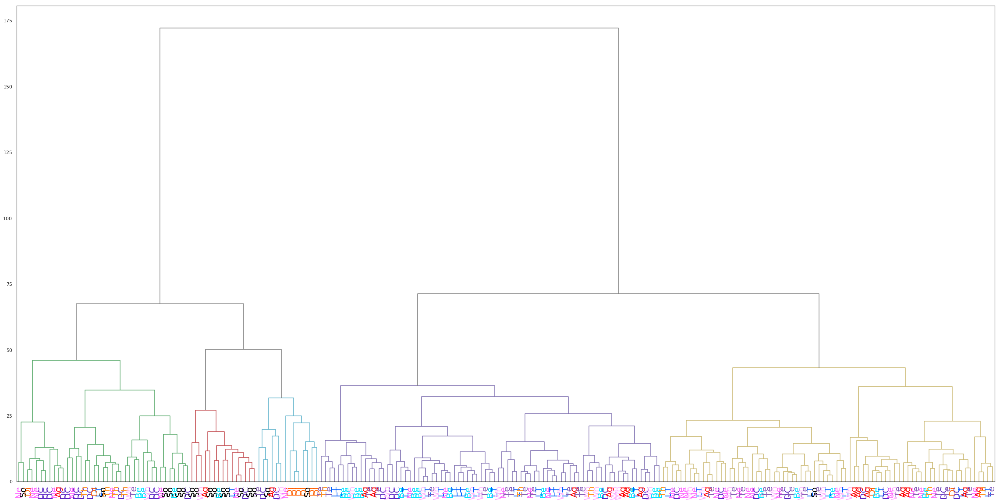

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e10-c65.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e17-c31.pkl
--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e19-c32.pkl
-------------
ARI: 0.05264131480479589


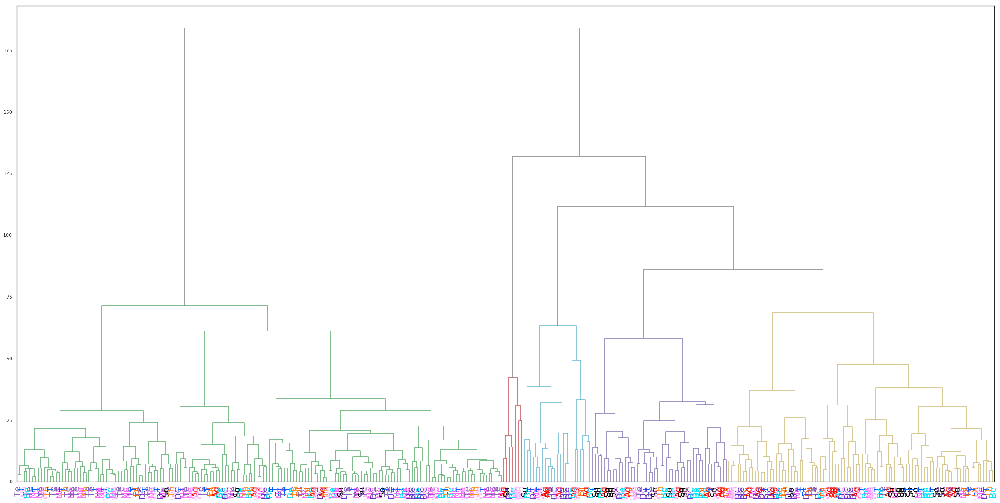

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_8_5t_190809_133540/goodPlayback-e19-c2.pkl
-------------
ARI: 0.06135819642764029


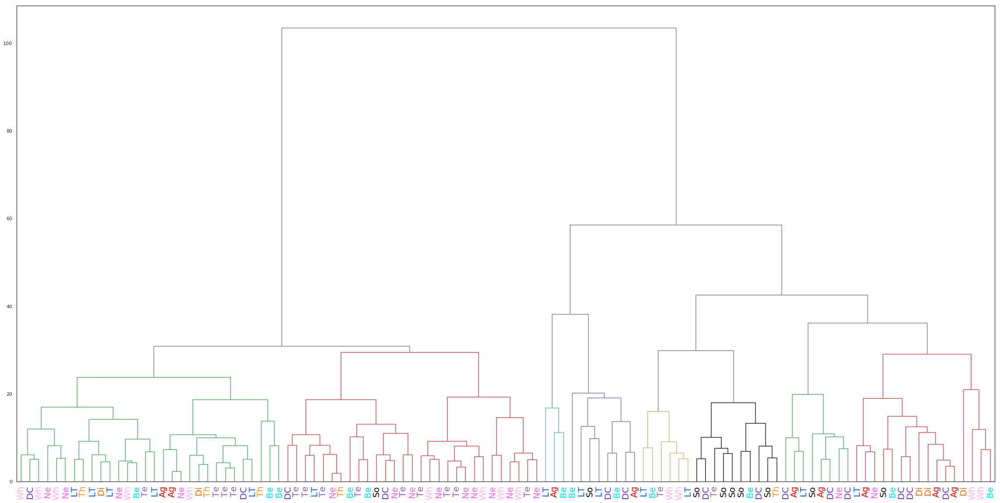

In [21]:
# go through all sites, compare all neurons in that site
good_inds = (summary['zAud'] > .5)&(summary['selInd'] > .1)
for site in np.unique(summary[good_inds]['site']):
    site_inds = summary[good_inds]['site'] == site
    all_PSTH = []
    all_labels = []
    if sum(good_inds) == 1:
        continue
    for ind,row in summary[good_inds][site_inds].iterrows():
        inPath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
        print("--------------")
        print(inPath)
        fileIn = open(inPath, 'rb')
        unitInfo = pk.load(fileIn)
        dfAbsTime = pk.load(fileIn)
        dfRelTime = pk.load(fileIn)
        fileIn.close()
        dfRelTime = dfRelTime[dfRelTime["call_type"].astype(bool)]

        t_inds = np.logical_and(dfRelTime['tKDE'][0] >= -.1,dfRelTime['tKDE'][0] < .6)
        PSTH_KDES_first_600 = np.zeros((len(dfRelTime),sum(t_inds)))
        for i in range(len(dfRelTime)):
            if dfRelTime['spikeKDE'][i][t_inds].sum() > 0:
                PSTH_KDES_first_600[i,:] = dfRelTime['spikeKDE'][i][t_inds]
        PSTH_KDES_first_600 /= np.mean(PSTH_KDES_first_600)
        all_PSTH.append(PSTH_KDES_first_600)
        all_labels.append(dfRelTime['call_type'][:])
    psths = np.vstack(all_PSTH)
    labels = np.hstack(all_labels)
    F,ari,pcs = cluster_analysis(psths,labels,and_plot=True)
    plt.show()
    

## Coherence calculations

In [48]:
import sys
import os
import seaborn as sns; sns.set()
sys.path.append("/auto/fhome/lthomas/repositories/soundsig/soundsig")
from coherence2 import multitapered_coherence
import scipy
import pylab
import scipy.cluster.hierarchy as sch

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c64.pkl


/auto/fhome/lthomas/.virtualenvs/py3_env/lib/python3.5/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


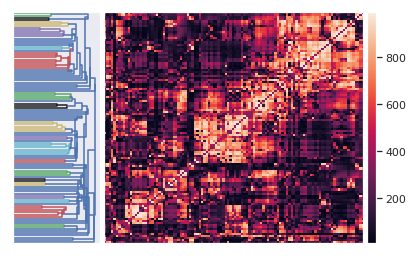

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5t_190720_152938/goodPlayback-e19-c65.pkl


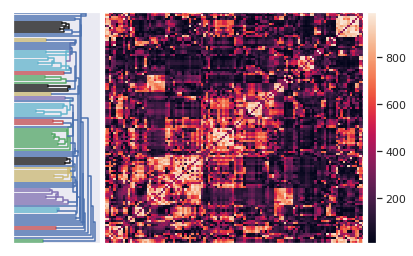

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_8_5t_190809_133540/goodPlayback-e19-c2.pkl


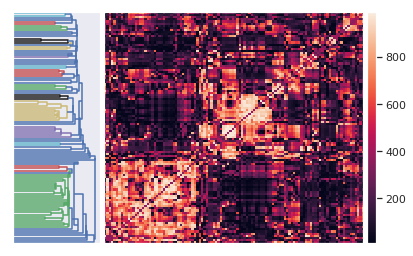

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_4_5t_190718_091732/goodPlayback-e17-c1.pkl


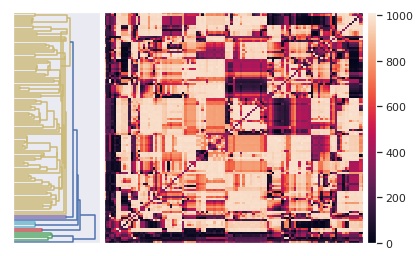

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e10-c65.pkl


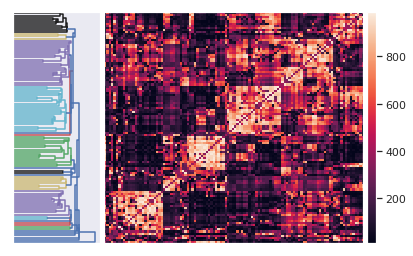

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e17-c31.pkl


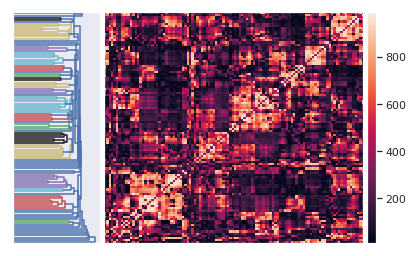

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_7t_190806_115742/goodPlayback-e19-c32.pkl


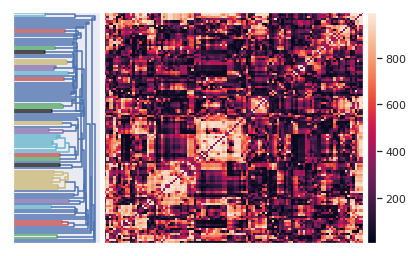

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF7F/ZF7F_5_5t_190722_121506/goodPlayback-e19-c58.pkl


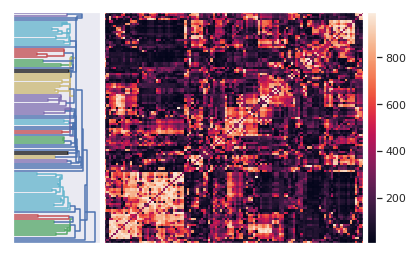

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c31.pkl


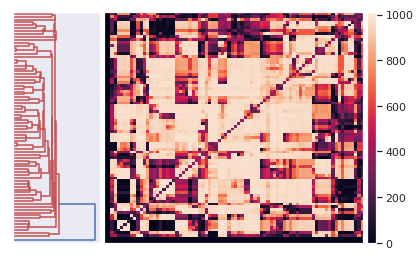

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c86.pkl


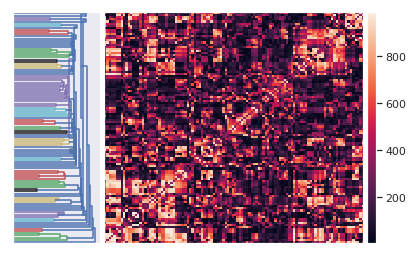

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c85.pkl


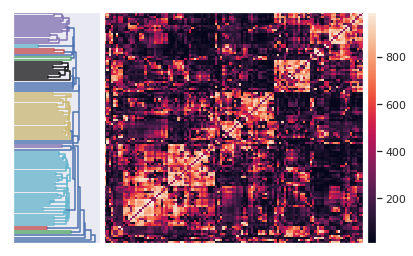

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e18-c84.pkl


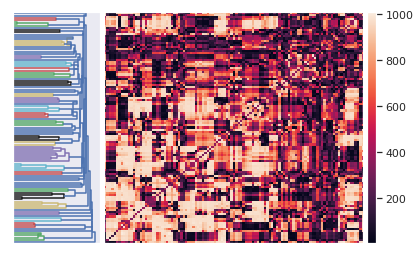

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_7t_190625_154417/goodPlayback-e12-c34.pkl


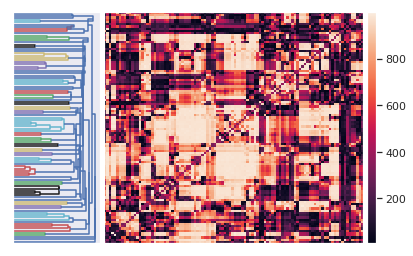

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_8t_190627_132428/goodPlayback-e12-c76.pkl


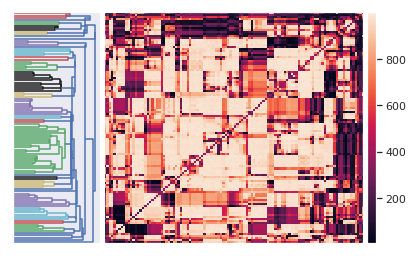

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_9t_190630_100846/goodPlayback-e10-c79.pkl


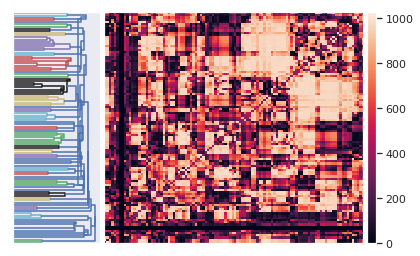

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c65.pkl


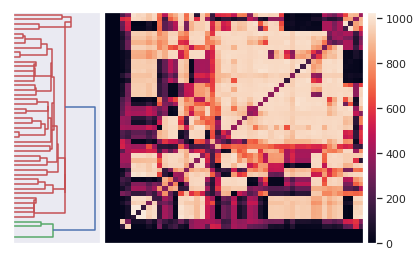

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10t_190702_095313/goodPlayback-e10-c67.pkl


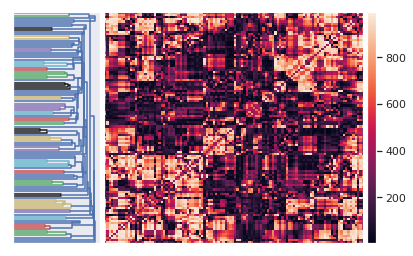

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c29.pkl


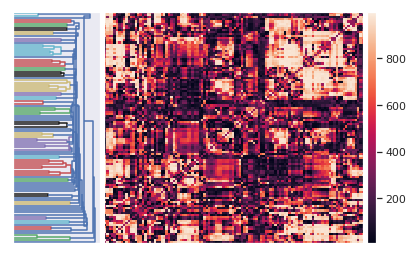

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_10_5t_190703_133641/goodPlayback-e10-c28.pkl


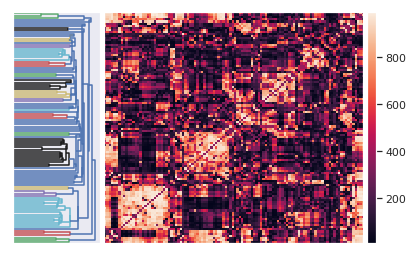

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c51.pkl


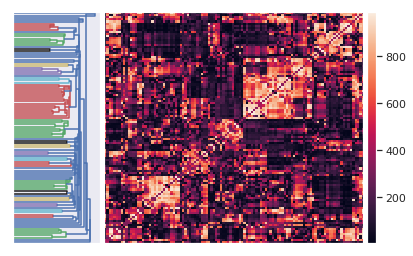

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e10-c52.pkl


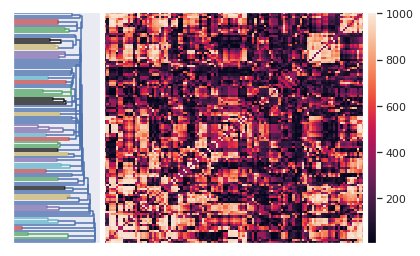

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_100420/goodPlayback-e13-c14.pkl


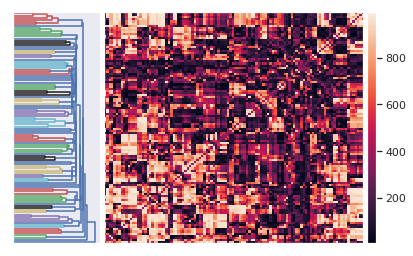

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF5M/ZF5M_11t_190704_121850/goodPlayback-e10-c72.pkl


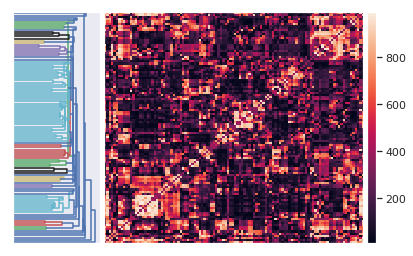

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e17-c3.pkl


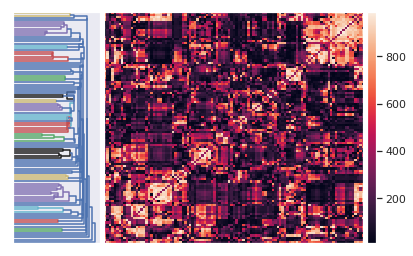

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190611_160843/goodPlayback-e9-c13.pkl


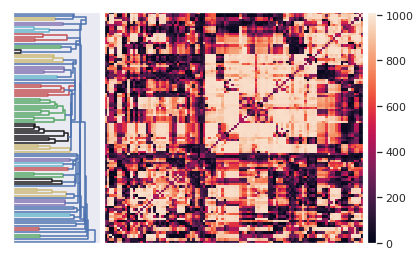

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e16-c66.pkl


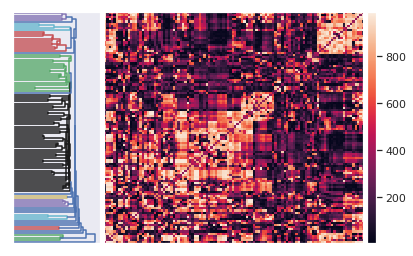

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c38.pkl


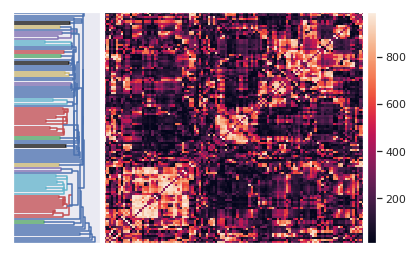

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e17-c36.pkl


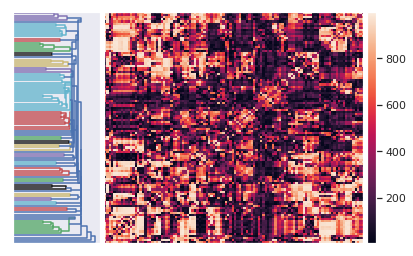

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_101201/goodPlayback-e18-c4.pkl


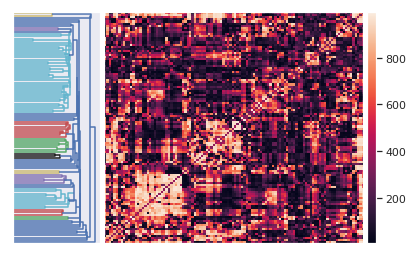

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e10-c1.pkl


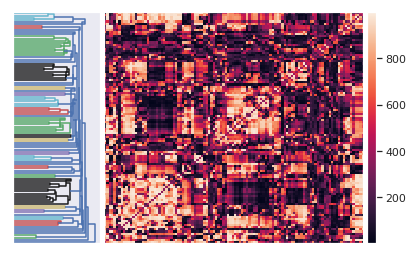

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e16-c96.pkl


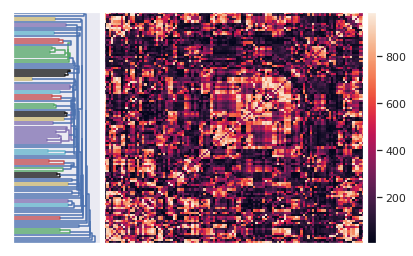

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c57.pkl


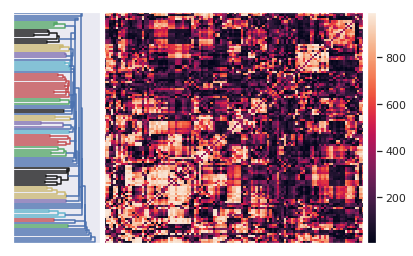

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190612_134337/goodPlayback-e17-c58.pkl


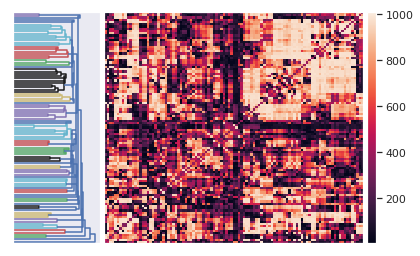

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c92.pkl


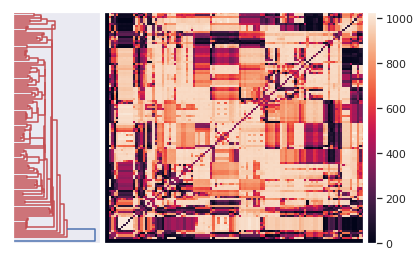

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_2t_190613_101015/goodPlayback-e17-c88.pkl


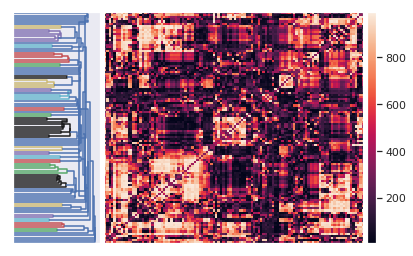

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e10-c36.pkl


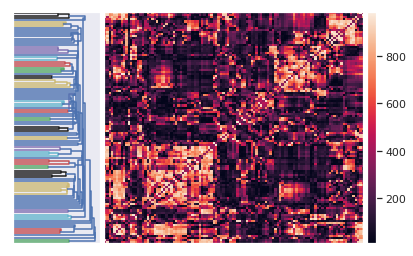

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c97.pkl


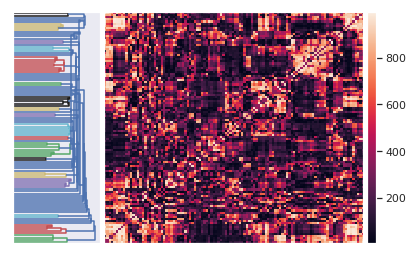

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e17-c99.pkl


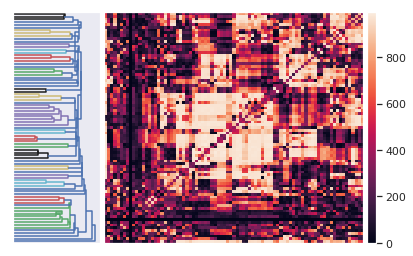

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e18-c59.pkl


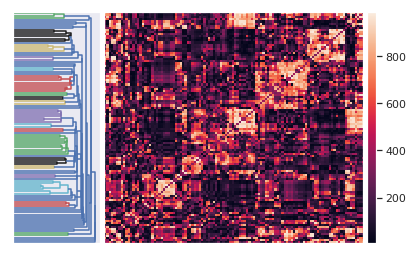

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e19-c56.pkl


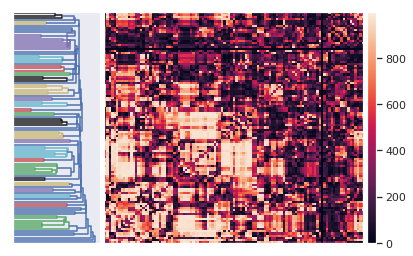

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_3t_190613_150928/goodPlayback-e9-c22.pkl


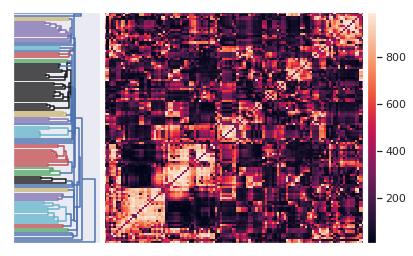

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e10-c44.pkl


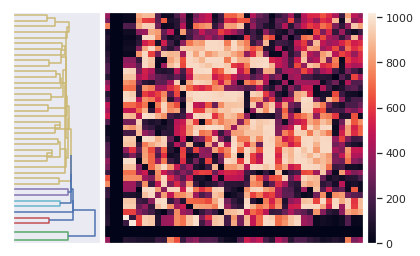

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c136.pkl


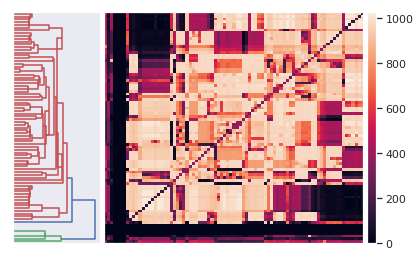

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e17-c137.pkl


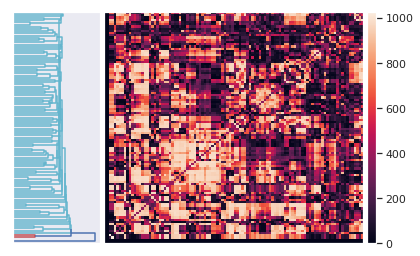

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e18-c109.pkl


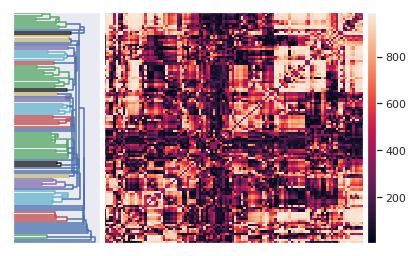

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190615_114154/goodPlayback-e20-c56.pkl


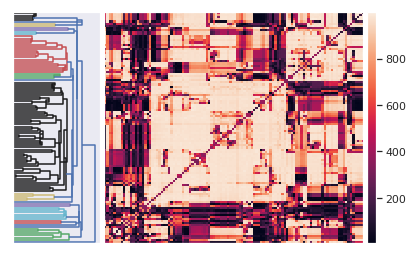

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e12-c1.pkl


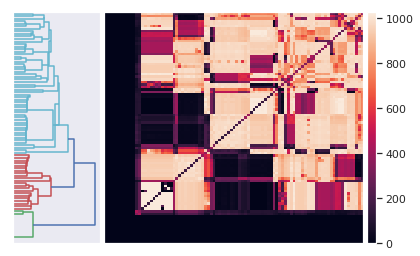

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e18-c7.pkl


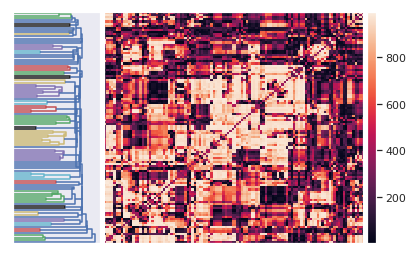

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c4.pkl


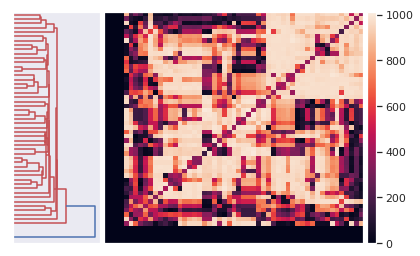

--------------
/auto/zdrive/lthomas/goodpkls/birds/ZF4F/ZF4F_5t_190616_102456/goodPlayback-e19-c5.pkl


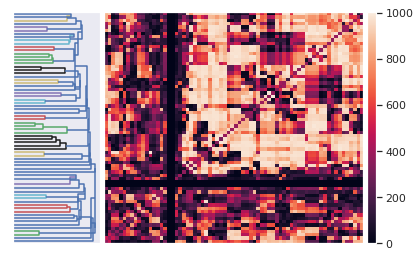

In [49]:
good_inds = (summary['zAud'] > .5)&(summary['selInd'] > .1)
for ind,row in summary[good_inds].iterrows():
    inPath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
    print("--------------")
    print(inPath)
    fileIn = open(inPath, 'rb')
    unitInfo = pk.load(fileIn)
    dfAbsTime = pk.load(fileIn)
    dfRelTime = pk.load(fileIn)
    fileIn.close()
    dfRelTime = dfRelTime[dfRelTime["call_type"].astype(bool)]
    
    t_inds = np.logical_and(dfRelTime['tKDE'][0] >= -.1,dfRelTime['tKDE'][0] < 2.0)# was .6
    PSTH_KDES = np.zeros((len(dfRelTime),sum(t_inds)))
    for i in range(len(dfRelTime)):
        if dfRelTime['spikeKDE'][i][t_inds].sum() > 0:
            PSTH_KDES[i,:] = dfRelTime['spikeKDE'][i][t_inds]
    ret = multitapered_coherence([PSTH_KDES])
    D = ret['coherence'].sum(axis=2)
    fig = pylab.figure()
    axdendro = fig.add_axes([0.09,0.1,0.2,0.8])
    Y = sch.linkage(D, method='centroid')
    Z = sch.dendrogram(Y, orientation='right')
    axdendro.set_xticks([])
    axdendro.set_yticks([])

    # Plot distance matrix.
    axmatrix = fig.add_axes([0.3,0.1,0.6,0.8])
    index = Z['leaves']
    D = D[index,:]
    D = D[:,index]
    im = axmatrix.matshow(D, aspect='auto', origin='lower')
    axmatrix.set_xticks([])
    axmatrix.set_yticks([])

    # Plot colorbar.
    axcolor = fig.add_axes([0.91,0.1,0.02,0.8])
    pylab.colorbar(im, cax=axcolor)

    # Display and save figure.
    fig.show()
    plt.show()

In [ ]:
import scipy
import pylab
import scipy.cluster.hierarchy as sch

# Generate features and distance matrix.
x = scipy.rand(40)
D = scipy.zeros([40,40])
for i in range(40):
    for j in range(40):
        D[i,j] = abs(x[i] - x[j])

# Compute and plot dendrogram.
fig = pylab.figure()
axdendro = fig.add_axes([0.09,0.1,0.2,0.8])
Y = sch.linkage(D, method='centroid')
Z = sch.dendrogram(Y, orientation='right')
axdendro.set_xticks([])
axdendro.set_yticks([])

# Plot distance matrix.
axmatrix = fig.add_axes([0.3,0.1,0.6,0.8])
index = Z['leaves']
D = D[index,:]
D = D[:,index]
im = axmatrix.matshow(D, aspect='auto', origin='lower')
axmatrix.set_xticks([])
axmatrix.set_yticks([])

# Plot colorbar.
axcolor = fig.add_axes([0.91,0.1,0.02,0.8])
pylab.colorbar(im, cax=axcolor)

# Display and save figure.
fig.show()
fig.savefig('dendrogram.png')

In [42]:
a.sum(axis=2).shape

(110, 110)

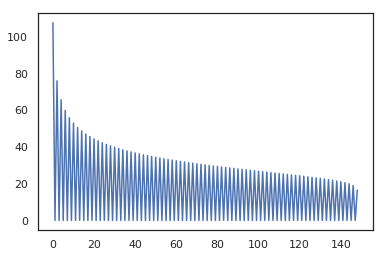

In [67]:
import numpy as np

In [74]:
import pandas as pd
single_wav = pd.read_csv("SingleWav.txt")
multi_wav = pd.read_csv("MultiWav.txt")

ParserError: Error tokenizing data. C error: Expected 7 fields in line 12, saw 9


## Julie Data

In [1]:
results = drive_service.files().list(pageSize=10, q="name='summarySelJulie.pkl'",fields="files(id, name,parents)").execute()
downloadfid(results['files'][0]['id'],'/auto/zdrive/lthomas/julie/summarySelJulie.pkl')

NameError: name 'drive_service' is not defined

In [11]:
summary = pk.load(open("/auto/zdrive/lthomas/julie/summarySelJulie.pkl",'rb'))
summary[(summary['zAud'] > .5)&(summary['selInd'] > .1)].shape

(208, 12)

In [20]:
sites = list(set(zip(summary.site,summary.bird)))
for site,subject in sites:
    print("Site: %s \t Bird: %s \t Count %d"%(site,subject,((summary.site==site) & (summary.bird==subject)).sum()))

Site: L2500R2300 	 Bird: BlaBro09xxF 	 Count 60
Site: L2000R1600 	 Bird: BlaBro09xxF 	 Count 53
Site: L1500R1900 	 Bird: GreBlu9508M 	 Count 72
Site: L1400R1400 	 Bird: LblBlu2028M 	 Count 56
Site: L2450R2350 	 Bird: WhiWhi4522M 	 Count 67
Site: L1500R1450 	 Bird: WhiWhi4522M 	 Count 55
Site: L1100R1450 	 Bird: GreBlu9508M 	 Count 82
Site: L2100R2050 	 Bird: WhiWhi4522M 	 Count 71
Site: L1900R1800 	 Bird: WhiWhi4522M 	 Count 71
Site: L1100R1275 	 Bird: WhiWhi4522M 	 Count 46
Site: L500R400 	 Bird: YelBlu6903F 	 Count 51
Site: L750R1100 	 Bird: GreBlu9508M 	 Count 74
Site: L1500R1500 	 Bird: BlaBro09xxF 	 Count 47
Site: L1250R1650 	 Bird: GreBlu9508M 	 Count 69
Site: L1500R1500 	 Bird: YelBlu6903F 	 Count 81
Site: L1000R900 	 Bird: YelBlu6903F 	 Count 83
Site: L1200R1200 	 Bird: YelBlu6903F 	 Count 83
Site: L1800R2100 	 Bird: GreBlu9508M 	 Count 86


In [4]:
#for ind,row in summary[(summary['zAud'] > .5)&(summary['selInd'] > .1)].iterrows():
sites = list(set(zip(summary.site,summary.bird)))
for site,subject in sites:
    print("Beginning: %s %s"%(site, subject))
    for ind,row in summary[(summary.bird == subject) & (summary.site == site)].iterrows():
    #for ind,row in summary[summary['site'] == 'L1500R1500'].iterrows():
        row.unit = row.unit.split('/')[-1]
        results = drive_service.files().list(pageSize=10, q="name='%s'"%row.unit,fields="files(id, name,parents)").execute()

        print(results)
        outpath = "/auto/zdrive/lthomas/julie/goodpkls/birds/%s/%s/"%(row['bird'],row['site'])
        os.makedirs(outpath,exist_ok=True)
        if os.path.exists("%s%s"%(outpath,row['unit'])):
            print("skipping %s%s"%(outpath,row['unit']))
            continue
        if len(results['files']) == 1:
            print("direct dl to %s%s"%(outpath,row['unit']))
            downloadfid(results['files'][0]['id'],"%s%s"%(outpath,row['unit']))
        else:
            for finfo in results['files']:
                if(row['bird'] == get_name_parent(get_name_parent(finfo['parents'][0]))['name']):
                    print("direct dl to %s%s"%(outpath,row['unit']))
                    downloadfid(results['files'][0]['id'],"%s%s"%(outpath,row['unit']))
                    continue

{'files': [{'parents': ['1WJPdAO8IVvOKLkUuYc5qe0WL8s2BeyGF'], 'id': '1WVgTWMsnZ73GIdHqEAXoEY-_y4w7PCmB', 'name': 'Site1_L1500R1500_e31_s0_ss1.pkl'}]}
skipping /auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L1500R1500/Site1_L1500R1500_e31_s0_ss1.pkl
{'files': [{'parents': ['1WJPdAO8IVvOKLkUuYc5qe0WL8s2BeyGF'], 'id': '1WcVWq5KSeJVK4T2XNDXTeoRXGGQwH7HC', 'name': 'Site1_L1500R1500_e22_s0_ss1.pkl'}]}
skipping /auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L1500R1500/Site1_L1500R1500_e22_s0_ss1.pkl
{'files': [{'parents': ['1WJPdAO8IVvOKLkUuYc5qe0WL8s2BeyGF'], 'id': '1Wi81nhiJVqnrNl0nhezjgFAu9Ss6Yz5E', 'name': 'Site1_L1500R1500_e14_s0_ss1.pkl'}]}
skipping /auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L1500R1500/Site1_L1500R1500_e14_s0_ss1.pkl
{'files': [{'parents': ['1WJPdAO8IVvOKLkUuYc5qe0WL8s2BeyGF'], 'id': '1WuAkGSfgan5HdWjWHAqDJm4Bj6wmX2dZ', 'name': 'Site1_L1500R1500_e15_s0_ss1.pkl'}]}
skipping /auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L1500R1500/Site1_L1

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2000R1600/Site2_L2000R1600_e22_s1_ss2.pkl
-------------
ARI: 0.14260955764300773


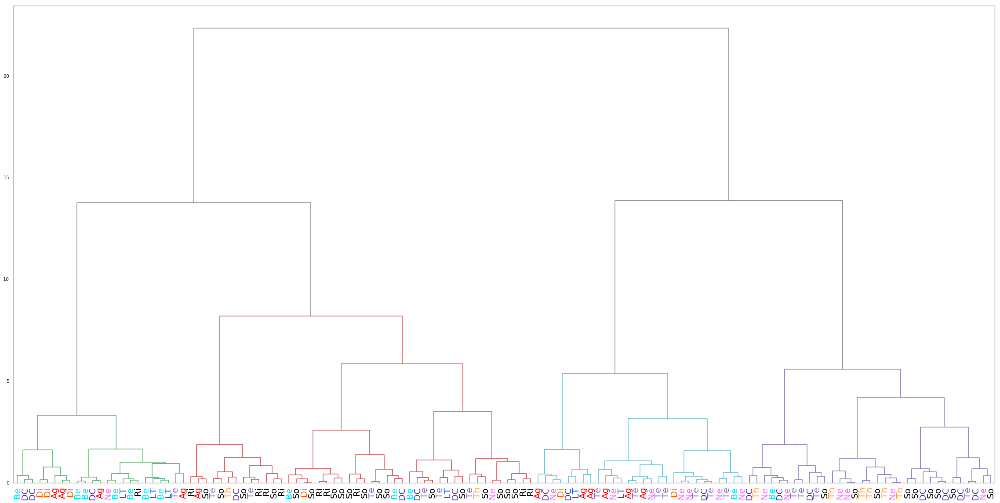

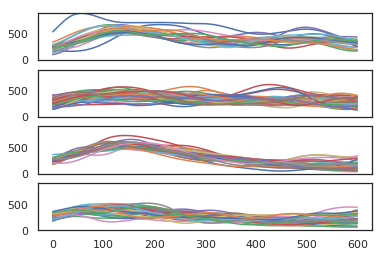

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L1500R1500/Site1_L1500R1500_e18_s0_ss2.pkl
-------------
ARI: 0.28019149966094103


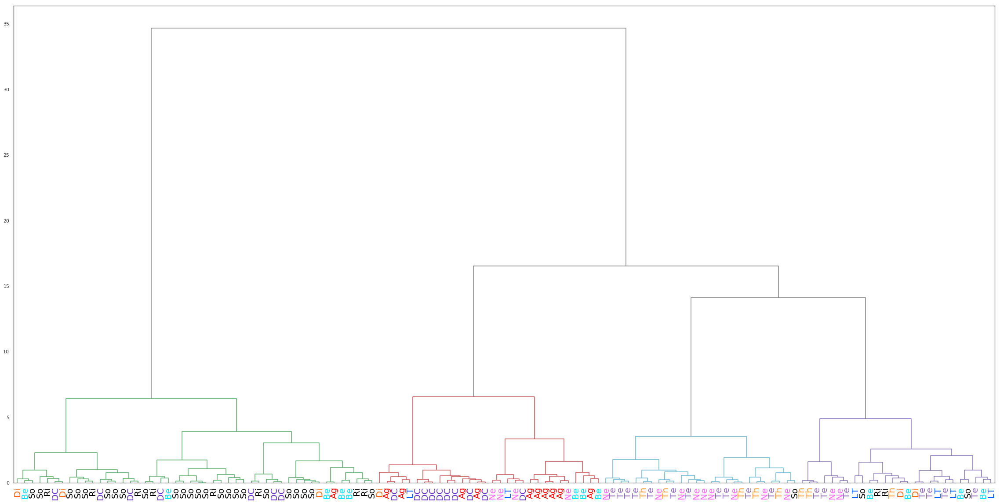

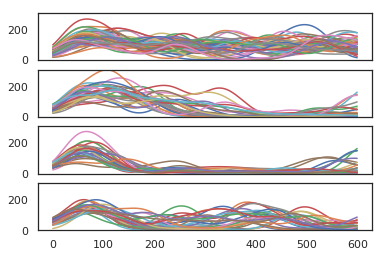

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2000R1600/Site2_L2000R1600_e20_s1_ss2.pkl
-------------
ARI: 0.24273955005022435


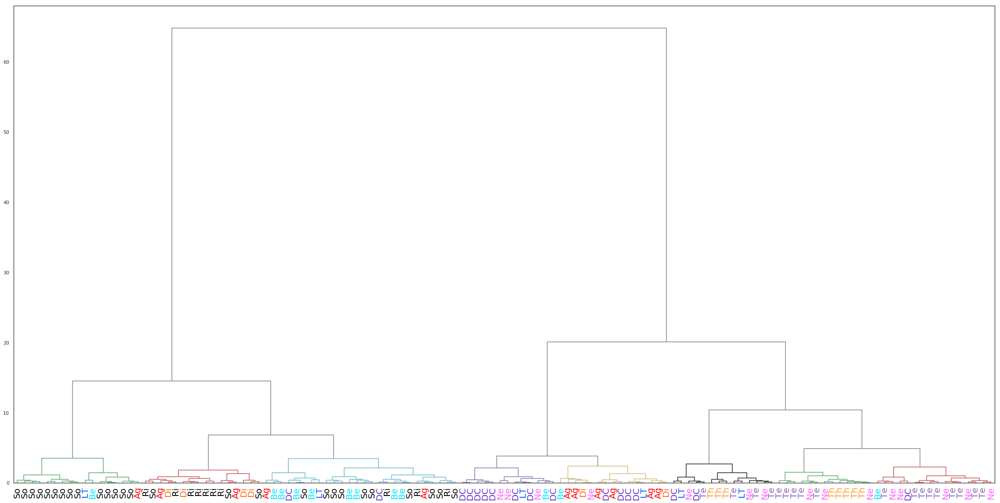

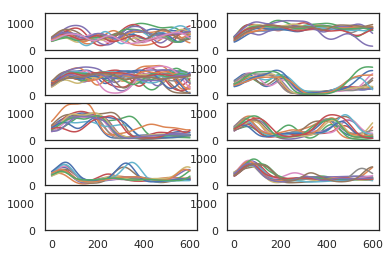

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2500R2300/Site3_L2500R2300_e18_s0_ss1.pkl
-------------
ARI: 0.133115218763742


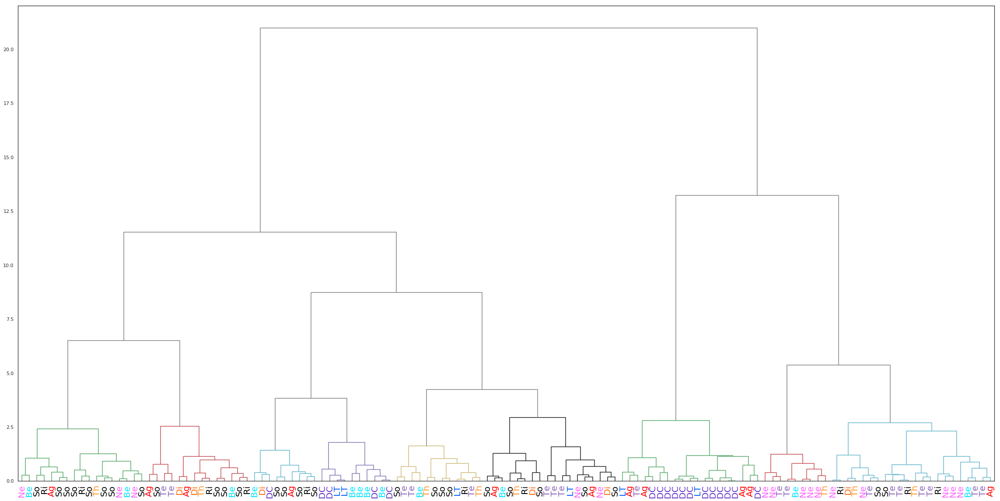

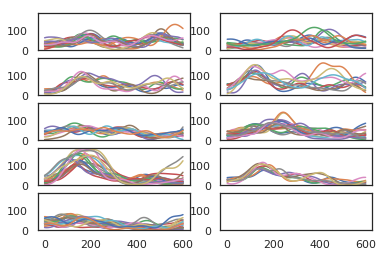

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2000R1600/Site2_L2000R1600_e19_s1_ss2.pkl
-------------
ARI: 0.26182607167686583


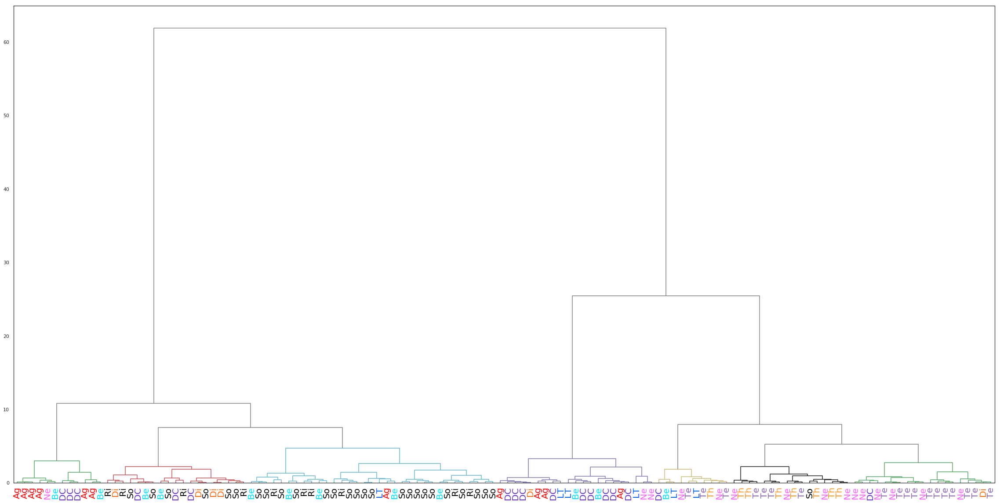

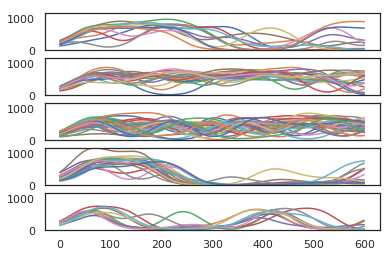

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2500R2300/Site3_L2500R2300_e19_s1_ss1.pkl
-------------
ARI: 0.14751356283958084


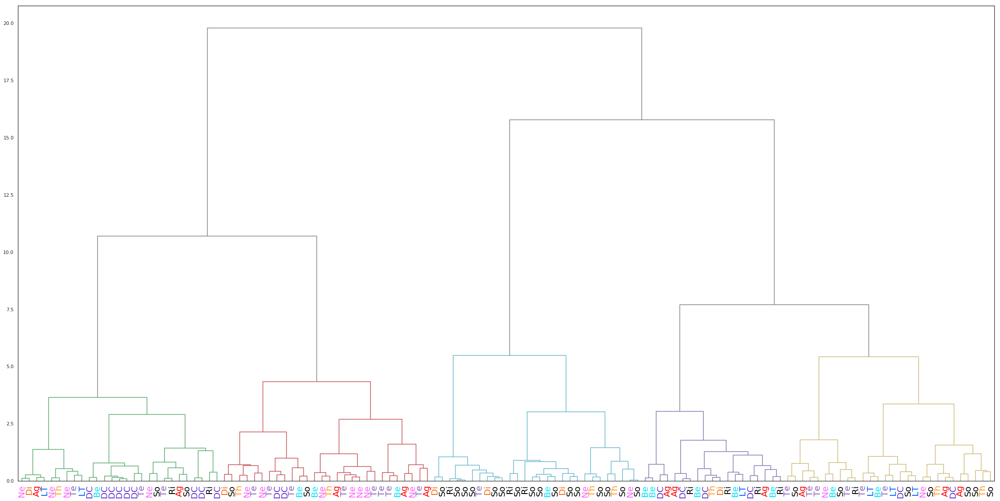

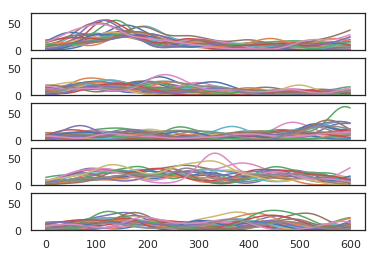

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2000R1600/Site2_L2000R1600_e20_s1_ss1.pkl
-------------
ARI: 0.24131741520570357


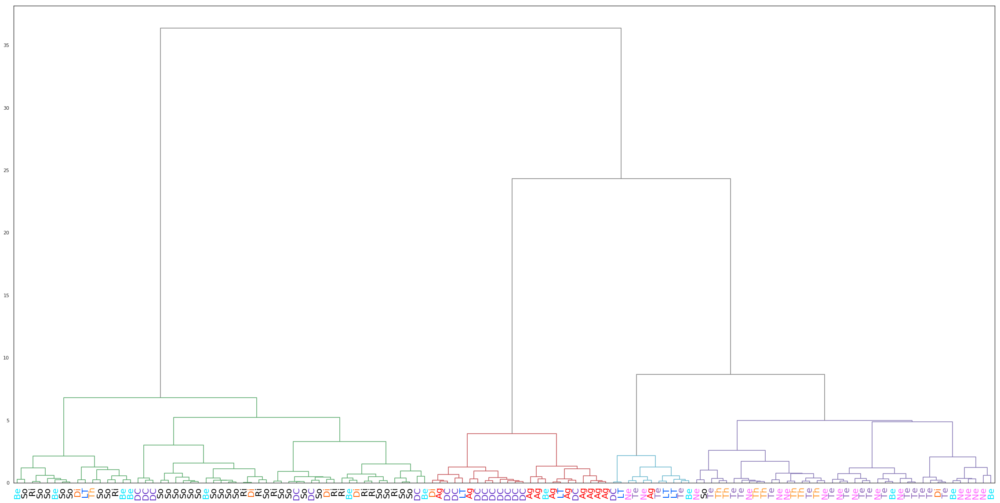

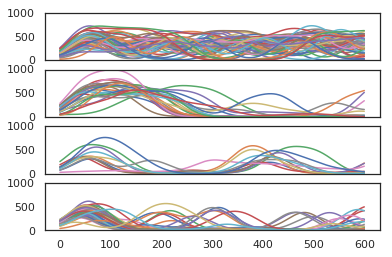

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2500R2300/Site3_L2500R2300_e21_s1_ss1.pkl
-------------
ARI: 0.16243152168150843


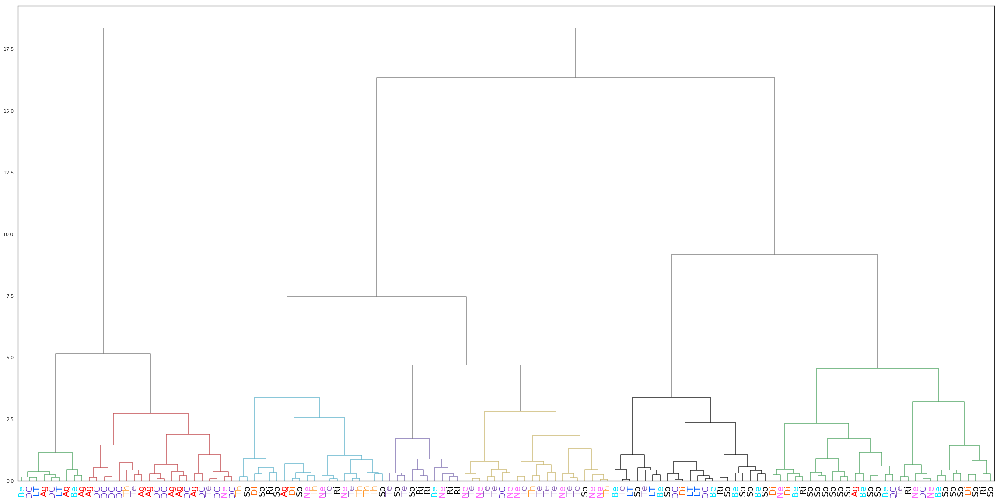

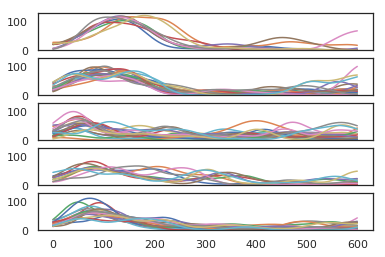

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2500R2300/Site3_L2500R2300_e19_s0_ss1.pkl
-------------
ARI: 0.17510918606749684


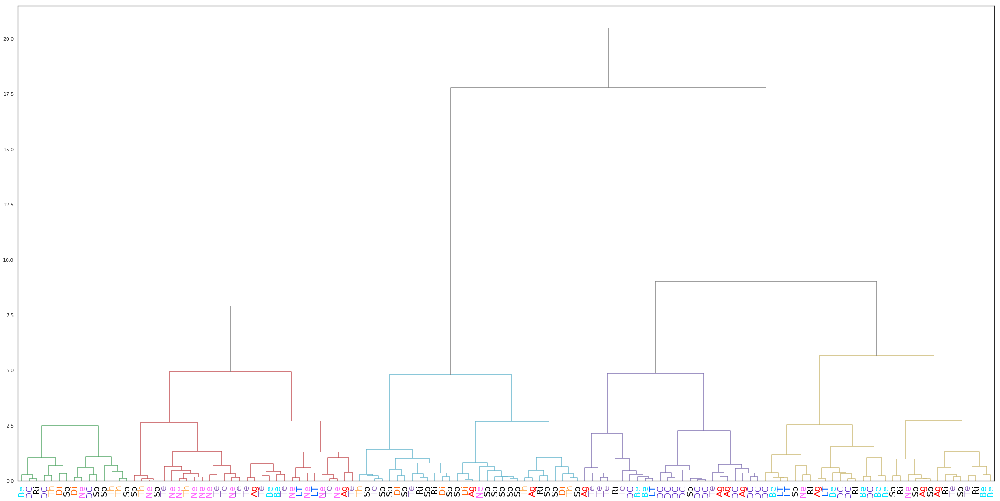

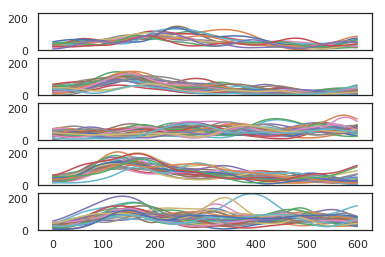

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2000R1600/Site2_L2000R1600_e3_s1_ss1.pkl
-------------
ARI: 0.17439346529826863


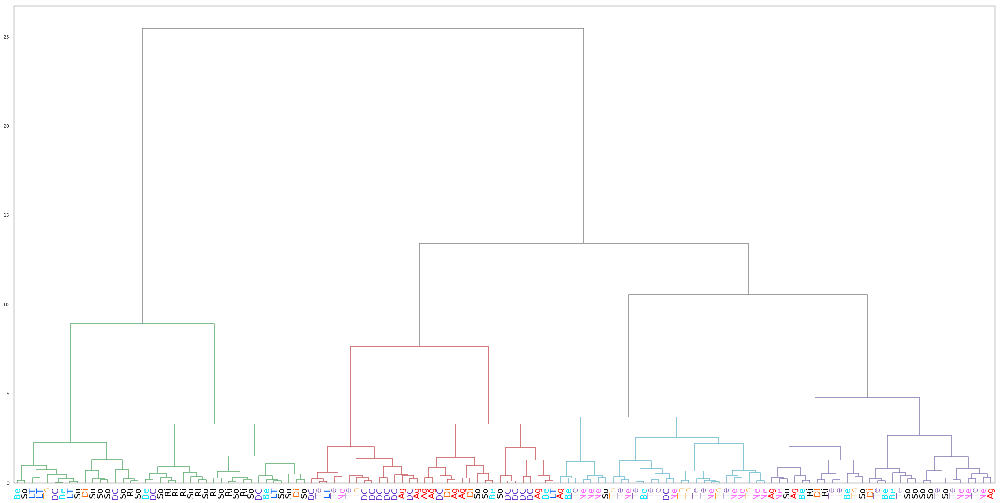

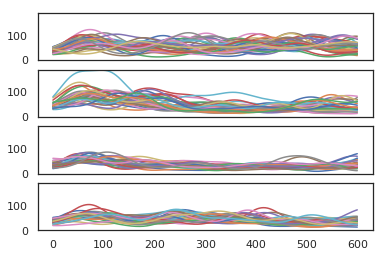

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2500R2300/Site3_L2500R2300_e20_s1_ss1.pkl
-------------
ARI: 0.1429406654683773


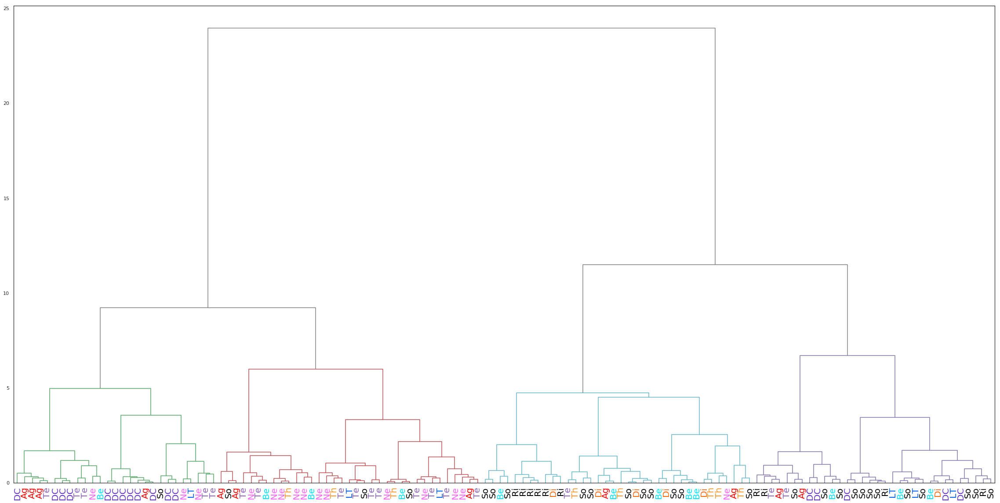

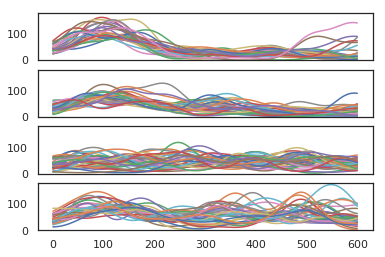

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L1500R1500/Site1_L1500R1500_e17_s0_ss1.pkl
-------------
ARI: 0.1264940987307661


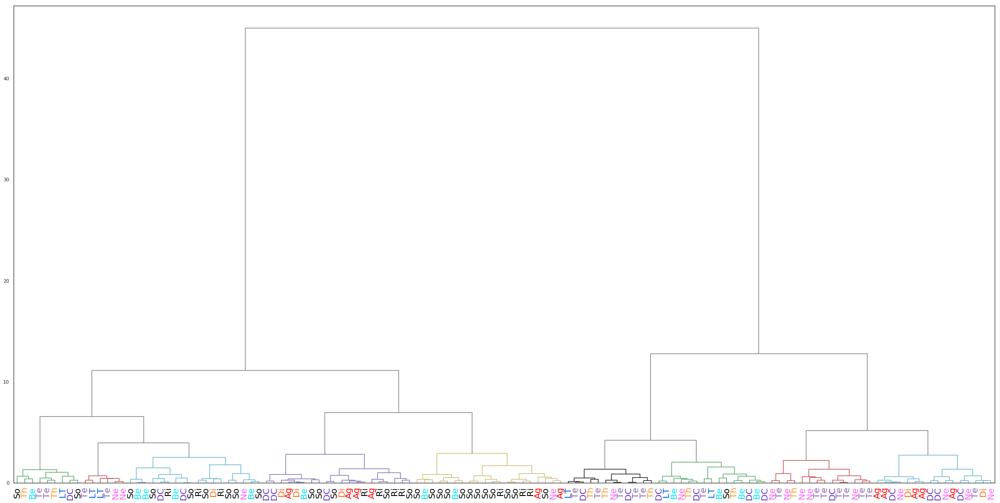

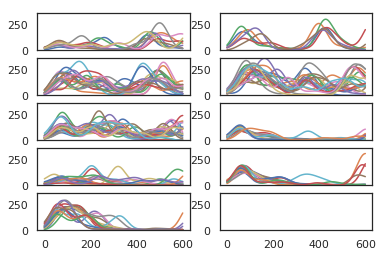

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2500R2300/Site3_L2500R2300_e20_s1_ss2.pkl
-------------
ARI: 0.27145522971313074


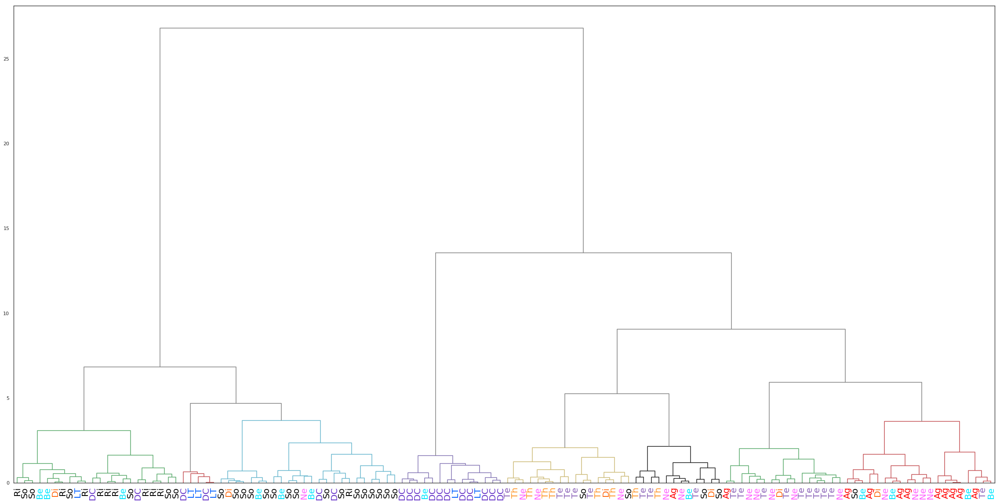

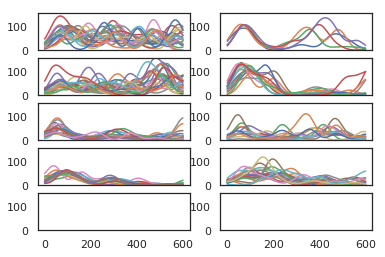

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L1500R1500/Site1_L1500R1500_e16_s0_ss1.pkl
-------------
ARI: 0.20573006413631428


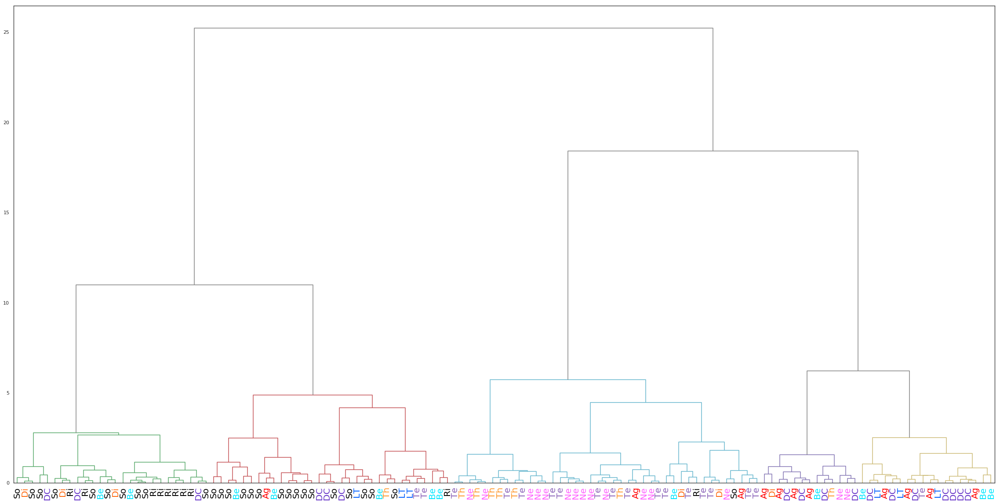

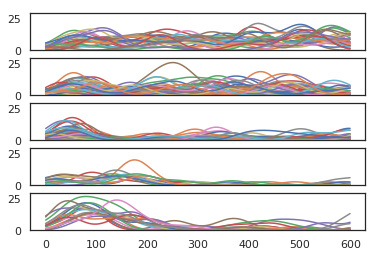

/auto/zdrive/lthomas/julie/goodpkls/birds/BlaBro09xxF/L2500R2300/Site3_L2500R2300_e18_s0_ss2.pkl
-------------
ARI: 0.18608565510675798


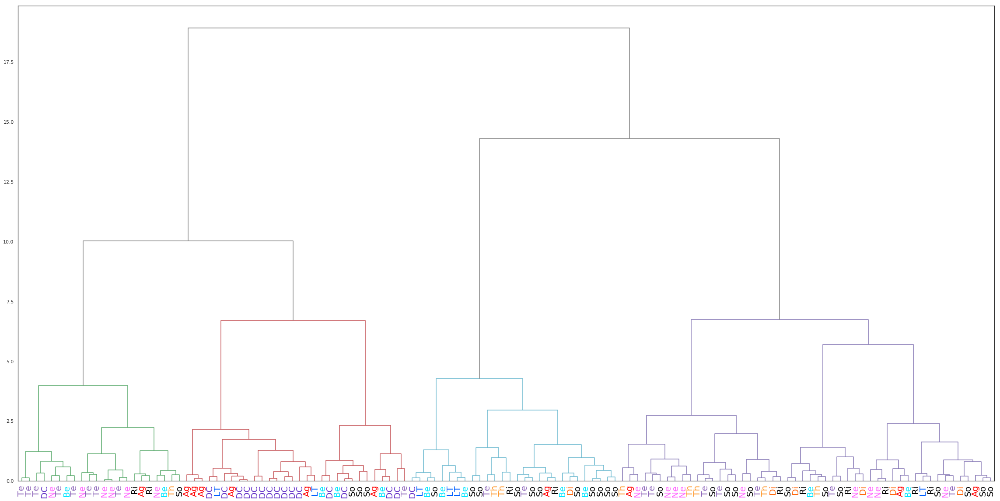

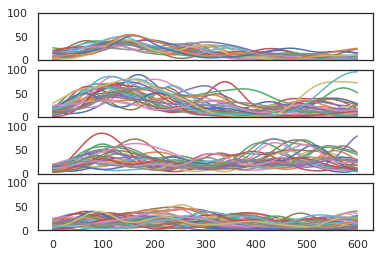

/auto/zdrive/lthomas/julie/goodpkls/birds/GreBlu9508M/L1500R1900/Site4_L1500R1900_e21_s0_ss1.pkl
-------------
ARI: 0.22447739838465067


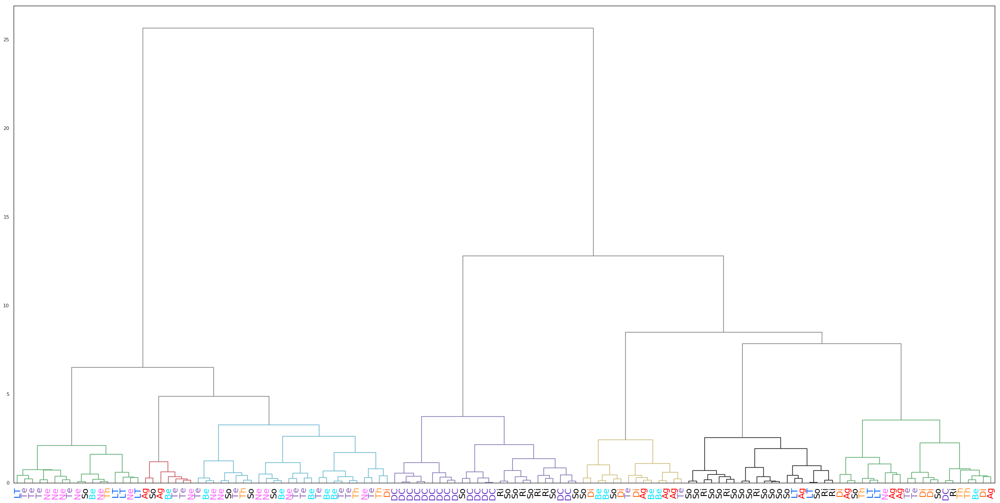

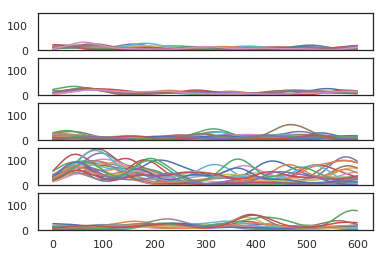

/auto/zdrive/lthomas/julie/goodpkls/birds/GreBlu9508M/L1100R1450/Site2_L1100R1450_e22_s0_ss2.pkl
-------------
ARI: 0.28220527203001394


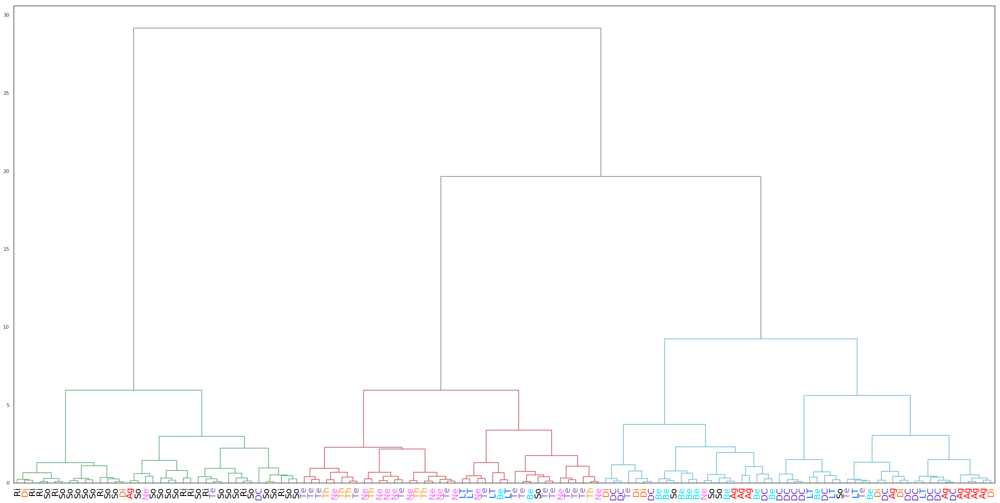

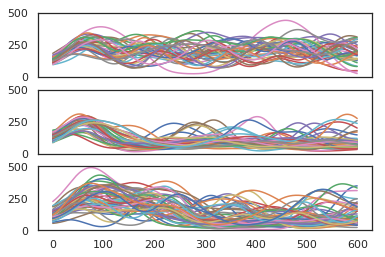

/auto/zdrive/lthomas/julie/goodpkls/birds/GreBlu9508M/L1500R1900/Site4_L1500R1900_e23_s0_ss3.pkl
-------------
ARI: 0.16789563244469655


KeyboardInterrupt: 

In [11]:
aris = []
for ind,row in summary[(summary['zAud'] > .5)&(summary['selInd'] > .1)].iterrows():
    row.unit = row.unit.split('/')[-1]
    inPath = "/auto/zdrive/lthomas/julie/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
    #inPath = "/auto/zdrive/lthomas/goodpkls/birds/%s/%s/%s"%(row['bird'],row['site'],row['unit'])
    print(inPath)
    fileIn = open(inPath, 'rb')
    unitInfo = pk.load(fileIn)
    dfAbsTime = pk.load(fileIn)
    dfRelTime = pk.load(fileIn)
    fileIn.close()
    # only take data for times we know the call type
    dfRelTime = dfRelTime[dfRelTime["call_type"].astype(bool)]
    t_inds = np.logical_and(dfRelTime['tKDE'][0] >= 0,dfRelTime['tKDE'][0] <= .6)
    PSTH_KDES_first_600 = np.zeros((len(dfRelTime),sum(t_inds)))
    for i in range(len(dfRelTime)):
        if dfRelTime['spikeKDE'][i][t_inds].sum() > 0:
            PSTH_KDES_first_600[i,:] = dfRelTime['spikeKDE'][i][t_inds]
    F,ari,pcs,grps = cluster_analysis(PSTH_KDES_first_600,dfRelTime['call_type'][:],and_plot=True, use_umap=True,save="/auto/zdrive/lthomas/figs/%s_HAC.pdf"%(row['unit'].split('.')[0]))
    #plt.savefig("/auto/zdrive/lthomas/figs/%s_HAC_ARI_%.2f.pdf"%(row['unit'].split('.')[0],ari))
    aris.append(ari)

    #if ari < .09:
    #    os.remove("/auto/zdrive/lthomas/julie/figs/%s_HAC.pdf"%(row['unit'].split('.')[0]))
    #    continue

    plot_groupings(PSTH_KDES_first_600,F, save = "/auto/zdrive/lthomas/julie/figs/%s_GROUP_ARI_%.2f.pdf"%(row['unit'].split('.')[0],ari))
    #plt.savefig("/auto/zdrive/lthomas/figs/%s_GROUP_ARI_%.2f.pdf"%(row['unit'].split('.')[0],ari))


In [5]:
cluster_analysis?

In [30]:
get_name_parent(get_name_parent(finfo['parents'][0]))['name']

NameError: name 'finfo' is not defined

In [48]:
from importlib import reload  


In [51]:
del cluster_analysis

In [54]:
dfRelTime

,file,relation_short,call_type,nTrials,trialInd,tStim,stimWav,micWav,spikeTimes,tKDE,spikeKDE,tMic
0,WhiWhi1415_FAF_Ne_3-8-9.wav,FAF,Ne,10,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-1.0113842500000487, -1.0088448500000027, -1...","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[194.85856396261156, 194.1427686522371, 193.45...",[]
1,WhiWhi1415_FAF_Ne_6-4-5.wav,FAF,Ne,11,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-1.0105650400000172, -0.8954675200000111, -0...","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[181.05574489452994, 182.9756208361195, 184.87...",[]
2,WhiWhi1415_FAF_Ne_7-2-10.wav,FAF,Ne,10,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-0.9841868899999895, -0.8907160800000042, -0...","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[257.8880554438863, 258.7118142838284, 259.512...",[]
3,WhiWhi1415_FAF_Te_10-9-3.wav,FAF,Te,11,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-0.9981131599999884, -0.9941809199999909, -0...","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[244.03079104712032, 244.3972266543618, 244.72...",[]
4,WhiWhi1415_FAF_Te_4-6-2.wav,FAF,Te,11,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-1.0021274100000142, -1.000243189999992, -0....","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[169.8253740160965, 169.17194966538162, 168.49...",[]
5,WhiWhi1415_FAF_Te_8-7-5.wav,FAF,Te,11,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-1.0017998200000306, -0.9994242200000372, -0...","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[195.2458079906386, 194.8797068668561, 194.475...",[]
6,WhiWhi1415_FAF_Th_10-7-6.wav,FAF,Th,10,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-1.0045850300000154, -0.9803776800000037, -0...","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[237.2094069229758, 238.83416215045057, 240.47...",[]
7,WhiWhi1415_FAF_Th_3-8-5.wav,FAF,Th,11,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-0.9971711600000006, -0.9942221700000005, -0...","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[350.0906486616663, 351.89708097705403, 353.65...",[]
8,WhiWhi1415_FAF_Th_9-2-4.wav,FAF,Th,11,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-0.9923789500000453, -0.9319629600000212, -0...","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[256.966078842784, 256.92096461684724, 256.922...",[]
9,BluRas07dd_FAS_Ag_1.wav,FAS,Ag,10,[],"[-0.5, -0.4999590398951421, -0.499918079790284...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[],"[[-0.9469542499999761, -0.6164069199999744, -0...","[-0.5, -0.499, -0.498, -0.497, -0.496, -0.495,...","[323.1175769190892, 322.3068208830862, 321.487...",[]
